## Import all we need.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


import matplotlib as mpl
import rdkit, rdkit.Chem, rdkit.Chem.Draw
from rdkit.Chem.Draw import IPythonConsole

from rdkit.Chem import Draw
from rdkit.Chem.Draw import rdMolDraw2D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import io
import PIL.Image
from PIL import ImageDraw, ImageFont


import numpy as np
import mordred, mordred.descriptors
from mordred import HydrogenBond, Polarizability
from mordred import SLogP, AcidBase, BertzCT, Aromatic, BondCount, AtomCount
from mordred import Calculator

import exmol as exmol
from rdkit.Chem.Draw import rdDepictor
import os
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, plot_roc_curve
from sklearn.multioutput import MultiOutputRegressor
from sklearn.linear_model import Ridge

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
rdDepictor.SetPreferCoordGen(True)

IPythonConsole.ipython_useSVG = True
color_cycle = ["#F06060", "#1BBC9B", "#F3B562", "#6e5687", "#5C4B51"]
mpl.rcParams["axes.prop_cycle"] = mpl.cycler(color=color_cycle)
np.random.seed(0)
import joblib
import pickle

import pubchempy as pcp


ModuleNotFoundError: No module named 'exmol'

### Below I define a bunch of functions before I start running the models, so as to structure the code so I can focus later on the resulst of the Explainer.<br>
I need to check to make sure that the beta that I calculate here in lime_explain is compatible with rcf_explain.<br>
I need to describe the difference between lime_explain and rcf_explain.

In [ ]:
# set up the calculate feature importance function
def calc_feature_importance(descriptors, tstats):
    from collections import OrderedDict

    feature_importance = {a: b for a, b in zip(descriptors, tstats) if not np.isnan(b)}
    feature_importance = dict(
        sorted(feature_importance.items(), key=lambda item: abs(item[1]), reverse=True)
    )
    # Fitted space important features
    return feature_importance


# def get_beta (space, desc_type: str, radius):
#     for d in desc_type:
#         beta = exmol.lime_explain(space, descriptor_type=d, radius)
#         if d == "ecfp":
#             exmol.plot_descriptors(space, radius = 12, output_file=f"{d}.svg")
#             # plt.close() is used to close the figure window because
#             # it seems not to be needed here, but is nevertheless saled to file
#             # I just commented out this line from the original code to see what it was doing
#             # plt.close()
#         else:
#             exmol.plot_descriptors(space, radius = 12)
#     return beta

def get_beta (space, desc_type: str, return_beta, return_examples, radius, similarity_threshold):
    
    beta = exmol.lime_explain(space, desc_type, return_beta, return_examples, radius, similarity_threshold)
    if desc_type == "ecfp":
        exmol.plot_descriptors(space, radius = radius, output_file=f"{desc_type}.svg")
        # plt.close() is used to close the figure window because
        # it seems not to be needed here, but is nevertheless saled to file
        # I just commented out this line from the original code to see what it was doing
        # plt.close()
    else:
        exmol.plot_descriptors(space, radius = radius)
    return beta

#lime explain
def ind_explainers(space, desc_type, return_beta: bool, return_examples: bool, radius, similarity_threshold):
    desc_type = ["Classic",
                  "maccs",
                     "ecfp", "chromophore", "expanded_chromophore"]
    #descriptor type list
    for d in desc_type:
        beta = exmol.lime_explain(space, descriptor_type=d, return_beta = return_beta, return_examples = return_examples, radius = radius, similarity_threshold = similarity_threshold)
        if d == "ecfp":
            exmol.plot_descriptors(space, radius, output_file=f"{d}.svg")
            # plt.close() is used to close the figure window because
            # it seems not to be needed here, but is nevertheless saled to file
            # I just commented out this line from the original code to see what it was doing
            # plt.close()
        else:
            exmol.plot_descriptors(space, radius)



# desc_type = ["Classic", "ecfp", "maccs"]
# The descriptor type that remains with the full "space" is the one that is done last.
# This would be the one that shows up on the parity plot later on.
# desc_type = ["Classic", "maccs", "ecfp"]
#descriptor type list


# This allows us to do a parity plot



def plot_parity (space, beta, similarity_threshold):
    fkw = {"figsize": (6, 4)}
    font = {"family": "normal", "weight": "normal", "size": 16}

    fig = plt.figure(figsize=(10, 5))
    mpl.rc("axes", titlesize=12)
    mpl.rc("font", size=16)
    ax_dict = fig.subplot_mosaic("AABBB")
    
    # Plot space by fit
    svg = exmol.plot_utils.plot_space_by_fit(
        space,
        [space[0]],
        figure_kwargs=fkw,
        mol_size=(200, 200),
        offset=1,
        ax=ax_dict["B"],
        beta=beta,
    )
    # Compute y_wls
    w = np.array([1 / (1 + (1 / (e.similarity + 0.000001) - 1) ** 5) for e in space])
    # print (w)
    non_zero = w > 10 ** (similarity_threshold)
    # show the number of true values in non_zero
    print (len(non_zero[non_zero == True]))

    # print (non_zero)
    w = w[non_zero]
    # this just resets the w values to only be the ones above threshold
    N = w.shape[0]
    # ys is just getting the previously predicted y values for all those molecules that are above threshold for similarity
    ys = np.array([e.yhat for e in space])[non_zero].reshape(N).astype(float)

    # x_mat is just getting the descriptors for all those molecules that are above threshold for similarity
    x_mat = np.array([list(e.descriptors.descriptors) for e in space])[non_zero].reshape(
        N, -1
    )
    # the descriptors ion x_mat are the features pulled from the most recently added descrioptor type in the space
    # beta is the weights for the features in x_mat
    # the @ is the matrix multiplication operator.
    print (f"x_mat shape is {x_mat.shape}")
    print (f"beta shape is {beta.shape}")
    y_wls = x_mat @ beta
    print (f"y_wls shape is {y_wls.shape}")
    # y_wls is added to the mean of ys because 
    y_wls += np.mean(ys)

    #lower and higher used to set plot limits
    lower = np.min(ys)
    higher = np.max(ys)

    # set transparency using w, i.e. the color will change based on the similarity of the molecule to the query molecule
    norm = plt.Normalize(min(w), max(w))
    cmap = plt.cm.Oranges(w)
    cmap[:, -1] = w

    # so when simiarity is high, w is close to 1
    def weighted_mean(x, w):
        return np.sum(x * w) / np.sum(w)


    def weighted_cov(x, y, w):
        return np.sum(w * (x - weighted_mean(x, w)) * (y - weighted_mean(y, w))) / np.sum(w)


    def weighted_correlation(x, y, w):
        return weighted_cov(x, y, w) / np.sqrt(
            weighted_cov(x, x, w) * weighted_cov(y, y, w)
        )

    # this just allows a weighted correlation to be calculated
    corr = weighted_correlation(ys, y_wls, w)

    ax_dict["A"].plot(
        np.linspace(lower, higher, 100), np.linspace(lower, higher, 100), "--", linewidth=2
    )
    sc = ax_dict["A"].scatter(ys, y_wls, s=50, marker=".", c=cmap, cmap=cmap)
    ax_dict["A"].text(max(ys) - 2, min(ys) + 0.5, f"weighted \ncorrelation = {corr:.3f}")
    ax_dict["A"].set_xlabel(r"$\hat{y}$")
    ax_dict["A"].set_ylabel(r"$g$")
    ax_dict["A"].set_title("Weighted Least Squares Fit")
    ax_dict["A"].set_xlim(lower, higher)
    ax_dict["A"].set_ylim(lower, higher)
    ax_dict["A"].set_aspect(1.0 / ax_dict["A"].get_data_ratio(), adjustable="box")
    sm = plt.cm.ScalarMappable(cmap=plt.cm.Oranges, norm=norm)
    cbar = plt.colorbar(sm, orientation="horizontal", pad=0.15, ax=ax_dict["A"])
    cbar.set_label("Chemical similarity")
    plt.tight_layout()
    plt.savefig("weighted_fit_3_1_2023.svg", dpi=300, bbox_inches="tight", transparent=False)



    # simple descriptors plot
def simple_lime_explain (space, desc_type, return_beta: bool, return_examples:bool, radius, similarity_threshold):
        
    exmol.lime_explain(space, descriptor_type=desc_type, return_beta = return_beta, return_examples = return_examples, radius = radius, similarity_threshold=similarity_threshold)
    wls_attr = calc_feature_importance(list(space[0].descriptors.descriptor_names), list(space[0].descriptors.tstats))
    wls_attr

    x = wls_attr.keys()
    xaxis = np.arange(len(x))
    x_colors = ["purple" if t in names else "black" for t in x]

    rf_imp = {a: b for a, b in zip(names, loaded_clf.feature_importances_)}
    rf_x = np.zeros(len(x))
    rf_y = np.zeros(len(x))
    for i, j in enumerate(x):
        if j in rf_imp:
            rf_x[i] = i
            rf_y[i] = rf_imp[j]

    width = [wls_attr[i] for i in x]
    colors = ["#F06060" if i < 0 else "#1BBC9B" for i in width]

    fig, ax = plt.subplots(figsize=(6, 5))
    ax.barh(xaxis + 0.2, width, 0.75, label="WLS", color=colors)

    plt.xticks(fontsize=12)
    plt.xlabel("Feature t-statistics", fontsize=12)
    plt.yticks(xaxis, x, fontsize=12)
    [t.set_color(i) for (i, t) in zip(x_colors, ax.yaxis.get_ticklabels())]
    plt.gca().invert_yaxis()
    plt.title("Random Forest Regression", fontsize=12)

## Import Chromophore data and scramble

In [ ]:
optdata = pd.read_csv("DB for chromophore_Sci_Data_rev02.csv")
optdata.columns = ['Tag', 'Chromophore', 'Solvent', 'LambdaMaxAbs', 'LambdaMaxEm', 'Lifetime', 'QY', 'LogExtCoeff', 'AbsFWHMcm-1', 'EmFWHMcm-1', 'AbsFWHMnm', 'EmFWHMnm', 'MolarMass', 'reference']
features_start_at = list(optdata.columns).index("LambdaMaxAbs")
# scramble them
optdata = optdata.sample(frac=1.0, random_state=0).reset_index(drop=True)
optdata.head()


,Tag,Chromophore,Solvent,LambdaMaxAbs,LambdaMaxEm,Lifetime,QY,LogExtCoeff,AbsFWHMcm-1,EmFWHMcm-1,AbsFWHMnm,EmFWHMnm,MolarMass,reference
0,16295,[O-]c1c(-c2ccccc2)cc(-[n+]2c(-c3ccccc3)cc(-c3c...,Cc1ccncc1,723.822785,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,551.68726,https://doi.org/10.1021/cr00032a005
1,5187,CN(C)c1ccc(C2=Cc3c4ccccc4cc[n+]3[B-](F)(F)O2)cc1,CC#N,458.000000,552.0,NaN,0.6380,4.522444,3326.0,2672.5,NaN,NaN,338.16398,https://doi.org/10.1016/j.saa.2018.03.048
2,8308,COc1cccc2cc(-c3cc4cccc(OC)c4oc3=O)oc12,CS(C)=O,359.000000,488.0,NaN,0.1100,4.457882,NaN,NaN,NaN,NaN,322.31516,DOI: 10.1021/acs.orglett.7b00069
3,11000,Cc1cc(-c2ccc(C(C)(C)C)cc2)cc(C)[o+]1,ClCCl,365.000000,417.0,2.1,0.2500,4.531479,3617.0,NaN,NaN,NaN,241.35274,https://doi.org/10.1016/S0009-2614(97)00140-1
4,13139,C(=C/c1cnc2ccccc2n1)\c1cnccn1,ClCCl,NaN,430.0,NaN,0.0014,NaN,NaN,NaN,NaN,NaN,234.26140,https://doi.org/10.1016/1010-6030(92)85164-P


In [ ]:
len(optdata)

20236

In [ ]:
working_df = pd.read_csv("DB for chromophore_Sci_Data_rev02.csv")
working_df.columns = ['Tag', 'Chromophore', 'Solvent', 'LambdaMaxAbs', 'LambdaMaxEm', 'Lifetime', 'QY', 'LogExtCoeff', 'AbsFWHMcm-1', 'EmFWHMcm-1', 'AbsFWHMnm', 'EmFWHMnm', 'MolarMass', 'reference']
features_start_at_wdf = list(working_df.columns).index("LambdaMaxAbs")
# scramble them
working_df = working_df.sample(frac=1.0, random_state=0).reset_index(drop=True)
working_df.head()


,Tag,Chromophore,Solvent,LambdaMaxAbs,LambdaMaxEm,Lifetime,QY,LogExtCoeff,AbsFWHMcm-1,EmFWHMcm-1,AbsFWHMnm,EmFWHMnm,MolarMass,reference
0,16295,[O-]c1c(-c2ccccc2)cc(-[n+]2c(-c3ccccc3)cc(-c3c...,Cc1ccncc1,723.822785,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,551.68726,https://doi.org/10.1021/cr00032a005
1,5187,CN(C)c1ccc(C2=Cc3c4ccccc4cc[n+]3[B-](F)(F)O2)cc1,CC#N,458.000000,552.0,NaN,0.6380,4.522444,3326.0,2672.5,NaN,NaN,338.16398,https://doi.org/10.1016/j.saa.2018.03.048
2,8308,COc1cccc2cc(-c3cc4cccc(OC)c4oc3=O)oc12,CS(C)=O,359.000000,488.0,NaN,0.1100,4.457882,NaN,NaN,NaN,NaN,322.31516,DOI: 10.1021/acs.orglett.7b00069
3,11000,Cc1cc(-c2ccc(C(C)(C)C)cc2)cc(C)[o+]1,ClCCl,365.000000,417.0,2.1,0.2500,4.531479,3617.0,NaN,NaN,NaN,241.35274,https://doi.org/10.1016/S0009-2614(97)00140-1
4,13139,C(=C/c1cnc2ccccc2n1)\c1cnccn1,ClCCl,NaN,430.0,NaN,0.0014,NaN,NaN,NaN,NaN,NaN,234.26140,https://doi.org/10.1016/1010-6030(92)85164-P


## Filter data for LogExtCoeff --> optdata_LogExtCoeff

In [ ]:
# filter out the non-null values in the LogExtCoeff column
mask = optdata['LogExtCoeff'].notnull()
mask_wdf = working_df['LogExtCoeff'].notnull()

In [ ]:
# build new dataframe of masked values
optdata_LogExtCoeff = optdata[mask]
working_df_LogExtCoeff = working_df[mask_wdf]
optdata_LogExtCoeff.head()

,Tag,Chromophore,Solvent,LambdaMaxAbs,LambdaMaxEm,Lifetime,QY,LogExtCoeff,AbsFWHMcm-1,EmFWHMcm-1,AbsFWHMnm,EmFWHMnm,MolarMass,reference
1,5187,CN(C)c1ccc(C2=Cc3c4ccccc4cc[n+]3[B-](F)(F)O2)cc1,CC#N,458.0,552.0,NaN,0.638,4.522444,3326.0,2672.5,NaN,NaN,338.16398,https://doi.org/10.1016/j.saa.2018.03.048
2,8308,COc1cccc2cc(-c3cc4cccc(OC)c4oc3=O)oc12,CS(C)=O,359.0,488.0,NaN,0.110,4.457882,NaN,NaN,NaN,NaN,322.31516,DOI: 10.1021/acs.orglett.7b00069
3,11000,Cc1cc(-c2ccc(C(C)(C)C)cc2)cc(C)[o+]1,ClCCl,365.0,417.0,2.1,0.250,4.531479,3617.0,NaN,NaN,NaN,241.35274,https://doi.org/10.1016/S0009-2614(97)00140-1
6,19947,COc1ccc(C(=O)OCc2c(C)c(=O)n3c(=O)c(C)c(C)n23)cc1,CCO,377.0,461.0,NaN,0.637,3.831230,NaN,NaN,NaN,NaN,342.34992,DOI: 10.1021/acs.orglett.7b00416
10,12915,CN1/C(=C/C=C(/C=C/c2sc3ccccc3[n+]2C)c2ccccc2)S...,CS(C)=O,645.0,683.0,NaN,0.240,5.477121,NaN,NaN,41.5,45.5,439.62562,https://doi.org/10.1016/j.dyepig.2019.107802


In [ ]:
print (len(optdata_LogExtCoeff))
print (optdata_LogExtCoeff.info())

8041
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8041 entries, 1 to 20234
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Tag           8041 non-null   int64  
 1   Chromophore   8041 non-null   object 
 2   Solvent       8041 non-null   object 
 3   LambdaMaxAbs  8032 non-null   float64
 4   LambdaMaxEm   7595 non-null   float64
 5   Lifetime      2740 non-null   float64
 6   QY            6663 non-null   float64
 7   LogExtCoeff   8041 non-null   float64
 8   AbsFWHMcm-1   417 non-null    float64
 9   EmFWHMcm-1    276 non-null    float64
 10  AbsFWHMnm     2135 non-null   float64
 11  EmFWHMnm      2832 non-null   float64
 12  MolarMass     8041 non-null   float64
 13  reference     8041 non-null   object 
dtypes: float64(10), int64(1), object(3)
memory usage: 942.3+ KB
None


In [ ]:
# convert to a list the first 25 rows of the filtered data showing just the Chromophore and the LogExtCoeff values. 
# print out the first 25 entries for the chromophore column
print (list(optdata_LogExtCoeff['LogExtCoeff'].head(26)))




[4.522444234, 4.457881897, 4.531478917, 3.831229694, 5.477121255, 5.517195898, 4.598790507, 3.991226076, 4.766234333, 3.212187604, 5.149219113, 4.698970004, 4.546542663, 4.819543936, 4.727541257, 4.670245853, 4.041392685, 4.946820571, 4.760422483, 4.6, 4.225309282, 1.799340549, 5.521138084, 4.588831726, 4.53529412, 3.886490725]


## Filter data for LambdaMaxAbs --> optdata_LambdaMaxAbs

In [ ]:
# filter out the non-null values in the LogExtCoeff column
mask_lma = optdata['LambdaMaxAbs'].notnull()
mask_wdf_lma = working_df['LambdaMaxAbs'].notnull()

In [ ]:
# build new dataframe of masked values
optdata_LambdaMaxAbs = optdata[mask_lma]
working_df_LambdaMaxAbs = working_df[mask_wdf_lma]
optdata_LambdaMaxAbs.head()

,Tag,Chromophore,Solvent,LambdaMaxAbs,LambdaMaxEm,Lifetime,QY,LogExtCoeff,AbsFWHMcm-1,EmFWHMcm-1,AbsFWHMnm,EmFWHMnm,MolarMass,reference
0,16295,[O-]c1c(-c2ccccc2)cc(-[n+]2c(-c3ccccc3)cc(-c3c...,Cc1ccncc1,723.822785,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,551.68726,https://doi.org/10.1021/cr00032a005
1,5187,CN(C)c1ccc(C2=Cc3c4ccccc4cc[n+]3[B-](F)(F)O2)cc1,CC#N,458.000000,552.0,NaN,0.638,4.522444,3326.0,2672.5,NaN,NaN,338.16398,https://doi.org/10.1016/j.saa.2018.03.048
2,8308,COc1cccc2cc(-c3cc4cccc(OC)c4oc3=O)oc12,CS(C)=O,359.000000,488.0,NaN,0.110,4.457882,NaN,NaN,NaN,NaN,322.31516,DOI: 10.1021/acs.orglett.7b00069
3,11000,Cc1cc(-c2ccc(C(C)(C)C)cc2)cc(C)[o+]1,ClCCl,365.000000,417.0,2.10,0.250,4.531479,3617.0,NaN,NaN,NaN,241.35274,https://doi.org/10.1016/S0009-2614(97)00140-1
5,75,O=C([O-])c1ccccc1-c1c2cc(Br)c(=O)c(Br)c-2oc2c(...,CO,522.000000,542.0,3.28,0.600,NaN,NaN,NaN,NaN,NaN,645.87864,doi/10.1021/ja00455a017


In [ ]:
print (len(optdata_LambdaMaxAbs))
print (optdata_LambdaMaxAbs.info())

17295
<class 'pandas.core.frame.DataFrame'>
Int64Index: 17295 entries, 0 to 20235
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Tag           17295 non-null  int64  
 1   Chromophore   17295 non-null  object 
 2   Solvent       17295 non-null  object 
 3   LambdaMaxAbs  17295 non-null  float64
 4   LambdaMaxEm   16022 non-null  float64
 5   Lifetime      5874 non-null   float64
 6   QY            12180 non-null  float64
 7   LogExtCoeff   8032 non-null   float64
 8   AbsFWHMcm-1   747 non-null    float64
 9   EmFWHMcm-1    620 non-null    float64
 10  AbsFWHMnm     3592 non-null   float64
 11  EmFWHMnm      6136 non-null   float64
 12  MolarMass     17295 non-null  float64
 13  reference     17295 non-null  object 
dtypes: float64(10), int64(1), object(3)
memory usage: 2.0+ MB
None


In [ ]:
# convert to a list the first 25 rows of the filtered data showing just the Chromophore and the LogExtCoeff values. 
# print out the first 25 entries for the chromophore column
print (list(optdata_LambdaMaxAbs['LambdaMaxAbs'].head(26)))




[723.8227848, 458.0, 359.0, 365.0, 522.0, 377.0, 367.0, 380.0, 345.0, 645.0, 358.0, 377.0, 372.0, 333.0, 612.0, 430.0, 454.0, 491.0, 369.0, 401.0, 332.0, 707.6980198, 364.0, 481.0, 348.0, 688.0]


## Obtain features for RF model using mordred, and assign LogExtCoeff values as associated y "Values".

In [ ]:
# Define a list of descriptor groups to exclude
exclude_groups = ['MoreauBrotoAutocorrelation', 'GearyAuto', 'MoranAuto', 'BaryszMatrix'
                  ]

import mordred
from mordred import Calculator, descriptors


# Define a list of descriptor groups to exclude
exclude_groups = ['MoreauBrotoAutocorrelation', 'GearyAuto', 'MoranAuto', 'BaryszMatrix']

# Remove the undesired descriptor groups from the list of descriptors
descriptors_to_use = []
for desc in descriptors.__all__:
    if not any(group in desc for group in exclude_groups):
        descriptors_to_use.append(getattr(descriptors, desc))

# Make object that can compute descriptors
calc = Calculator(descriptors_to_use, ignore_3D=True)

# # Make subsample from pandas df
# molecules = [rdkit.Chem.MolFromSmiles(smi) for smi in optdata_LogExtCoeff.Chromophore]
# raw_features = calc.pandas(molecules)


# make object that can compute descriptors
# calc = mordred.Calculator(mordred.descriptors, ignore_3D=True)
# make subsample from pandas df

# from chatgpt

# Load molecules from SMILES strings and add hydrogens
molecules_with_h = []
for smi in optdata_LogExtCoeff.Chromophore:
    mol = rdkit.Chem.MolFromSmiles(smi)
    mol_with_h = rdkit.Chem.AddHs(mol)
    molecules_with_h.append(mol_with_h)

# molecules = [rdkit.Chem.MolFromSmiles(smi) for smi in optdata_LogExtCoeff.Chromophore]

In [ ]:
# This weeds out molecules that can't be parsed by RDKit. There are none in opvdata
valid_mol_idx = [bool(m) for m in molecules_with_h]
valid_mols = [m for m in molecules_with_h if m]

# calculating mordred features is time consuming so we work with precalculated features
try:
    raw_features = pd.read_pickle("chromophore_raw_features_exclude_with_h.pb")
except FileNotFoundError as e:
    raw_features = calc.pandas(valid_mols, nproc=8, quiet=False)
    raw_features.to_pickle("chromophore_raw_features_exclude_with_h.pb")

print (type(raw_features))

<class 'mordred._base.pandas_module.MordredDataFrame'>


In [ ]:
# select from raw_features according to the mask
# raw_features = raw_features[mask]
print(len(raw_features))
print(len(optdata_LogExtCoeff))
print(len(working_df_LogExtCoeff))

8041
8041
8041


### Assign LogExtCoeff values as y values to accompany the mordred features in the model

In [ ]:
#set the labels to be LogExtCoeff
labels = optdata_LogExtCoeff[valid_mol_idx].LogExtCoeff
print (len(labels))

8041


## Obtain features for RF model using mordred, and assign LambdaMaxAbs values as associated y "Values".

In [ ]:
# Define a list of descriptor groups to exclude
exclude_groups = ['MoreauBrotoAutocorrelation', 'GearyAuto', 'MoranAuto', 'BaryszMatrix'                   ,#
                  ]

import mordred
from mordred import Calculator, descriptors


# Define a list of descriptor groups to exclude
exclude_groups = ['MoreauBrotoAutocorrelation', 'GearyAuto', 'MoranAuto', 'BaryszMatrix']

# Remove the undesired descriptor groups from the list of descriptors
descriptors_to_use = []
for desc in descriptors.__all__:
    if not any(group in desc for group in exclude_groups):
        descriptors_to_use.append(getattr(descriptors, desc))

# Make object that can compute descriptors
calc = Calculator(descriptors_to_use, ignore_3D=True)

# # Make subsample from pandas df
# molecules = [rdkit.Chem.MolFromSmiles(smi) for smi in optdata_LogExtCoeff.Chromophore]
# raw_features = calc.pandas(molecules)


# make object that can compute descriptors
# calc = mordred.Calculator(mordred.descriptors, ignore_3D=True)
# make subsample from pandas df

# from chatgpt

# Load molecules from SMILES strings and add hydrogens
molecules_with_h_lma = []
for smi in optdata_LambdaMaxAbs.Chromophore:
    mol = rdkit.Chem.MolFromSmiles(smi)
    mol_with_h = rdkit.Chem.AddHs(mol)
    molecules_with_h_lma.append(mol_with_h)

# molecules = [rdkit.Chem.MolFromSmiles(smi) for smi in optdata_LogExtCoeff.Chromophore]

In [ ]:
# This weeds out molecules that can't be parsed by RDKit. There are none in opvdata
valid_mol_idx_lma = [bool(m) for m in molecules_with_h_lma]
valid_mols_lma = [m for m in molecules_with_h_lma if m]

# calculating mordred features is time consuming so we work with precalculated features
try:
    raw_features_lma = pd.read_pickle("LambdaMaxAbs_raw_features_exclude_with_h.pb")
except FileNotFoundError as e:
    raw_features_lma = calc.pandas(valid_mols_lma, nproc=8, quiet=False)
    raw_features_lma.to_pickle("LambdaMaxAbs_raw_features_exclude_with_h.pb")

print (type(raw_features_lma))

<class 'mordred._base.pandas_module.MordredDataFrame'>


In [ ]:
print (len(valid_mol_idx_lma))
print (len(valid_mols_lma))

17295
17295


In [ ]:
# select from raw_features according to the mask
# raw_features = raw_features[mask]
print(len(raw_features_lma))
print(len(optdata_LambdaMaxAbs))
print(len(working_df_LambdaMaxAbs))

17295
17295
17295


### Assign LogExtCoeff values as y values to accompany the mordred features in the model

In [ ]:
#set the labels to be LogExtCoeff
labels_lma = optdata_LambdaMaxAbs[valid_mol_idx_lma].LambdaMaxAbs
print (len(labels_lma))

17295


## Remove Features with NaNs, Test-Train-Split, Run RF model, define function that applies model to predict (LogExtCoeff) from mordred features of a future molecule of interest.

The problem here is that I have NaNs that must be cleaned out before using the regressor.
If I clean them out feature_convert second then my feature space calculations don't work later
If I clean them out feature_convert first then I end up with different number of features and the two models are incompatible with each other
So Now I try to avoid normalization. This means I need to recompute my clf models and go from there.

In [ ]:
# Let's try normalizing after the removal of the NaNs
#5/1/2023
# This is problematic. When normalizing over a np array we get the mean of the whole array
# When normalizing over a pd dataframe we get the mean of each column.
# Therefore we need to get the means and stds of each column by converting to pandas and back again
print(type(raw_features))
print(raw_features.shape)
raw_features = raw_features.values.astype(float)
print(f"raw features shape is: {raw_features.shape}")
features_select = np.all(np.isfinite(raw_features), axis=0)
raw_features = raw_features[:, features_select]
print(f"raw features shape after removing NaNs is: {raw_features.shape}")
# raw_features_df = pd.DataFrame(raw_features)
# print(f"raw features df shape is: {raw_features_df.shape}")


# # Calculate mean and standard deviation for each column
# fm = np.mean(raw_features, axis=0)
# # fs = np.std(raw_features, axis=0)

# # Normalize the features
# features = (raw_features - fm) / fs

# #normalize the features
# fm = raw_features_df.mean()
# fs = raw_features_df.std()

# use min max scaling for features
# fmin = raw_features.min(axis=0)
# fmax = raw_features.max(axis=0)


# # print (f"fm is: {fm}\nfs is: {fs}")
# # fm is: 75968.37188832703, fs is: 30302085.75320591 when normalizing over the whole array


# def feature_convert(f):
#     f -= fm
#     f /= fs
#     return f

# def feature_convert(f):
    # f -= fmin
    # f /= (fmax-fmin)
    # return f

# features = feature_convert(raw_features)

# features = features_df.values.astype(float)
# we have some nans in features, likely because std was 0
# commented out on 5/1/2023
# features = features.values.astype(float)
# The following line uses "isfininte" to remove columns with NaNs
# features_select = np.all(np.isfinite(features), axis=0)
# features = features[:, features_select]
features = raw_features

# obtain calculator names for mordred
feature_names = np.array([str(i) for i in calc.descriptors])
names = feature_names[features_select]

# Now lets either train the regressor or load a pre-trained model (load previously trained model from unscrambled opvdata
import joblib
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, shuffle=True)
# load prior model
try:
    clf = joblib.load("RF_LogExtCoeff_5_3_2023.joblib")
    predicted = clf.predict(X_test)
except FileNotFoundError as e:
    clf = RandomForestRegressor(max_depth=300, random_state=0)
    clf.fit(X_train, y_train)
    predicted = clf.predict(X_test)
    # save
    joblib.dump(clf, "RF_LogExtCoeff_5_3_2023.joblib")



<class 'mordred._base.pandas_module.MordredDataFrame'>
(8041, 1509)
raw features shape is: (8041, 1509)
raw features shape after removing NaNs is: (8041, 789)


In [ ]:
features.shape

(8041, 789)

In [ ]:
#the following is for model evaluation, but is not necessary if space is to be loaded from prior space calculations
# This should still work once the feature convert approach is built with a pd dataframe initially

# Note that as I change this, I'll have to run all my space generation again because the features will be different,
# as well as the model, as well as the y-hat values

def model_eval(smiles):
    mols = [rdkit.Chem.MolFromSmiles(smi) for smi in smiles]
    
    raw_space_features = calc.pandas(mols, nproc=8, quiet=True)
    # space_features = feature_convert(raw_space_features)
    # space_features = space_features.values.astype(float)


    # space_features_lma = feature_convert_lma(raw_space_features)
    # after removing the feature convert step, we just work directly with the raw_space_features
    space_features = raw_space_features.values.astype(float)
    # space_features_lma = space_features_lma.values.astype(float)
    space_features = space_features[:, features_select]
    # space_features_lma = space_features_lma[:, features_select_lma]
    
    labels = clf.predict(np.nan_to_num(space_features))
    # labels = clf.predict(np.nan_to_num(space_features))
    return labels

# obtain the base molecules as mol files, for drawing later
# base = rdkit.Chem.MolFromSmiles(optdata_LogExtCoeff.Chromophore[11234])


# load space from prior space calculations, so we don't use stoned here, and the sample space has already calulated the predicted model y values

def space_pickle_load(filename: str):
    with open(filename, "rb") as fp:   # Unpickling
            loaded_space = pickle.load(fp)
    return loaded_space


In [ ]:
#the following is for model evaluation, but is not necessary if space is to be loaded from prior space calculations
def model_eval_corrected(smiles):
    mols = [rdkit.Chem.MolFromSmiles(smi) for smi in smiles]
    
    raw_space_features = calc.pandas(mols, nproc=8, quiet=True)

    raw_space_features = raw_space_features.values.astype(float)

    raw_space_features = raw_space_features[:, features_select]
    raw_space_features_df = pd.DataFrame(raw_space_features)
    space_features_df = feature_convert(raw_space_features_df)
    # space_features_lma = feature_convert_lma(raw_space_features)
    # space_features = space_features.values.astype(float)
    # space_features_lma = space_features_lma.values.astype(float)
    # space_features = space_features[:, features_select]
    # space_features_lma = space_features_lma[:, features_select_lma]
    space_features = space_features_df.values.astype(float)

    labels = clf.predict(np.nan_to_num(space_features))
    # labels = clf.predict(np.nan_to_num(space_features))
    return labels

# obtain the base molecules as mol files, for drawing later
# base = rdkit.Chem.MolFromSmiles(optdata_LogExtCoeff.Chromophore[11234])


# load space from prior space calculations, so we don't use stoned here, and the sample space has already calulated the predicted model y values

def space_pickle_load(filename: str):
    with open(filename, "rb") as fp:   # Unpickling
            loaded_space = pickle.load(fp)
    return loaded_space


### I think the space_features_global will provide a shape consistent with "feature_convert", whereas we need to work with "feature_convert_lma" etc...
Therefore we need to include generation of the appropriate features for the second model, in this case for lma

In [ ]:
# def model_eval_with_feature_return(smiles):
#     mols = [rdkit.Chem.MolFromSmiles(smi) for smi in smiles]
    
#     raw_space_features = calc.pandas(mols, nproc=8, quiet=True)
#     space_features = feature_convert(raw_space_features)
#     space_features = space_features.values.astype(float)
#     space_features = space_features[:, features_select]
#     labels = clf.predict(np.nan_to_num(space_features))

#     return labels, raw_space_features


In [ ]:
# Determine the shape of features
print(features.shape)
print(labels.shape)

(8041, 789)
(8041,)


## Remove Features with NaNs, Test-Train-Split, Run RF model, define function that applies model to predict (LambdaMaxAbs) from mordred features of a future molecule of interest.

### This is what is happening:<br>

When we do feature convert first we operate on a pandas dataframe that results from the mordred calculations. This is the ideal type for calculating mean and stdev from each column. However there are always NaNs that result from the feature_convert normalization and then when we select columns without NaNs we get different groupongs of columns for each set of smiles strings and so we cannot use the same isfinite column removal... We would end up with different sets of features!!!
<br>
So, we have to run the feature convert after we select for NaNs in the as-produced mordred features. However this approach either works on the entire numpy array...which is not the right way to normalize since we should be normalizing for a partiocular feature OR after finding the means and stdevs for each column, we then find that there are NaNs introduced in those cases where the standard deviation is "0" or NaN.
<br>
The only solution then is to remove the normalization process. This is fine for a RF model but what ramifications does it have for otehr models.
<br>
We therefore below will run everything again apart from iniotial feature generation on the original dataset.

In [ ]:
# new approach on 5/1/2023 to weed out NaNs before doing normalization

print(type(raw_features_lma))
print(raw_features_lma.shape)
raw_features_lma = raw_features_lma.values.astype(float)
features_select_lma = np.all(np.isfinite(raw_features_lma), axis=0)
features_lma = raw_features_lma[:, features_select_lma]

# raw_features_lma_df = pd.DataFrame(raw_features_lma)

#normalize the features
# remove this because of problems (see above)
# fm_lma = raw_features_lma_df.mean()
# fs_lma = raw_features_lma_df.std()


# def feature_convert_lma(f):
    # f -= fm_lma
    # f /= fs_lma
    # return f


# features_lma_df = feature_convert_lma(raw_features_lma_df)
# features_lma = features_lma_df.values.astype(float)

# we have some nans in features, likely because std was 0
# commented out on 5/1/2023

# features_lma = features_lma.values.astype(float)
# The following line uses "isfininte" to remove columns with NaNs
# features_select_lma = np.all(np.isfinite(features_lma), axis=0)
# features_lma = features_lma[:, features_select_lma]

# obtain calculator names for mordred
feature_names_lma = np.array([str(i) for i in calc.descriptors])
names_lma = feature_names_lma[features_select_lma]

# Now lets either train the regressor or load a pre-trained model (load previously trained model from unscrambled opvdata
import joblib
X_train_lma, X_test_lma, y_train_lma, y_test_lma = train_test_split(features_lma, labels_lma, test_size=0.2, shuffle=True)
# load prior model
try:
    clf_lma = joblib.load("RF_LambdaMaxAbs_5_3_2023.joblib")
    predicted_lma = clf_lma.predict(X_test_lma)
except FileNotFoundError as e:
    clf_lma = RandomForestRegressor(max_depth=300, random_state=0)
    clf_lma.fit(X_train_lma, y_train_lma)
    predicted_lma = clf_lma.predict(X_test_lma)
    # save
    joblib.dump(clf_lma, "RF_LambdaMaxAbs_5_3_2023.joblib")

features_dict_lma = {}
#the following is for model evaluation, but is not necessary if space is to be loaded from prior space calculations
def model_eval_lma(smiles):
    features_dict_lma = {}
    mols = [rdkit.Chem.MolFromSmiles(smi) for smi in smiles]
    
    raw_space_features_lma = calc.pandas(mols, nproc=8, quiet=True)
    # remove features_convert as described above
    # space_features_lma = feature_convert_lma(raw_space_features_lma)
    # replace space_features_lma with raw_space_features_lma after the "=" below
    space_features_lma = raw_space_features_lma.values.astype(float)
    space_features_lma = space_features_lma[:, features_select_lma]
    # smiles = smiles[:, features_select]
    
    # Store features in the global dictionary
    for smi, features in zip(smiles, space_features_lma.iterrows()):
        features_dict_lma[smi] = features[1]

    labels_lma = clf_lma.predict(np.nan_to_num(space_features_lma))
    # labels = clf.predict(np.nan_to_num(space_features))
    return labels_lma

# obtain the base molecules as mol files, for drawing later
# base = rdkit.Chem.MolFromSmiles(optdata_LogExtCoeff.Chromophore[11234])


# load space from prior space calculations, so we don't use stoned here, and the sample space has already calulated the predicted model y values

def space_pickle_load(filename: str):
    with open(filename, "rb") as fp:   # Unpickling
            loaded_space = pickle.load(fp)
    return loaded_space


<class 'mordred._base.pandas_module.MordredDataFrame'>
(17295, 1509)


In [ ]:
# Determine the shape of features
print(features_lma.shape)
print(labels_lma.shape)

(17295, 789)
(17295,)


## Plot the results of the model.

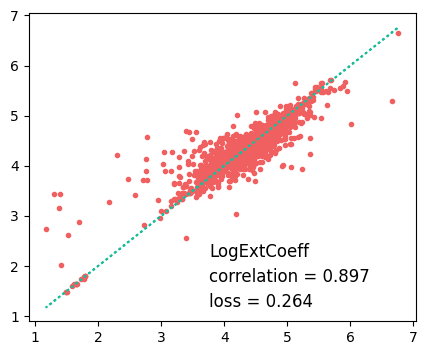

In [ ]:
plt.figure(figsize=(5, 4))
plt.plot(y_test, predicted, ".")
plt.plot(y_test, y_test, linestyle=":")
plt.text(
    max(y_test) - 3,
    min(y_test) + 1,
    f"LogExtCoeff",
    fontsize=12,
)
plt.text(
    max(y_test) - 3,
    min(y_test) + 0.5,
    f"correlation = {np.corrcoef(y_test, predicted)[0,1]:.3f}",
    fontsize=12,
)
plt.text(
    max(y_test) - 3,
    min(y_test) ,
    f"loss = {np.sqrt(np.mean((y_test - predicted)**2)):.3f}",
    fontsize=12,
)
plt.savefig("RF_all_mordred_optdata_LogExtCoeff_3_17_2023.png")

## Plot the results of the model (LambdaMaxAbs).

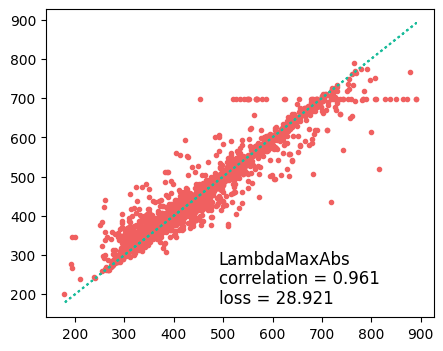

In [ ]:
plt.figure(figsize=(5, 4))
plt.plot(y_test_lma, predicted_lma, ".")
plt.plot(y_test_lma, y_test_lma, linestyle=":")
plt.text(
    max(y_test_lma) - 400,
    min(y_test_lma) + 100,
    f"LambdaMaxAbs",
    fontsize=12,
)
plt.text(
    max(y_test_lma) - 400,
    min(y_test_lma) + 50,
    f"correlation = {np.corrcoef(y_test_lma, predicted_lma)[0,1]:.3f}",
    fontsize=12,
)
plt.text(
    max(y_test_lma) - 400,
    min(y_test_lma)+ 0,
    f"loss = {np.sqrt(np.mean((y_test_lma - predicted_lma)**2)):.3f}",
    fontsize=12,
)
plt.savefig("RF_all_mordred_optdata_LambdaMaxAbs_4_24_2023.png")

(1, 789)
(1, 789)
(1, 789)


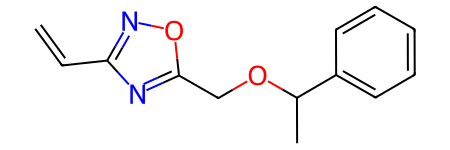

In [ ]:
aw_molecule_smi = "C=Cc1noc(COC(C)c2ccccc2)n1"
benzene_smi = "c1ccccc1"
oxadiazole_smi = "C=Cc1nocn1"
oxadiazole = rdkit.Chem.MolFromSmiles(oxadiazole_smi)
oxadiazole_features = calc.pandas([oxadiazole], nproc=8, quiet=True)

oxadiazole_features = oxadiazole_features.values.astype(float)
oxadiazole_features = oxadiazole_features[:, features_select_lma]
# oxadiazole_features = feature_convert_lma(oxadiazole_features)

print(oxadiazole_features.shape)

benzene = rdkit.Chem.MolFromSmiles(benzene_smi)
benzene_features = calc.pandas([benzene], nproc=8, quiet=True)

benzene_features = benzene_features.values.astype(float)
benzene_features = benzene_features[:, features_select_lma]
# benzene_features = feature_convert_lma(benzene_features)
print(benzene_features.shape)

aw_molecule = rdkit.Chem.MolFromSmiles(aw_molecule_smi)
aw_molecule_features = calc.pandas([aw_molecule], nproc=8, quiet=True)

aw_molecule_features = aw_molecule_features.values.astype(float)
aw_molecule_features = aw_molecule_features[:, features_select_lma]
# aw_molecule_features = feature_convert_lma(aw_molecule_features)
print(aw_molecule_features.shape)
aw_molecule
# benzene

In [ ]:
predicted_aw_molecule_lma = clf_lma.predict(aw_molecule_features)
print(predicted_aw_molecule_lma)
predicted_benzene_lma = clf_lma.predict(benzene_features)
print(predicted_benzene_lma)
predicted_oxadiazole_lma = clf_lma.predict(oxadiazole_features)
print(predicted_oxadiazole_lma)

[332.68315898]
[250.96268646]
[302.67294465]


Wavelength predictions when feature convert is done first:

[316.07348988]
[251.43628787]
[288.26199501]

Wavelength predictions when feature convert is done after feature_select:

[316.07348988]
[251.43628787]
[288.26199501]

Wavelength predictions without any normalization

[332.68315898]
[250.96268646]
[302.67294465]

## Explore molecules to be used as "base": First let's look at all the fluorene molecules...

In [ ]:
def substructure_preserver(mol, substructure):
    """
    Check for substructure violates
    Return True: contains a substructure violation
    Return False: No substructure violation
    """        
    
    if mol.HasSubstructMatch(rdkit.Chem.MolFromSmarts(substructure)) == True:
        return True # The has substructure! 
    else: 
        return False # Molecule does not have substructure!

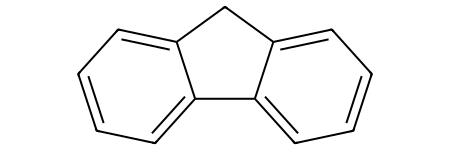

In [ ]:
fluorene = 'C1C2=CC=CC=C2C3=CC=CC=C31'
fluorene_mol = rdkit.Chem.MolFromSmiles(fluorene)
fluorene_mol

[#6]1-[#6]2:[#6]:[#6]:[#6]:[#6]:[#6]:2-[#6]2:[#6]:[#6]:[#6]:[#6]:[#6]:2-1


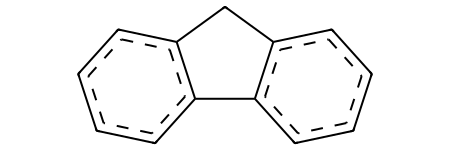

In [ ]:
# get smarts string from the mol of the substructure for fluorene
fluorene_smarts =  rdkit.Chem.MolToSmarts(fluorene_mol)
flmol_from_smarts = rdkit.Chem.MolFromSmarts(fluorene_smarts)
print (fluorene_smarts)
flmol_from_smarts

In [ ]:
smarts = fluorene_smarts

In [ ]:
def working_df(df, smarts):

    # return iloc from data for each entry that has mol.HasSubstructMatch(rdkit.Chem.MolFromSmarts(fluorene)) == True
    # first convert smiles to mol for each row, working with optdata_LogExtCoeff

    df['mol'] = df['Chromophore'].apply(lambda x: rdkit.Chem.MolFromSmiles(x))
    df['substructure_present'] = df['mol'].apply(lambda x: substructure_preserver(x, smarts))
    df['substructure_present'].value_counts()

    # Reset the index
    df.reset_index(drop=True, inplace=True)

    # Find the iloc values of the molecules that have the substructure
    substructure_present = df[df['substructure_present'] == True].index.tolist()
    substructure_df = df.iloc[substructure_present]
    return (substructure_df)



In [ ]:
fluorene_df = working_df(working_df_LogExtCoeff, smarts)
fluorene_df.head()

,Tag,Chromophore,Solvent,LambdaMaxAbs,LambdaMaxEm,Lifetime,QY,LogExtCoeff,AbsFWHMcm-1,EmFWHMcm-1,AbsFWHMnm,EmFWHMnm,MolarMass,reference,mol,substructure_present
11,3619,CCCC1(CCC)c2cc(-c3ccco3)ccc2-c2ccc(-c3ccco3)cc21,C1CCCCC1,364.0,377.0,NaN,0.860,4.698970,NaN,NaN,NaN,NaN,382.50144,10.1007/BF00723901,<rdkit.Chem.rdchem.Mol object at 0x2a034f190>,True
15,15636,CCCCC1(CCCC)c2cc(C#Cc3ccc4ccc5cccc6ccc3c4c56)c...,Cc1ccccc1,418.0,449.0,NaN,0.720,4.670246,NaN,NaN,NaN,NaN,669.90942,https://doi.org/10.1021/jo300285v,<rdkit.Chem.rdchem.Mol object at 0x2a034f350>,True
18,15641,CCCCC1(CCCC)c2cc(C#Cc3ccc4ccc5cccc6ccc3c4c56)c...,ClC(Cl)Cl,412.0,486.0,NaN,NaN,4.760422,NaN,NaN,NaN,NaN,669.90942,https://doi.org/10.1021/jo300285v,<rdkit.Chem.rdchem.Mol object at 0x2a034f4a0>,True
65,12167,Nc1cccc2c1C(=O)c1ccccc1-2,CCO,431.0,521.0,NaN,0.068,3.892095,NaN,NaN,NaN,NaN,195.22046,DOI: 10.1021/jp980158u,<rdkit.Chem.rdchem.Mol object at 0x2a03769e0>,True
68,3602,CCC(C)(C)c1ccc2c(c1)C(CC)(CC)c1cc(-c3ccc4c(c3)...,C1CCCCC1,331.0,371.0,NaN,0.850,4.792392,NaN,NaN,NaN,NaN,582.91276,10.1007/BF00723901,<rdkit.Chem.rdchem.Mol object at 0x2a0376b30>,True


In [ ]:
len (fluorene_df)

364

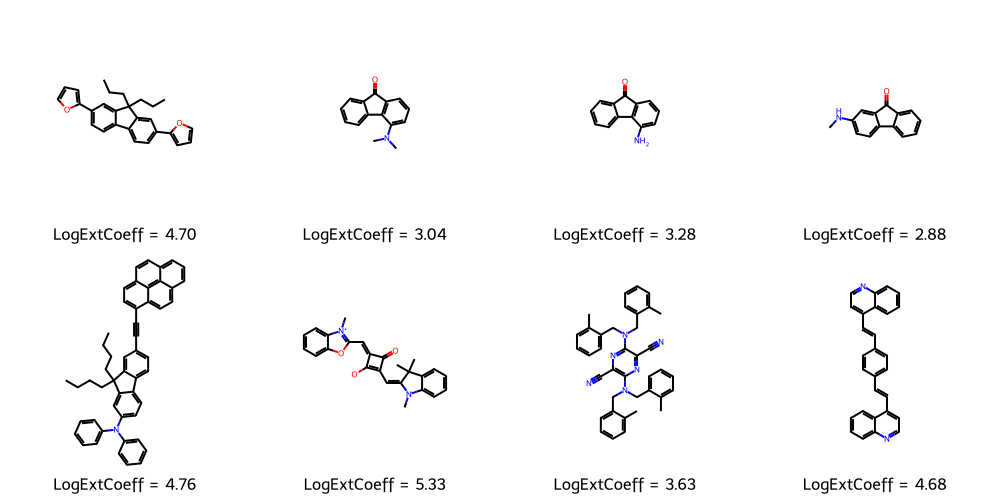

In [ ]:
molstoplot = [LogExtCoeff_23, LogExtCoeff_6652, LogExtCoeff_180, LogExtCoeff_10906, LogExtCoeff_39, LogExtCoeff_7004, LogExtCoeff_11234, LogExtCoeff_84]

# Define the IDs for your molecules, they should be in the same order as the mols list
molecule_ids = [23, 6652, 180, 10906, 39, 7004, 11234, 84]

# Create legends for each molecule
legends = [f"LogExtCoeff = {optdata_LogExtCoeff.LogExtCoeff[id]:.2f}" for id in molecule_ids]

image = rdkit.Chem.Draw.MolsToGridImage(molstoplot, molsPerRow=4, subImgSize=(250, 250), legends=legends, useSVG=False)

# Save the image to a file
# image.save("molecules.png")

# Display the image inline in the Jupyter notebook
image


In [ ]:
# draw all the molecules used in this study, 23, 6652, 180, 10906, 39, 7004, 11234, 84
rdkit.Chem.Draw.MolsToGridImage(LogExtCoeff_23, LogExtCoeff_6652, LogExtCoeff_180, LogExtCoeff_10906,
                                LogExtCoeff_39, LogExtCoeff_7004, LogExtCoeff_11234, LogExtCoeff_84 molsPerRow=5, subImgSize=(200, 200), legends=fluorene_df['Chromophore'])

SyntaxError: invalid syntax (685731769.py, line 3)

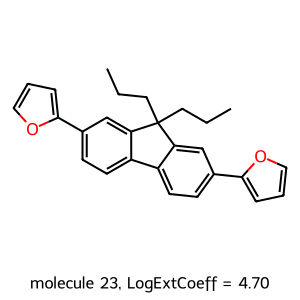

In [ ]:
# obtain the base molecules as mol files, for drawing later
LogExtCoeff_23 = rdkit.Chem.MolFromSmiles(optdata_LogExtCoeff.Chromophore[23])
# add H's
# LogExtCoeff_23 = rdkit.Chem.AddHs(LogExtCoeff_23)
#draw the molecule
rdkit.Chem.Draw.MolToImage(LogExtCoeff_23, size=(300, 300), legend=f"molecule 23, LogExtCoeff = {optdata_LogExtCoeff.LogExtCoeff[23]:.2f}")


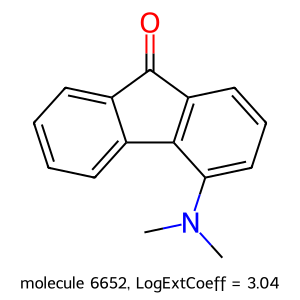

In [ ]:
# obtain the base molecules as mol files, for drawing later
LogExtCoeff_6652 = rdkit.Chem.MolFromSmiles(optdata_LogExtCoeff.Chromophore[6652])
# add H's
# LogExtCoeff_84 = rdkit.Chem.AddHs(LogExtCoeff_84)
#draw the molecule
rdkit.Chem.Draw.MolToImage(LogExtCoeff_6652, size=(300, 300), legend=f"molecule 6652, LogExtCoeff = {optdata_LogExtCoeff.LogExtCoeff[6652]:.2f}")


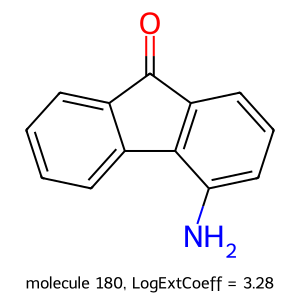

In [ ]:
# obtain the base molecules as mol files, for drawing later
LogExtCoeff_180 = rdkit.Chem.MolFromSmiles(optdata_LogExtCoeff.Chromophore[180])
# add H's
# LogExtCoeff_84 = rdkit.Chem.AddHs(LogExtCoeff_84)
#draw the molecule
rdkit.Chem.Draw.MolToImage(LogExtCoeff_180, size=(300, 300), legend=f"molecule 180, LogExtCoeff = {optdata_LogExtCoeff.LogExtCoeff[180]:.2f}")


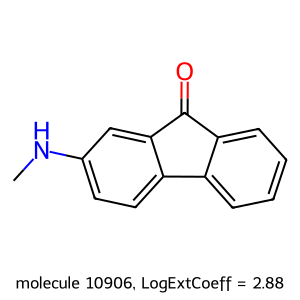

In [ ]:
# obtain the base molecules as mol files, for drawing later
LogExtCoeff_10906 = rdkit.Chem.MolFromSmiles(optdata_LogExtCoeff.Chromophore[10906])
# add H's
# LogExtCoeff_84 = rdkit.Chem.AddHs(LogExtCoeff_84)
#draw the molecule
rdkit.Chem.Draw.MolToImage(LogExtCoeff_10906, size=(300, 300), legend=f"molecule 10906, LogExtCoeff = {optdata_LogExtCoeff.LogExtCoeff[10906]:.2f}")


## Now the squaraines

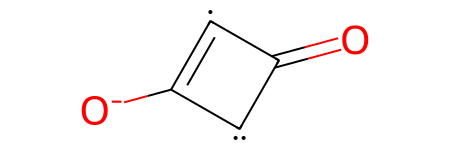

In [ ]:
squaraine = '[C]1=C([O-])[C]([C]1=O)'
squaraine_mol = rdkit.Chem.MolFromSmiles(squaraine)
squaraine_mol

[#6]1=[#6](-[#8-])-[#6]-[#6]-1=[#8]


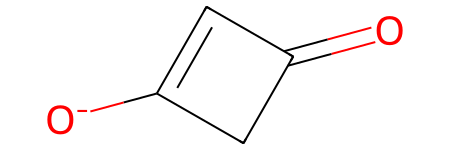

In [ ]:
# get smarts string from the mol of the substructure for fluorene
squaraine_smarts =  rdkit.Chem.MolToSmarts(squaraine_mol)
sqmol_from_smarts = rdkit.Chem.MolFromSmarts(squaraine_smarts)
print (squaraine_smarts)
sqmol_from_smarts

In [ ]:
sq_smarts = squaraine_smarts

In [ ]:
squaraine_df = working_df(working_df_LogExtCoeff, sq_smarts)
squaraine_df.head(21)


,Tag,Chromophore,Solvent,LambdaMaxAbs,LambdaMaxEm,Lifetime,QY,LogExtCoeff,AbsFWHMcm-1,EmFWHMcm-1,AbsFWHMnm,EmFWHMnm,MolarMass,reference,mol,substructure_present
70,9081,Cc1ccc2ccc3c(c2n1)N/C(=C\C1=C([O-])/C(=C/C2=[N...,C1CCCCC1,692.0,713.0,NaN,0.31,5.270000,NaN,NaN,36.1,33.7,526.63820,https://doi.org/10.1016/j.saa.2018.11.061,<rdkit.Chem.rdchem.Mol object at 0x308d3c120>,True
1270,9088,Cc1ccc2ccc3c(c2n1)N/C(=C\C1=C([O-])/C(=C/C2=[N...,CC#N,681.0,705.0,NaN,0.38,5.210000,NaN,NaN,41.3,36.2,526.63820,https://doi.org/10.1016/j.saa.2018.11.061,<rdkit.Chem.rdchem.Mol object at 0x2d125b4a0>,True
1448,9096,CCN1/C(=C\C2=C([O-])/C(=C/C3=[N+](CC)c4c(ccc5c...,CS(C)=O,685.0,707.0,NaN,0.37,5.260000,NaN,NaN,40.6,38.9,582.74572,https://doi.org/10.1016/j.saa.2018.11.061,<rdkit.Chem.rdchem.Mol object at 0x2d12683c0>,True
2117,9091,CCN1/C(=C\C2=C([O-])/C(=C/C3=[N+](CC)c4c(ccc5c...,Cc1ccccc1,686.0,706.0,NaN,0.31,5.210000,NaN,NaN,36.8,37.7,582.74572,https://doi.org/10.1016/j.saa.2018.11.061,<rdkit.Chem.rdchem.Mol object at 0x2d1259cf0>,True
2158,9092,CCN1/C(=C\C2=C([O-])/C(=C/C3=[N+](CC)c4c(ccc5c...,ClC(Cl)Cl,678.0,702.0,NaN,0.60,5.190000,NaN,NaN,48.0,40.3,582.74572,https://doi.org/10.1016/j.saa.2018.11.061,<rdkit.Chem.rdchem.Mol object at 0x2d125cf20>,True
2233,9087,Cc1ccc2ccc3c(c2n1)N/C(=C\C1=C([O-])/C(=C/C2=[N...,CS(C)=O,692.0,717.0,NaN,0.43,5.220000,NaN,NaN,42.7,36.5,526.63820,https://doi.org/10.1016/j.saa.2018.11.061,<rdkit.Chem.rdchem.Mol object at 0x2d126f0b0>,True
2275,9094,CCN1/C(=C\C2=C([O-])/C(=C/C3=[N+](CC)c4c(ccc5c...,C1COCCO1,680.0,698.0,NaN,0.14,5.220000,NaN,NaN,38.6,38.2,582.74572,https://doi.org/10.1016/j.saa.2018.11.061,<rdkit.Chem.rdchem.Mol object at 0x2d1273350>,True
2794,15359,CN1C(=CC2=C([O-])C(=Cc3oc4ccccc4[n+]3C)C2=O)C(...,ClC(Cl)Cl,608.0,619.0,NaN,NaN,5.330414,NaN,NaN,NaN,NaN,398.46068,https://doi.org/10.1016/j.dyepig.2004.05.003,<rdkit.Chem.rdchem.Mol object at 0x2d11d79e0>,True
3239,9082,Cc1ccc2ccc3c(c2n1)N/C(=C\C1=C([O-])/C(=C/C2=[N...,Cc1ccccc1,694.0,718.0,NaN,0.34,5.290000,NaN,NaN,37.6,33.9,526.63820,https://doi.org/10.1016/j.saa.2018.11.061,<rdkit.Chem.rdchem.Mol object at 0x2d11ddf90>,True
3826,9093,CCN1/C(=C\C2=C([O-])/C(=C/C3=[N+](CC)c4c(ccc5c...,C1CCOC1,681.0,699.0,NaN,0.32,5.230000,NaN,NaN,37.8,39.6,582.74572,https://doi.org/10.1016/j.saa.2018.11.061,<rdkit.Chem.rdchem.Mol object at 0x2d12074a0>,True


In [ ]:
len (squaraine_df)

21

In [ ]:
def draw_from_tag(tag: int):
    chromophore_value = optdata_LogExtCoeff.loc[optdata_LogExtCoeff['Tag'] == tag, 'Chromophore'].values[0]
    mol_location = optdata_LogExtCoeff[optdata_LogExtCoeff['Tag'] == tag].index[0]

    # Now, you can use this value in rdkit.Chem.MolFromSmiles()
    molecule_of_interest = rdkit.Chem.MolFromSmiles(chromophore_value)

    # Get the LogExtCoeff value for the molecule with Tag 9081
    log_ext_coeff_value = optdata_LogExtCoeff.loc[optdata_LogExtCoeff['Tag'] == tag, 'LogExtCoeff'].values[0]

    # Draw the molecule
    rdkit.Chem.Draw.MolToImage(molecule_of_interest, size=(300, 300), legend=f"Tag# {tag}, LogExtCoeff = {log_ext_coeff_value:.2f}")
    # print(molecule_of_interest, log_ext_coeff_value)

    return molecule_of_interest, log_ext_coeff_value, mol_location

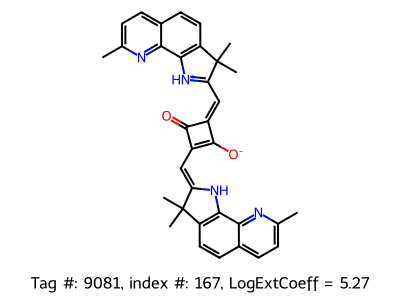

In [ ]:
tag = 9081
to_draw, log_ext_coeff_value, optdata_LogExtCoeff_index = draw_from_tag(tag)
rdkit.Chem.Draw.MolToImage(to_draw, size=(400, 300), legend=f"Tag #: {tag}, index #: {optdata_LogExtCoeff_index}, LogExtCoeff = {log_ext_coeff_value:.2f}")

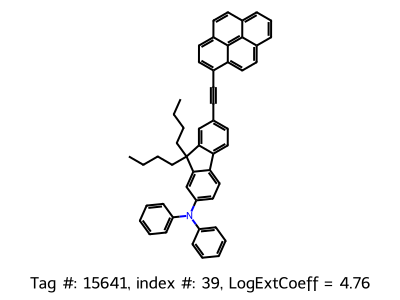

In [ ]:
tag = 15641
to_draw, log_ext_coeff_value, optdata_LogExtCoeff_index = draw_from_tag(tag)
rdkit.Chem.Draw.MolToImage(to_draw, size=(400, 300), legend=f"Tag #: {tag}, index #: {optdata_LogExtCoeff_index}, LogExtCoeff = {log_ext_coeff_value:.2f}")


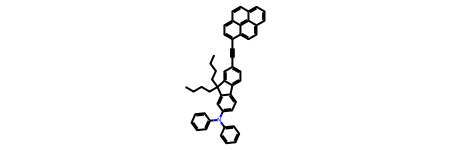

In [ ]:
LogExtCoeff_39 = rdkit.Chem.MolFromSmiles(optdata_LogExtCoeff.Chromophore[39])
LogExtCoeff_39

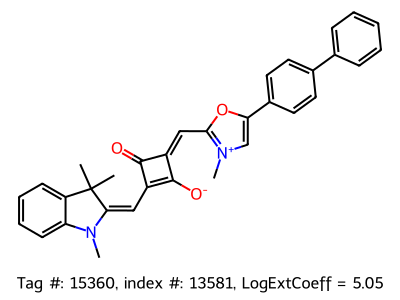

In [ ]:
tag = 15360
to_draw, log_ext_coeff_value, optdata_LogExtCoeff_index = draw_from_tag(tag)
rdkit.Chem.Draw.MolToImage(to_draw, size=(400, 300), legend=f"Tag #: {tag}, index #: {optdata_LogExtCoeff_index}, LogExtCoeff = {log_ext_coeff_value:.2f}")

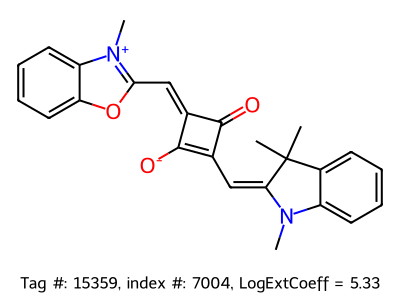

In [ ]:
tag = 15359
to_draw, log_ext_coeff_value, optdata_LogExtCoeff_index = draw_from_tag(tag)
rdkit.Chem.Draw.MolToImage(to_draw, size=(400, 300), legend=f"Tag #: {tag}, index #: {optdata_LogExtCoeff_index}, LogExtCoeff = {log_ext_coeff_value:.2f}")

## Now other molecules

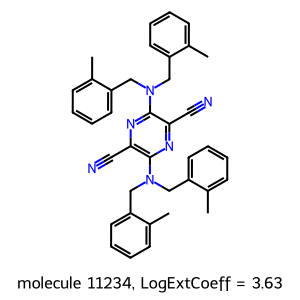

In [ ]:
# obtain the base molecules as mol files, for drawing later
LogExtCoeff_11234 = rdkit.Chem.MolFromSmiles(optdata_LogExtCoeff.Chromophore[11234])
# add H's
# LogExtCoeff_11234 = rdkit.Chem.AddHs(LogExtCoeff_11234)
#draw the molecule with the actual LogExtCoeff. Annotate with the entry number "11234"
rdkit.Chem.Draw.MolToImage(LogExtCoeff_11234, size=(300, 300), legend=f"molecule 11234, LogExtCoeff = {optdata_LogExtCoeff.LogExtCoeff[11234]:.2f}")


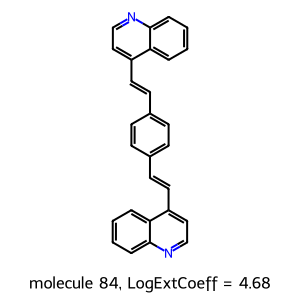

In [ ]:
# obtain the base molecules as mol files, for drawing later
LogExtCoeff_84 = rdkit.Chem.MolFromSmiles(optdata_LogExtCoeff.Chromophore[84])
# add H's
# LogExtCoeff_84 = rdkit.Chem.AddHs(LogExtCoeff_84)
#draw the molecule
rdkit.Chem.Draw.MolToImage(LogExtCoeff_84, size=(300, 300), legend=f"molecule 84, LogExtCoeff = {optdata_LogExtCoeff.LogExtCoeff[84]:.2f}")


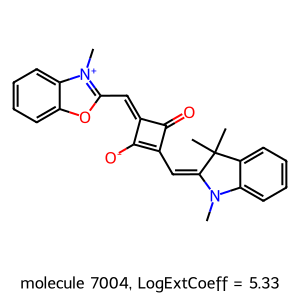

In [ ]:
# obtain the base molecules as mol files, for drawing later
LogExtCoeff_7004 = rdkit.Chem.MolFromSmiles(optdata_LogExtCoeff.Chromophore[7004])
# add H's
# LogExtCoeff_84 = rdkit.Chem.AddHs(LogExtCoeff_84)
#draw the molecule
rdkit.Chem.Draw.MolToImage(LogExtCoeff_7004, size=(300, 300), legend=f"molecule 7004, LogExtCoeff = {optdata_LogExtCoeff.LogExtCoeff[7004]:.2f}")


### Comment out the following two cells since this is already generated and saved

## Note that we may want to add something as an input to exmol so that we can run the substructure preserver algorithm to develop say squaraine molecules

## Use exmol to generate the "space", and features for both models, or load from file

In [ ]:
# Note that we are currently using a substructure preserver, as a default setting in exmol?

stoned_kwargs_5_5000 = {
    "num_samples": 5000,
    "alphabet": exmol.get_basic_alphabet(),
    "max_mutations": 5,
    # "preset": "synspace",
}

from Collison's local computer


In [ ]:
# Note that we are currently using a substructure preserver, as a default setting in exmol?

stoned_kwargs_2_2000 = {
    "num_samples": 2000,
    "alphabet": exmol.get_basic_alphabet(),
    "max_mutations": 2,
    # "preset": "synspace",
}

from Collison's local computer


## Experimental model_eval approaches

In [ ]:
space_features_global_LogExtCoeff = None
space_features_global_lma = None
features_select = features_select
features_select_lma = features_select_lma

def model_eval_broken(smiles):
    global space_features_global_LogExtCoeff
    global space_features_global_lma
    global features_select
    global features_select_lma
    space_features_global_LogExtCoeff = None
    space_features_global_lma = None

    mols = [rdkit.Chem.MolFromSmiles(smi) for smi in smiles]
    
    raw_space_features = calc.pandas(mols, nproc=8, quiet=True)    
    # space_features = feature_convert(raw_space_features)
    # space_features_lma = feature_convert_lma(raw_space_features)

    # The concern here is that we must use the same global list of features_select for each model 
    # The following code is commented out, because I think we just have to make sure that features_select and features_select_lma
    # are made available globally  
    # space_features_select_LogExtCoeff = np.all(np.isfinite(space_features), axis=0)
    # space_features_select_lma = np.all(np.isfinite(space_features_lma), axis=0)

    space_features = raw_space_features.values.astype(float)
    # space_features_lma = space_features_lma.values.astype(float)

    space_features = space_features[:, features_select]
    space_features_lma = space_features[:, features_select_lma]
    
    labels = clf.predict(np.nan_to_num(space_features))
    
    # Store space_features in the global variable
    space_features_global_LogExtCoeff = space_features
    space_features_global_lma = space_features_lma

    return labels

## Functions for generating features for examples space or load existing space

In [ ]:
def load_existing_space(space_filename: str, base_number: int, substructure_smarts: str = None, stoned_kwargs: dict = stoned_kwargs_2_2000):
    space_features_filename = space_filename + "_features"
    """Load an existing space from a pickle file, or create a new one if the file does not exist."""
 
    try:
        loaded_space = space_pickle_load(space_filename)
    except FileNotFoundError as e:
        smi = optdata_LogExtCoeff.Chromophore[base_number]
        loaded_space = exmol.sample_space(smi, model_eval, stoned_kwargs=stoned_kwargs,quiet=False, substructure_smarts = substructure_smarts)
        # loaded_space = exmol.sample_space(smi, model_eval, stoned_kwargs=stoned_kwargs,quiet=False, substructure_smarts = substructure_smarts)
        with open(space_filename, "wb") as fp:   #Pickling
            pickle.dump(loaded_space, fp)
        # loaded_space_features = space_features_global
        # with open(space_features_filename, "wb") as fp:   #Pickling
            # pickle.dump(loaded_space_features, fp)

    # return loaded_space

    # # Extract the features from the global dictionary and build a dataframe
    # smiles_list = [example.smiles for example in loaded_space]
    # features_data = [features_dict[smi] for smi in smiles_list]
    # features_df = pd.DataFrame(features_data)

    return loaded_space  #, features_df

In [ ]:
# This does not work: do not use
# we can try again later... THis was designed to have exmol return the features once generated.

def load_existing_space_and_features(space_filename: str, base_number: int, substructure_smarts: str = None, stoned_kwargs: dict = stoned_kwargs_2_2000):
    space_features_filename_LogExtCoeff = space_filename + "_features_LogExtCoeff"
    space_features_filename_lma = space_filename + "_features_lma"

    """Load an existing space from a pickle file, or create a new one if the file does not exist."""
 
    try:
        loaded_space = space_pickle_load(space_filename)
        loaded_space_features_LogExtCoeff = space_pickle_load(space_features_filename_LogExtCoeff)
        loaded_space_features_lma = space_pickle_load(space_features_filename_lma)
    except FileNotFoundError as e:
        smi = optdata_LogExtCoeff.Chromophore[base_number]
        loaded_space = exmol.sample_space(smi, model_eval_broken, stoned_kwargs=stoned_kwargs,quiet=False, substructure_smarts = substructure_smarts)
        with open(space_filename, "wb") as fp:   #Pickling
            pickle.dump(loaded_space, fp)
        loaded_space_features_LogExtCoeff = space_features_global_LogExtCoeff
        with open(space_features_filename_LogExtCoeff, "wb") as fp:   #Pickling
            pickle.dump(loaded_space_features_LogExtCoeff, fp)
        loaded_space_features_lma = space_features_global_lma
        with open(space_features_filename_lma, "wb") as fp:   #Pickling
            pickle.dump(loaded_space_features_lma, fp)

    loaded_space_values_LogExtCoeff = clf.predict(np.nan_to_num(loaded_space_features_LogExtCoeff))
    loaded_space_values_lma = clf_lma.predict(np.nan_to_num(loaded_space_features_lma))

    # return loaded_space

    # # Extract the features from the global dictionary and build a dataframe
    # smiles_list = [example.smiles for example in loaded_space]
    # features_data = [features_dict[smi] for smi in smiles_list]
    # features_df = pd.DataFrame(features_data)

    return loaded_space, loaded_space_features_LogExtCoeff, loaded_space_features_lma, loaded_space_values_LogExtCoeff, loaded_space_values_lma

In [ ]:
# convert the space dictionary to a dataframe
def space_features_for_mordred_calc(space_features):
    df = pd.DataFrame(space_features)
    return df

def space_features_to_df_full_conversion_with_mols(space_features):
    space_features_df = pd.DataFrame(columns = ['smiles', 'selfies', 'similarity', 'yhat', 'index', 'position', 'is_origin', 'cluster', 'label', 'descriptors'])
    for i in range(len(space_features)):
        space_features_df.loc[i] = [space_features[i].smiles, space_features[i].selfies, space_features[i].similarity,
                                space_features[i].yhat, space_features[i].index, space_features[i].position,
                                space_features[i].is_origin, space_features[i].cluster, space_features[i].label,
                                space_features[i].descriptors]
     
    # append a column with rdKit mol objects
    space_features_df['mol'] = space_features_df.smiles.apply(rdkit.Chem.MolFromSmiles)
    return space_features_df


def get_space_features(space_filename, space_filename_str: str, mordred_calc, features_select_first, features_select_second, clf_first, clf_second):
    # # convert the space dictionary to a dataframe
    # I don't think this is actually necessary
    # def space_features_to_df(space_features):
    #     df = pd.DataFrame(space_features)
    #     return df

    space_features_filename_pb = space_filename_str + "_features.pb"
    # Note that we don't need to do more than unpack the list to get one item of "smiles" in order to run the mordred calculator
    space_filename_df = space_features_for_mordred_calc(space_filename)
    print (f"the type of the space_filename_df is: {type(space_filename_df)}")
    print (f"the shape of space_filename_df is: {space_filename_df.shape}")

    molecules = []
    for smi in space_filename_df.smiles:
        mol = rdkit.Chem.MolFromSmiles(smi)
        molecules.append(mol)

    # This weeds out molecules that can't be parsed by RDKit. There are none in opvdata
    valid_mol_idx = [bool(m) for m in molecules]
    valid_mols = [m for m in molecules if m]

    # calculating mordred features is time consuming so we work with precalculated features
    try:
        raw_space_features = pd.read_pickle(space_features_filename_pb)
    except FileNotFoundError as e:
        raw_space_features = mordred_calc.pandas(valid_mols, nproc=8, quiet=False)
        raw_space_features.to_pickle(space_features_filename_pb)

    print (type(raw_space_features))
    
    raw_space_features = raw_space_features.values.astype(float)

    space_features = raw_space_features[:, features_select_first]
    space_features_lma = raw_space_features[:, features_select_second]

    
    # Don't need this any more
    # space_features = feature_convert_local(raw_space_features, fm_first, fs_first)
    # space_features_lma = feature_convert_local(raw_space_features, fm_second, fs_second)

    # One concern here is that we must use the same global list of features_select for each model 
    # The following code is commented out, because I think we just have to make sure that features_select and features_select_lma
    # are made available globally  
    # space_features_select_LogExtCoeff = np.all(np.isfinite(space_features), axis=0)
    # space_features_select_lma = np.all(np.isfinite(space_features_lma), axis=0)

    
    
    space_labels_LogExtCoeff = clf_first.predict(np.nan_to_num(space_features))
    space_labels_lma = clf_second.predict(np.nan_to_num(space_features_lma))
    print (f"the type of the space_features is: {type(space_features)}")
    print (f"the shape of space_features is: {space_features.shape}")
  
    return space_features, space_features_lma, space_labels_LogExtCoeff, space_labels_lma, raw_space_features
    
   

## Experiment with one base molecule and space before generating spaces for other systems
<br>
Remember that we have to regenerate all space stuff since we no longer use the feature_convert approach

In [ ]:
space_LogExtCoeff_6652_2_2000_5_04_2023 = load_existing_space("space_LogExtCoeff_6652_2_2000_5_04_2023", 6652, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000)

In [ ]:
print (space_LogExtCoeff_6652_2_2000_5_04_2023[0])

{'smiles': 'CN(C)C1=CC=CC2=C1C1=CC=CC=C1C2=O', 'selfies': '[C][N][Branch1][C][C][C][=C][C][=C][C][=C][Ring1][=Branch1][C][=C][C][=C][C][=C][Ring1][=Branch1][C][Ring1][=Branch2][=O]', 'similarity': 1.0, 'yhat': 3.0481627301312026, 'index': 0, 'position': array([-5.44596031, -0.01247711]), 'is_origin': True, 'cluster': -1, 'label': None, 'descriptors': None}


In [ ]:
# the moment of truth:
space_LogExtCoeff_6652_2_2000_5_04_2023_features, space_LogExtCoeff_6652_2_2000_5_04_2023_features_lma, space_LogExtCoeff_6652_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma, raw_space_features = get_space_features(space_LogExtCoeff_6652_2_2000_5_04_2023, "space_LogExtCoeff_6652_2_2000_5_04_2023", calc, features_select, features_select_lma, clf, clf_lma)

the type of the space_filename_df is: <class 'pandas.core.frame.DataFrame'>
the shape of space_filename_df is: (1683, 10)
<class 'mordred._base.pandas_module.MordredDataFrame'>
the type of the space_features is: <class 'numpy.ndarray'>
the shape of space_features is: (1683, 789)


The second moment of truth to see if we can successfully do it all once in exmol

In [ ]:
# the 2nd moment of truth:
# space_LogExtCoeff_6652_2_2000_5_04_2023_ex, space_LogExtCoeff_6652_2_2000_5_04_2023_features_ex, space_LogExtCoeff_6652_2_2000_5_04_2023_features_lma_ex, space_LogExtCoeff_6652_2_2000_5_04_2023_labels_LogExtCoeff_ex, space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma_ex, raw_space_features = load_existing_space_and_features("space_LogExtCoeff_6652_2_2000_5_04_2023_ex", 6652, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000)


In [ ]:
print (f"the type of the features is: {type(space_LogExtCoeff_6652_2_2000_5_04_2023_features)}")
print (f"the shape of features is: {space_LogExtCoeff_6652_2_2000_5_04_2023_features.shape}")
print (f"the type of the labels is: {type(space_LogExtCoeff_6652_2_2000_5_04_2023_labels_LogExtCoeff)}")
print (f"the shape of labels is: {space_LogExtCoeff_6652_2_2000_5_04_2023_labels_LogExtCoeff.shape}")
print (f"the type of the features_lma is: {type(space_LogExtCoeff_6652_2_2000_5_04_2023_features_lma)}")
print (f"the shape of features_lma is: {space_LogExtCoeff_6652_2_2000_5_04_2023_features_lma.shape}")
print (f"the type of the labels_lma is: {type(space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma)}")
print (f"the shape of labels_lma is: {space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma.shape}")
print (f"the type of the raw_space_features is: {type(space_LogExtCoeff_6652_2_2000_5_04_2023)}")




the type of the features is: <class 'numpy.ndarray'>
the shape of features is: (1683, 789)
the type of the labels is: <class 'numpy.ndarray'>
the shape of labels is: (1683,)
the type of the features_lma is: <class 'numpy.ndarray'>
the shape of features_lma is: (1683, 789)
the type of the labels_lma is: <class 'numpy.ndarray'>
the shape of labels_lma is: (1683,)
the type of the raw_space_features is: <class 'list'>


In [ ]:
# space_LogExtCoeff_6652_2_2000_5_04_2023_df.head()

## Set it and forget it: generate exmol/stoned space and associated features

Fluorenes:<br>
6652: 2_2000, 5_5000, 5_5000_subs<br>
23:2_2000, 5_5000, x_x000_subs<br>
180: 2_2000, 5_5000, 5_5000_subs<br>
10906<br>
39<br>
Squaraines: 7004<br>
other<br>
84, 11234


In [ ]:
def set_and_forget_space_features_generator(space_filename_str: str, base_number: int, substructure_smarts: str = None, stoned_kwargs: dict = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma):
    loaded_space = load_existing_space(space_filename_str, base_number, substructure_smarts, stoned_kwargs)
    space_features, space_features_lma, space_labels_LogExtCoeff, space_labels_lma, raw_space_features = get_space_features(loaded_space, space_filename_str, mordred_calc, features_select_first, features_select_second, clf_first, clf_second)
    loaded_space_df = space_features_to_df_full_conversion_with_mols(loaded_space)
    return loaded_space, space_features, space_features_lma, space_labels_LogExtCoeff, space_labels_lma, raw_space_features, loaded_space_df
    

In [ ]:
space_LogExtCoeff_6652_2_2000_5_04_2023, space_LogExtCoeff_6652_2_2000_5_04_2023_features, space_LogExtCoeff_6652_2_2000_5_04_2023_features_lma, space_LogExtCoeff_6652_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_6652_2_2000_5_04_2023, space_LogExtCoeff_6652_2_2000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_6652_2_2000_5_04_2023", 6652, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_6652_5_5000_5_04_2023, space_LogExtCoeff_6652_5_5000_5_04_2023_features, space_LogExtCoeff_6652_5_5000_5_04_2023_features_lma, space_LogExtCoeff_6652_5_5000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_6652_5_5000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_6652_5_5000_5_04_2023, space_LogExtCoeff_6652_5_5000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_6652_5_5000_5_04_2023", 6652, substructure_smarts = None, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_6652_5_5000_5_04_2023_subs, space_LogExtCoeff_6652_5_5000_5_04_2023_features_subs, space_LogExtCoeff_6652_5_5000_5_04_2023_features_lma_subs, space_LogExtCoeff_6652_5_5000_5_04_2023_labels_LogExtCoeff_subs, space_LogExtCoeff_6652_5_5000_5_04_2023_labels_lma_subs, raw_space_features_LogExtCoeff_6652_5_5000_5_04_2023_subs, space_LogExtCoeff_6652_5_5000_5_04_2023_df_subs = set_and_forget_space_features_generator("space_LogExtCoeff_6652_5_5000_5_04_2023_subs", 6652, substructure_smarts = fluorene_smarts, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_23_2_2000_5_04_2023, space_LogExtCoeff_23_2_2000_5_04_2023_features, space_LogExtCoeff_23_2_2000_5_04_2023_features_lma, space_LogExtCoeff_23_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_23_2_2000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_23_2_2000_5_04_2023, space_LogExtCoeff_23_2_2000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_23_2_2000_5_04_2023", 23, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_23_5_5000_5_04_2023, space_LogExtCoeff_23_5_5000_5_04_2023_features, space_LogExtCoeff_23_5_5000_5_04_2023_features_lma, space_LogExtCoeff_23_5_5000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_23_5_5000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_23_5_5000_5_04_2023, space_LogExtCoeff_23_5_5000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_23_5_5000_5_04_2023", 23, substructure_smarts = None, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_23_2_2000_5_04_2023_subs, space_LogExtCoeff_23_2_2000_5_04_2023_features_subs, space_LogExtCoeff_23_2_2000_5_04_2023_features_lma_subs, space_LogExtCoeff_23_2_2000_5_04_2023_labels_LogExtCoeff_subs, space_LogExtCoeff_23_2_2000_5_04_2023_labels_lma_subs, raw_space_features_LogExtCoeff_23_2_2000_5_04_2023_subs, space_LogExtCoeff_23_2_2000_5_04_2023_df_subs = set_and_forget_space_features_generator("space_LogExtCoeff_23_2_2000_5_04_2023_subs", 23, substructure_smarts = fluorene_smarts, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_180_2_2000_5_04_2023, space_LogExtCoeff_180_2_2000_5_04_2023_features, space_LogExtCoeff_180_2_2000_5_04_2023_features_lma, space_LogExtCoeff_180_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_180_2_2000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_180_2_2000_5_04_2023, space_LogExtCoeff_180_2_2000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_180_2_2000_5_04_2023", 180, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_180_5_5000_5_04_2023, space_LogExtCoeff_180_5_5000_5_04_2023_features, space_LogExtCoeff_180_5_5000_5_04_2023_features_lma, space_LogExtCoeff_180_5_5000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_180_5_5000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_180_5_5000_5_04_2023, space_LogExtCoeff_180_5_5000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_180_5_5000_5_04_2023", 180, substructure_smarts = None, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_180_5_5000_5_04_2023_subs, space_LogExtCoeff_180_5_5000_5_04_2023_features_subs, space_LogExtCoeff_180_5_5000_5_04_2023_features_lma_subs, space_LogExtCoeff_180_5_5000_5_04_2023_labels_LogExtCoeff_subs, space_LogExtCoeff_180_5_5000_5_04_2023_labels_lma_subs, raw_space_features_LogExtCoeff_180_5_5000_5_04_2023_subs, space_LogExtCoeff_180_5_5000_5_04_2023_df_subs = set_and_forget_space_features_generator("space_LogExtCoeff_180_5_5000_5_04_2023_subs", 180, substructure_smarts = fluorene_smarts, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_10906_2_2000_5_04_2023, space_LogExtCoeff_10906_2_2000_5_04_2023_features, space_LogExtCoeff_10906_2_2000_5_04_2023_features_lma, space_LogExtCoeff_10906_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_10906_2_2000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_10906_2_2000_5_04_2023, space_LogExtCoeff_10906_2_2000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_10906_2_2000_5_04_2023", 10906, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_10906_5_5000_5_04_2023, space_LogExtCoeff_10906_5_5000_5_04_2023_features, space_LogExtCoeff_10906_5_5000_5_04_2023_features_lma, space_LogExtCoeff_10906_5_5000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_10906_5_5000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_10906_5_5000_5_04_2023, space_LogExtCoeff_10906_5_5000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_10906_5_5000_5_04_2023", 10906, substructure_smarts = None, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_10906_5_5000_5_04_2023_subs, space_LogExtCoeff_10906_5_5000_5_04_2023_features_subs, space_LogExtCoeff_10906_5_5000_5_04_2023_features_lma_subs, space_LogExtCoeff_10906_5_5000_5_04_2023_labels_LogExtCoeff_subs, space_LogExtCoeff_10906_5_5000_5_04_2023_labels_lma_subs, raw_space_features_LogExtCoeff_10906_5_5000_5_04_2023_subs, space_LogExtCoeff_10906_5_5000_5_04_2023_df_subs = set_and_forget_space_features_generator("space_LogExtCoeff_10906_5_5000_5_04_2023_subs", 10906, substructure_smarts = fluorene_smarts, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_39_2_2000_5_04_2023, space_LogExtCoeff_39_2_2000_5_04_2023_features, space_LogExtCoeff_39_2_2000_5_04_2023_features_lma, space_LogExtCoeff_39_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_39_2_2000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_39_2_2000_5_04_2023, space_LogExtCoeff_39_2_2000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_39_2_2000_5_04_2023", 39, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_39_5_5000_5_04_2023, space_LogExtCoeff_39_5_5000_5_04_2023_features, space_LogExtCoeff_39_5_5000_5_04_2023_features_lma, space_LogExtCoeff_39_5_5000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_39_5_5000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_39_5_5000_5_04_2023, space_LogExtCoeff_39_5_5000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_39_5_5000_5_04_2023", 39, substructure_smarts = None, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_39_5_5000_5_04_2023_subs, space_LogExtCoeff_39_5_5000_5_04_2023_features_subs, space_LogExtCoeff_39_5_5000_5_04_2023_features_lma_subs, space_LogExtCoeff_39_5_5000_5_04_2023_labels_LogExtCoeff_subs, space_LogExtCoeff_39_5_5000_5_04_2023_labels_lma_subs, raw_space_features_LogExtCoeff_39_5_5000_5_04_2023_subs, space_LogExtCoeff_39_5_5000_5_04_2023_df_subs = set_and_forget_space_features_generator("space_LogExtCoeff_39_5_5000_5_04_2023_subs", 39, substructure_smarts = fluorene_smarts, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_7004_2_2000_5_04_2023, space_LogExtCoeff_7004_2_2000_5_04_2023_features, space_LogExtCoeff_7004_2_2000_5_04_2023_features_lma, space_LogExtCoeff_7004_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_7004_2_2000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_7004_2_2000_5_04_2023, space_LogExtCoeff_7004_2_2000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_7004_2_2000_5_04_2023", 7004, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_7004_5_5000_5_04_2023, space_LogExtCoeff_7004_5_5000_5_04_2023_features, space_LogExtCoeff_7004_5_5000_5_04_2023_features_lma, space_LogExtCoeff_7004_5_5000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_7004_5_5000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_7004_5_5000_5_04_2023, space_LogExtCoeff_7004_5_5000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_7004_5_5000_5_04_2023", 7004, substructure_smarts = None, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_7004_5_5000_5_04_2023_subs, space_LogExtCoeff_7004_5_5000_5_04_2023_features_subs, space_LogExtCoeff_7004_5_5000_5_04_2023_features_lma_subs, space_LogExtCoeff_7004_5_5000_5_04_2023_labels_LogExtCoeff_subs, space_LogExtCoeff_7004_5_5000_5_04_2023_labels_lma_subs, raw_space_features_LogExtCoeff_7004_5_5000_5_04_2023_subs, space_LogExtCoeff_7004_5_5000_5_04_2023_df_subs = set_and_forget_space_features_generator("space_LogExtCoeff_7004_5_5000_5_04_2023_subs", 7004, substructure_smarts = squaraine_smarts, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_84_2_2000_5_04_2023, space_LogExtCoeff_84_2_2000_5_04_2023_features, space_LogExtCoeff_84_2_2000_5_04_2023_features_lma, space_LogExtCoeff_84_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_84_2_2000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_84_2_2000_5_04_2023, space_LogExtCoeff_84_2_2000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_84_2_2000_5_04_2023", 84, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_84_5_5000_5_04_2023, space_LogExtCoeff_84_5_5000_5_04_2023_features, space_LogExtCoeff_84_5_5000_5_04_2023_features_lma, space_LogExtCoeff_84_5_5000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_84_5_5000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_84_5_5000_5_04_2023, space_LogExtCoeff_84_5_5000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_84_5_5000_5_04_2023", 84, substructure_smarts = None, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_11234_2_2000_5_04_2023, space_LogExtCoeff_11234_2_2000_5_04_2023_features, space_LogExtCoeff_11234_2_2000_5_04_2023_features_lma, space_LogExtCoeff_11234_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_11234_2_2000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_11234_2_2000_5_04_2023, space_LogExtCoeff_11234_2_2000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_11234_2_2000_5_04_2023", 11234, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
space_LogExtCoeff_11234_5_5000_5_04_2023, space_LogExtCoeff_11234_5_5000_5_04_2023_features, space_LogExtCoeff_11234_5_5000_5_04_2023_features_lma, space_LogExtCoeff_11234_5_5000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_11234_5_5000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_11234_5_5000_5_04_2023, space_LogExtCoeff_11234_5_5000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_11234_5_5000_5_04_2023", 11234, substructure_smarts = None, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)

the type of the space_filename_df is: <class 'pandas.core.frame.DataFrame'>
the shape of space_filename_df is: (1683, 10)
<class 'mordred._base.pandas_module.MordredDataFrame'>
the type of the space_features is: <class 'numpy.ndarray'>
the shape of space_features is: (1683, 789)
the type of the space_filename_df is: <class 'pandas.core.frame.DataFrame'>
the shape of space_filename_df is: (4375, 10)
<class 'mordred._base.pandas_module.MordredDataFrame'>
the type of the space_features is: <class 'numpy.ndarray'>
the shape of space_features is: (4375, 789)
the type of the space_filename_df is: <class 'pandas.core.frame.DataFrame'>
the shape of space_filename_df is: (1416, 10)
<class 'mordred._base.pandas_module.MordredDataFrame'>
the type of the space_features is: <class 'numpy.ndarray'>
the shape of space_features is: (1416, 789)
the type of the space_filename_df is: <class 'pandas.core.frame.DataFrame'>
the shape of space_filename_df is: (1807, 10)
<class 'mordred._base.pandas_module.Mo

## Analyze generated features from space<br>
We now have: space, space_df, features_LopgExtCoeff, features_lma, values_LogExtCoeff, values_lma

In [ ]:
# Compare output from exmol (yhat) to output from "get_space_features" in a new dataframe
# comparison_df to have columns of yhat_og, yhat_space_features, yhat_space_features_lma
# yhat_og comes from the yhat column in space_LogExtCoeff_6652_2_2000_5_04_2023
# yhat_space_features comes from space_LogExtCoeff_6652_2_2000_5_04_2023_labels_LogExtCoeff
# yhat_space_features_lma comes from space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma
space_LogExtCoeff_6652_2_2000_5_04_2023_df = space_features_to_df_full_conversion_with_mols(space_LogExtCoeff_6652_2_2000_5_04_2023)


comparison_df = pd.DataFrame()
comparison_df['yhat_og'] = space_LogExtCoeff_6652_2_2000_5_04_2023_df.yhat
comparison_df['yhat_space_features'] = space_LogExtCoeff_6652_2_2000_5_04_2023_labels_LogExtCoeff
comparison_df['yhat_space_features_lma'] = space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma
comparison_df.head()


,yhat_og,yhat_space_features,yhat_space_features_lma
0,3.048163,3.048163,441.783323
1,3.835938,3.835938,389.879419
2,3.857297,3.857297,370.304392
3,3.809948,3.809948,401.968915
4,3.694945,3.694945,393.394982


In [ ]:
def build_comparison_df (space_df, space_labels_LogExtCoeff, space_labels_lma):
    comparison_df = pd.DataFrame()
    comparison_df['yhat_og'] = space_df.yhat
    comparison_df['yhat_space_features'] = space_labels_LogExtCoeff
    comparison_df['yhat_space_features_lma'] = space_labels_lma
    return comparison_df

In [ ]:
space_LogExtCoeff_11234_5_5000_5_04_2023, space_LogExtCoeff_11234_5_5000_5_04_2023_features, space_LogExtCoeff_11234_5_5000_5_04_2023_features_lma, space_LogExtCoeff_11234_5_5000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_11234_5_5000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_11234_5_5000_5_04_2023, space_LogExtCoeff_11234_5_5000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_11234_5_5000_5_04_2023", 11234, substructure_smarts = None, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)

the type of the space_filename_df is: <class 'pandas.core.frame.DataFrame'>
the shape of space_filename_df is: (4733, 10)
<class 'mordred._base.pandas_module.MordredDataFrame'>
the type of the space_features is: <class 'numpy.ndarray'>
the shape of space_features is: (4733, 789)


In [ ]:
space_LogExtCoeff_11234_5_5000_5_04_2023_df.head()


,smiles,selfies,similarity,yhat,index,position,is_origin,cluster,label,descriptors,mol
0,CC1=CC=CC=C1CN(CC1=CC=CC=C1C)C1=NC(C#N)=C(N(CC...,[C][C][=C][C][=C][C][=C][Ring1][=Branch1][C][N...,1.000000,3.722420,0,"[-9.801816725286287, 4.052124470086716]",True,-1,None,None,<rdkit.Chem.rdchem.Mol object at 0x3094da660>
1,N1=C(NN(CC2=C(C)C=CC=C2)CC2=C(C)C=CC=C2)C(CC)=...,[N][C][=Branch2][Ring2][O][=C][Branch2][Ring2]...,0.583851,4.354230,1,"[-6.38286951787206, 1.624228733579094]",False,0,None,None,<rdkit.Chem.rdchem.Mol object at 0x2a73d1040>
2,N1=C(N(C2C=CC=CC2CC)C2=CC=CC=C2C)C(C#N)=NC(N(C...,[N][=C][Branch2][Ring2][#Branch1][C][=Branch2]...,0.660000,4.374131,2,"[-8.495582388164014, 2.366157570857162]",False,0,None,None,<rdkit.Chem.rdchem.Mol object at 0x2a73d1200>
3,C1=CC(CN2CC3=C(C)C=CC=C3C(C#N)C(N(C3CC=CC=C3CC...,[C][C][=C][Branch1][C][C][C][Branch2][Branch1]...,0.274611,4.684466,3,"[0.6456929536773923, -1.480935966778963]",False,0,None,None,<rdkit.Chem.rdchem.Mol object at 0x2a73d1190>
4,C1(CN(CC2=C(C)C=CC=C2)C2=NC(C#N)=C(N(CC3=CC=CC...,[C][Branch2][Branch1][=N][C][N][Branch1][=N][C...,0.774648,4.703834,4,"[-9.316067013238696, 3.420321378930131]",False,0,None,None,<rdkit.Chem.rdchem.Mol object at 0x2a73d10b0>


## Let's work with space_LogExtCoeff_6652_5_5000_5_04_2023

In [ ]:
space_LogExtCoeff_6652_2_2000_5_04_2023, space_LogExtCoeff_6652_2_2000_5_04_2023_features, space_LogExtCoeff_6652_2_2000_5_04_2023_features_lma, space_LogExtCoeff_6652_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_6652_2_2000_5_04_2023, space_LogExtCoeff_6652_2_2000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_6652_2_2000_5_04_2023", 6652, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)


the type of the space_filename_df is: <class 'pandas.core.frame.DataFrame'>
the shape of space_filename_df is: (1683, 10)
<class 'mordred._base.pandas_module.MordredDataFrame'>
the type of the space_features is: <class 'numpy.ndarray'>
the shape of space_features is: (1683, 789)


In [ ]:
# space is:
print (space_LogExtCoeff_6652_2_2000_5_04_2023[0])

# space_LogExtCoeff_6652_2_2000_5_04_2023_df.head()


{'smiles': 'CN(C)C1=CC=CC2=C1C1=CC=CC=C1C2=O', 'selfies': '[C][N][Branch1][C][C][C][=C][C][=C][C][=C][Ring1][=Branch1][C][=C][C][=C][C][=C][Ring1][=Branch1][C][Ring1][=Branch2][=O]', 'similarity': 1.0, 'yhat': 3.0481627301312026, 'index': 0, 'position': array([-5.44596031, -0.01247711]), 'is_origin': True, 'cluster': -1, 'label': None, 'descriptors': None}


In [ ]:
print ((space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma.shape))

(1683,)


## Dataframe to examples, df to examples list converters 

In [ ]:
def space_to_df_full_conversion(space):
    # Check if the 'lma_yhat' attribute exists in the first object of the space
    has_lma_yhat = hasattr(space[0], 'lma_yhat')

    # Create the columns list based on the presence of the 'lma_yhat' attribute
    columns = ['smiles', 'selfies', 'similarity', 'yhat', 'index', 'position', 'is_origin', 'cluster', 'label', 'descriptors']
    if has_lma_yhat:
        columns.append('lma_yhat')
    
    space_df_full = pd.DataFrame(columns = columns)
    # for i in range(len(space)):
    #     space_df_full.loc[i] = [space[i].smiles, space[i].selfies, space[i].similarity,
    #                             space[i].yhat, space[i].index, space[i].position,
    #                             space[i].is_origin, space[i].cluster, space[i].label,
    #                             space[i].descriptors]
    # Loop through the space and populate the DataFrame
    for i in range(len(space)):
        row_data = [space[i].smiles, space[i].selfies, space[i].similarity,
                    space[i].yhat, space[i].index, space[i].position,
                    space[i].is_origin, space[i].cluster, space[i].label,
                    space[i].descriptors]
        if has_lma_yhat:
            row_data.append(space[i].lma_yhat)
        
        space_df_full.loc[i] = row_data

    return space_df_full


In [ ]:
def dataframe_to_examples_list(examples_df):
    # Create an empty list to store the dictionaries
    examples = []

    # Loop through each row of the dataframe
    for i, row in examples_df.iterrows():
        try:
            # Create a dictionary with the required keys and values for each row
            my_dict = {
                'smiles': row['smiles'],
                'selfies': row['selfies'],
                'similarity': row['similarity'],
                'yhat': row['yhat'],
                'index': row['index'],
                'position': row['position'],
                'is_origin': row['is_origin'],
                'cluster': row['cluster'],
                'label': row['label'],
                'descriptors': row['descriptors']
            }
            # convert my_dict to an Exmol Example
            # my_example = exmol.data.Example(my_dict)
            # Append the dictionary to the list
            examples.append(my_dict)
        except KeyError as e:
            print (f"error with row {i}: {e}")
    
    # now we have to take each dictionary item within each list element and convert it to an Example object!!
    
    example_list = examples  # a list of dictionaries

    example_objects = []  # a list to store Example objects
    for example_dict in example_list:
        example_obj = exmol.data.Example(
            smiles=example_dict['smiles'],
            selfies=example_dict['selfies'],
            similarity=example_dict['similarity'],
            yhat=example_dict['yhat'],
            index=example_dict['index'],
            position=example_dict['position'],
            is_origin=example_dict['is_origin'],
            cluster=example_dict['cluster'],
            label=example_dict['label'],
            descriptors=example_dict['descriptors']
        )
        example_objects.append(example_obj)

    return example_objects


In [ ]:
def second_property_df_to_examples_list(examples_df):
    # Create an empty list to store the dictionaries
    examples = []

    # Loop through each row of the dataframe
    for i, row in examples_df.iterrows():
        try:
            # Create a dictionary with the required keys and values for each row
            my_dict = {
                'smiles': row['smiles'],
                'selfies': row['selfies'],
                'similarity': row['similarity'],
                'yhat': row['yhat'],
                
                'index': row['index'],
                'position': row['position'],
                'is_origin': row['is_origin'],
                'cluster': row['cluster'],
                'label': row['label'],
                'descriptors': row['descriptors']
            }
            # Add 'lma_yhat' to the dictionary if it exists in the DataFrame
            if 'lma_yhat' in examples_df.columns:
                my_dict['lma_yhat'] = row['lma_yhat']

            # convert my_dict to an Exmol Example
            # my_example = exmol.data.Example(my_dict)
            # Append the dictionary to the list
            examples.append(my_dict)
        except KeyError as e:
            print (f"error with row {i}: {e}")
    
    # now we have to take each dictionary item within each list element and convert it to an Example object!!
    
    example_list = examples  # a list of dictionaries

    example_objects = []  # a list to store Example objects
    for example_dict in example_list:
        example_obj = exmol.data.ExtendedExample(
            smiles=example_dict['smiles'],
            selfies=example_dict['selfies'],
            similarity=example_dict['similarity'],
            yhat=example_dict['yhat'],
            index=example_dict['index'],
            position=example_dict['position'],
            is_origin=example_dict['is_origin'],
            cluster=example_dict['cluster'],
            label=example_dict['label'],
            descriptors=example_dict['descriptors'],
            lma_yhat=example_dict.get('lma_yhat', None)
            # Use the .get() method to provide a default value of None if 'lma_yhat' is not in the dictionary]
        )
        example_objects.append(example_obj)

    return example_objects


In [ ]:
# test_df = space_to_df_full_conversion(space_log)

In [ ]:
def lists_same(list1, list2):

    if len(list1) == len(list2) and all(isinstance(item, type(list1[0])) for item in list2):
        print("The lists have the same format")
    else:
        print("The lists are different")
        if len(list1) != len(list2):
            print("The lists are different in length because list1 is {} and list2 is {}".format(len(list1), len(list2)))
        else:
            for i in range(len(list1)):
                if type(list1[i]) != type(list2[i]):
                    print(f"The elements at index {i} are different in type: {type(list1[i])} vs {type(list2[i])}")
                elif list1[i] != list2[i]:
                    print(f"The elements at index {i} are different in value: {list1[i]} vs {list2[i]}")
    




In [ ]:
# lists_same(descriptors_examples[0:5], space_LogExtCoeff_11234_2_2000_3_19_2023[0:5])
# list the attributes of each list element in space_fluorene_6652


In [ ]:
# space_fluorene_6652 = dataframe_to_space_list(space_fluorene_df)

## Insert the new column of lma_yhat values

In [ ]:
def get_ready_for_diagnostics (og_space_df, labels_lma):
    if len(og_space_df) == len(labels_lma):
    # Find the position of the 'yhat' column
        yhat_col_position = og_space_df.columns.get_loc("yhat")

        # Insert the new column after the 'yhat' column
        og_space_df.insert(yhat_col_position + 1, 'lma_yhat', labels_lma)
    else:
        print("The lengths of the DataFrame and the numpy array do not match.")
    second_property_examples = second_property_df_to_examples_list(og_space_df)
    return second_property_examples
    

In [ ]:
# Assuming you already have the DataFrame called space_LogExtCoeff_6652_2_2000_5_04_2023_df and the numpy array called space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma

# Check if the lengths of the DataFrame and numpy array match
if len(space_LogExtCoeff_6652_2_2000_5_04_2023_df) == len(space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma):
    # Find the position of the 'yhat' column
    yhat_col_position = space_LogExtCoeff_6652_2_2000_5_04_2023_df.columns.get_loc("yhat")

    # Insert the new column after the 'yhat' column
    space_LogExtCoeff_6652_2_2000_5_04_2023_df.insert(yhat_col_position + 1, 'lma_yhat', space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma)
else:
    print("The lengths of the DataFrame and the numpy array do not match.")

space_LogExtCoeff_6652_2_2000_5_04_2023_df.head()


,smiles,selfies,similarity,yhat,lma_yhat,index,position,is_origin,cluster,label,descriptors,mol
0,CN(C)C1=CC=CC2=C1C1=CC=CC=C1C2=O,[C][N][Branch1][C][C][C][=C][C][=C][C][=C][Rin...,1.000000,3.048163,441.783323,0,"[-5.4459603070772395, -0.012477114099780308]",True,-1,None,None,<rdkit.Chem.rdchem.Mol object at 0x31e292f90>
1,C1=C2C(=O)C=C(C=CCN(C)C)C2=CC=C1,[C][=C][C][=Branch1][C][=O][C][=C][Branch1][=B...,0.388060,3.835938,389.879419,1,"[-3.142954097013966, 0.2864836121577549]",False,0,None,None,<rdkit.Chem.rdchem.Mol object at 0x355d35270>
2,C1=CC=C2C(=C1)C=C(C=CC#CN(C)C)C2=O,[C][=C][C][=C][C][=Branch1][Ring2][=C][Ring1][...,0.352113,3.857297,370.304392,2,"[-2.5251148973241078, 0.3244688269467721]",False,0,None,None,<rdkit.Chem.rdchem.Mol object at 0x355d352e0>
3,C1=CC=[SH](C2=C(N(C)C)C=CC=C2C=O)=C=C1,[C][C][=C][#S][Branch2][Ring1][Ring2][C][C][=B...,0.333333,3.809948,401.968915,3,"[-1.5609818998411538, 1.1639549884683185]",False,1,None,None,<rdkit.Chem.rdchem.Mol object at 0x355d353c0>
4,O=C(N(C)C)C1=C(C=C)C(=O)C2=C1C=CC=C2,[O][=C][Branch1][=Branch1][N][Branch1][C][C][C...,0.424242,3.694945,393.394982,4,"[-2.9147409289339734, 0.16444977985824286]",False,0,None,None,<rdkit.Chem.rdchem.Mol object at 0x355d35430>


In [ ]:
# now convert back to an Examples space format
second_property_examples_6652_2_2000 = second_property_df_to_examples_list(space_LogExtCoeff_6652_2_2000_5_04_2023_df)


This is where I stopped. I have successfully run the "load_existing_space_and_features" function and we can do this now for all the previously generated spaces, although since stoned is randomly generated, if we do it all again, we might expect slightly different sets of examples in the space, unless the number of molecules generated is less than the maximum (5000).
<br>
Now the trick is to:
Add the y-hats for the second property to the dataframe of molecules in the space, that is typically generated.<br>
Let's take a look at what we generated in the "_features" array. I think we also want to put this in a format that includes the titles...<br>
Let's try to a) generate the new y-hat and b) see if the new set of features are in the same format as the features generated for the original calculation.<br>
What is the shape of the features list that goes into the lma RF model...

OK... It now all works with one set of features that seem to have the same number of columns after the initial mordred calculations.
Now let's look at the y-hat values we get.

In [ ]:
# list the shape of the feature list that goes into lma model
print(features_lma.shape)
print(labels_lma.shape)

(17295, 789)
(17295,)


In [ ]:
# space_LogExtCoeff_6652_5_5000_4_27_2023_new_stoned_features = space_features_global
# print (type(space_features_global))
# print (type(space_LogExtCoeff_6652_5_5000_4_27_2023_new_stoned_features))
# print (space_LogExtCoeff_6652_5_5000_4_27_2023_new_stoned_features.shape)
# # print(global_space_features)

In [ ]:
# with open("space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned", "wb") as fp:   #Pickling
# #    pickle.dump(space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned, fp)

# with open("space_LogExtCoeff_180_2_2000_4_3_2023_new_stoned", "wb") as fp:   #Pickling
#    pickle.dump(space_LogExtCoeff_180_2_2000_4_3_2023_new_stoned, fp)

# with open("space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned", "wb") as fp:   #Pickling
#    pickle.dump(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned, fp)
 

In [ ]:
space_LogExtCoeff_23_2_2000_3_18_2023 = load_existing_space("space_LogExtCoeff_23_2_2000_3_18_2023", 23)
space_LogExtCoeff_23_2_2000_3_19_2023 = load_existing_space("space_LogExtCoeff_23_2_2000_3_19_2023", 23)
space_LogExtCoeff_84_2_2000_3_18_2023 = load_existing_space("space_LogExtCoeff_84_2_2000_3_18_2023", 84)
space_LogExtCoeff_84_2_2000_3_19_2023 = load_existing_space("space_LogExtCoeff_84_2_2000_3_19_2023", 84)
space_LogExtCoeff_180_2_2000_3_30_2023 = load_existing_space("space_LogExtCoeff_180_2_2000_3_30_2023", 180)
space_LogExtCoeff_180_2_2000_4_3_2023_new_stoned = load_existing_space("space_LogExtCoeff_180_2_2000_4_3_2023_new_stoned", 180)
space_LogExtCoeff_6652_2_2000_3_30_2023 = load_existing_space("space_LogExtCoeff_6652_2_2000_3_30_2023", 6652)
space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned = load_existing_space("space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned", 6652)
space_LogExtCoeff_10906_2_2000_3_30_2023 = load_existing_space("space_LogExtCoeff_10906_2_2000_3_30_2023", 10906)
space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned = load_existing_space("space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned", 10906)
space_LogExtCoeff_11234_2_2000_3_17_2023 = load_existing_space("space_LogExtCoeff_11234_2_2000_3_17_2023", 11234)
space_LogExtCoeff_11234_2_2000_3_18_2023 = load_existing_space("space_LogExtCoeff_11234_2_2000_3_18_2023", 11234)
space_LogExtCoeff_11234_2_2000_3_19_2023 = load_existing_space("space_LogExtCoeff_11234_2_2000_3_19_2023", 11234)
space_LogExtCoeff_7004_5_5000_4_17_2023_new_stoned = load_existing_space("space_LogExtCoeff_7004_5_5000_4_17_2023_new_stoned", 7004)
space_LogExtCoeff_23_5_5000_4_18_2023_new_stoned = load_existing_space("space_LogExtCoeff_23_5_5000_4_18_2023", 23)
space_LogExtCoeff_39_5_5000_4_18_2023_new_stoned = load_existing_space("space_LogExtCoeff_39_5_5000_4_18_2023", 39, substructure_smarts = smarts)
# = "#6]1-[#6]2:[#6]:[#6]:[#6]:[#6]:[#6]:2-[#6]2:[#6]:[#6]:[#6]:[#6]:[#6]:2-1"

In [ ]:
stoned_kwargs = {
    "num_samples": 2000,
    "alphabet": exmol.get_basic_alphabet(),
    "max_mutations": 2,
    # "preset": "synspace",
}
space_LogExtCoeff_6652_2_2000_5_3_2023 = load_existing_space("space_LogExtCoeff_6652_2_2000_5_3_2023", 6652, substructure_smarts=None)

from Collison's local computer


In [ ]:
print (space_LogExtCoeff_6652_2_2000_5_3_2023[2])

{'smiles': 'C1=CC2=C(C1)C1=C(C2=O)C=CC=C1N(C)C', 'selfies': '[C][=C][C][=C][=Branch1][Ring2][=C][Ring1][=Branch1][C][=C][Branch1][Branch1][C][Ring1][=Branch1][=O][C][=C][C][=C][Ring1][Branch2][N][Branch1][C][C][C]', 'similarity': 0.5245901639344263, 'yhat': 3.706734826584127, 'index': 2, 'position': array([-3.81140831,  1.19776556]), 'is_origin': False, 'cluster': -1, 'label': None, 'descriptors': None}


In [ ]:
# convert the space dictionary to a dataframe
def space_features_to_df(space_features):
    df = pd.DataFrame(space_features)
    return df
space_LogExtCoeff_6652_2_2000_5_3_2023_df = space_features_to_df(space_LogExtCoeff_6652_2_2000_5_3_2023)
print (space_LogExtCoeff_6652_2_2000_5_3_2023_df.head())


                                smiles  \
0     CN(C)C1=CC=CC2=C1C1=CC=CC=C1C2=O   
1  C=C1C(=O)C=C(C(=CC=C)N(C)C)C1=CSC=C   
2   C1=CC2=C(C1)C1=C(C2=O)C=CC=C1N(C)C   
3                     C1=CC=CC(CI)C=C1   
4       C1=C(N(C)C)C2=C(C=C1)C(=O)CC2I   

                                             selfies  similarity      yhat  \
0  [C][N][Branch1][C][C][C][=C][C][=C][C][=C][Rin...    1.000000  3.054472   
1  [C][=C][C][=Branch1][C][=O][C][=C][Branch1][=B...    0.142857  3.205252   
2  [C][=C][C][=C][=Branch1][Ring2][=C][Ring1][=Br...    0.524590  3.706735   
3  [C][C][=C][C][Branch2][Ring1][Ring2][C][I][C][...    0.088235  3.829571   
4  [C][=C][Branch1][=Branch1][N][Branch1][C][C][C...    0.387097  4.027986   

   index                                   position  is_origin  cluster label  \
0      0   [-5.367152293190063, 0.1555349072556178]       True       -1  None   
1      1    [2.1928896455167286, 1.190822021606699]      False        0  None   
2      2  [-3.8114083102508447, 1.1

In [ ]:
# space_LogExtCoeff_23_2_2000_3_18_2023_features, space_LogExtCoeff_23_2_2000_3_18_2023_features_lma, space_LogExtCoeff_23_2_2000_3_18_2023_labels_LogExtCoeff, space_LogExtCoeff_23_2_2000_3_18_2023_labels_lma, space_LogExtCoeff_23_2_2000_3_18_2023_raw_space_features = get_space_features(space_LogExtCoeff_23_2_2000_3_18_2023, "space_LogExtCoeff_23_2_2000_3_18_2023_new_calcv3", calc, fm, fs, fm_lma, fs_lma, features_select, features_select_lma, clf, clf_lma)

In [ ]:
# space_LogExtCoeff_23_2_2000_3_18_2023_raw_space_features.head()

In [ ]:
# Start with 6652, for example. Let's have a look at the dataset as a dataframe first of all.
# space_LogExtCoeff_23_2_2000_3_18_2023_features_df = pd.DataFrame(space_LogExtCoeff_23_2_2000_3_18_2023_features)
# space_LogExtCoeff_23_2_2000_3_18_2023_features_df.head()

In [ ]:
# print (space_LogExtCoeff_23_2_2000_3_18_2023_features.shape)
# print (space_LogExtCoeff_23_2_2000_3_18_2023_features_lma.shape)
# print (space_LogExtCoeff_23_2_2000_3_18_2023_labels_LogExtCoeff.shape)
# print (space_LogExtCoeff_23_2_2000_3_18_2023_labels_lma.shape)


In [ ]:
# print (f"fm is: {fm}\nfs is: {fs}")

In [ ]:
# space_LogExtCoeff_23_2_2000_3_18_2023_features, space_LogExtCoeff_23_2_2000_3_18_2023_features_lma, space_LogExtCoeff_23_2_2000_3_18_2023_labels_LogExtCoeff, space_LogExtCoeff_23_2_2000_3_18_2023_labels_lma = get_space_features(space_LogExtCoeff_23_2_2000_3_18_2023, "space_LogExtCoeff_23_2_2000_3_18_2023")

In [ ]:
# space_LogExtCoeff_23_2_2000_3_18_2023_features, space_LogExtCoeff_23_2_2000_3_18_2023_features_lma, space_LogExtCoeff_23_2_2000_3_18_2023_labels_LogExtCoeff, space_LogExtCoeff_23_2_2000_3_18_2023_labels_lma = get_space_features(space_LogExtCoeff_23_2_2000_3_18_2023, "space_LogExtCoeff_23_2_2000_3_18_2023")


In [ ]:
print (space_LogExtCoeff_23_2_2000_3_18_2023)
test_df = space_features_to_df(space_LogExtCoeff_23_2_2000_3_18_2023)
test_df.head()

[Example(smiles='CCCC1(CCC)C2=CC(C3=CC=CO3)=CC=C2C2=CC=C(C3=CC=CO3)C=C12', selfies='[C][C][C][C][Branch1][Ring2][C][C][C][C][=C][C][Branch1][Branch2][C][=C][C][=C][O][Ring1][Branch1][=C][C][=C][Ring1][O][C][=C][C][=C][Branch1][Branch2][C][=C][C][=C][O][Ring1][Branch1][C][=C][Ring2][Ring1][#Branch2][Ring1][O]', similarity=1.0, yhat=4.612218302740574, index=0, position=array([-6.45410065, -0.12682659]), is_origin=True, cluster=-1, label=None, descriptors=None), Example(smiles='C1=C(C2=CC=CO2)C=C2C(=C1)C1=C(C2(CCC)CCC)C=C(S2=CC=CO2)C=C1', selfies='[C][=C][Branch1][Branch2][C][O][C][=C][C][=Ring1][Branch1][C][=C][C][Branch2][Ring1][#C][C][C][Branch1][N][C][Ring1][Branch1][Branch1][Ring2][C][C][C][C][C][C][=C][C][=Branch1][Branch1][=C][C][=Ring1][=N][S][=C][C][=C][O][Ring1][Branch1][=C][Ring2][Ring1][=N]', similarity=0.7, yhat=4.454595203065707, index=1, position=array([-4.809587  , -1.27350029]), is_origin=False, cluster=0, label=None, descriptors=None), Example(smiles='C1=C2C3C=C1CC=COCCC

,smiles,selfies,similarity,yhat,index,position,is_origin,cluster,label,descriptors
0,CCCC1(CCC)C2=CC(C3=CC=CO3)=CC=C2C2=CC=C(C3=CC=...,[C][C][C][C][Branch1][Ring2][C][C][C][C][=C][C...,1.000000,4.612218,0,"[-6.454100650720648, -0.12682659407178223]",True,-1,None,None
1,C1=C(C2=CC=CO2)C=C2C(=C1)C1=C(C2(CCC)CCC)C=C(S...,[C][=C][Branch1][Branch2][C][O][C][=C][C][=Rin...,0.700000,4.454595,1,"[-4.809586995418973, -1.2735002925428747]",False,0,None,None
2,C1=C2C3C=C1CC=COCCCCC2(CCC)C1=CC(C2=CC=CO2)=CC...,[C][C][=Branch2][Ring2][=Branch1][=C][C][C][=R...,0.354839,4.482362,2,"[-1.3947700072250735, 0.5333247033447539]",False,1,None,None
3,CC[O-],[C][C][O-1][Branch1][Branch1][O][C][=Ring1][Br...,0.034091,2.933108,3,"[9.487949558057426, -0.2653523425970866]",False,-1,None,None
4,C=C=CC(C1=CC=CO1)=CC=CC1=CC=C(C2=CC=CO2)C=C1C(...,[C][=C][=C][C][Branch1][Branch2][C][=C][C][=C]...,0.387097,4.344186,4,"[-1.3067780056158578, 0.549831525755088]",False,1,None,None


In [ ]:
space_LogExtCoeff_23_2_2000_3_18_2023_v2_df = space_features_to_df(space_LogExtCoeff_23_2_2000_3_18_2023)
space_LogExtCoeff_23_2_2000_3_18_2023_v2_df.head()
moleculesv2 = []
for smi in space_LogExtCoeff_23_2_2000_3_18_2023_v2_df.smiles:
        molv2 = rdkit.Chem.MolFromSmiles(smi)
        moleculesv2.append(molv2)
# use rdkit to draw the first 5 molecules from moleculesv2

valid_mol_idxv2 = [bool(m) for m in moleculesv2]
valid_molsv2 = [m for m in moleculesv2 if m]

print(len(valid_molsv2))

Draw.MolsToGridImage(valid_molsv2[:5], molsPerRow=5, subImgSize=(200, 200), legends=[rdkit.Chem.MolToSmiles(m) for m in valid_molsv2[:5]])

# calculating mordred features is time consuming so we work with precalculated features
try:
        raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2 = pd.read_pickle("raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2.pb")
except FileNotFoundError as e:
        raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2 = calc.pandas(valid_molsv2, nproc=8, quiet=False)
        raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2.to_pickle("raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2.pb")

# We are good through here.



1796


## Work with Space Features

Start with 6652, for example. Let's have a look at the dataset as a dataframe first of all.

In [ ]:
# Start with 6652, for example. Let's have a look at the dataset as a dataframe first of all.
space_LogExtCoeff_6652_2_2000_5_04_2023_features_df = pd.DataFrame(space_LogExtCoeff_6652_2_2000_5_04_2023_features)
space_LogExtCoeff_6652_2_2000_5_04_2023_features_df.head()

,0,1,2,3,4,5,6,7,8,9,...,779,780,781,782,783,784,785,786,787,788
0,0.0,0.0,12.0,12.0,30.0,17.0,0.0,0.0,2.0,13.0,...,7.234898,9.997388,65.118905,223.099714,7.436657,447.0,30.0,94.0,116.0,3.694444
1,0.0,1.0,6.0,6.0,31.0,16.0,0.0,0.0,2.0,15.0,...,7.018402,9.526974,62.405739,213.115364,6.874689,464.0,21.0,80.0,92.0,3.583333
2,0.0,0.0,6.0,6.0,30.0,17.0,0.0,0.0,2.0,13.0,...,7.018402,9.535824,63.574410,223.099714,7.436657,582.0,22.0,84.0,96.0,3.833333
3,0.0,0.0,6.0,6.0,32.0,17.0,0.0,0.0,3.0,15.0,...,0.000000,9.684523,49.597728,245.087435,7.658982,480.0,26.0,84.0,98.0,3.944444
4,0.0,0.0,6.0,6.0,30.0,17.0,0.0,0.0,3.0,13.0,...,7.221836,9.857810,64.642694,227.094629,7.569821,461.0,29.0,88.0,107.0,3.861111


## Explore similarity in space

In [ ]:
print (space_LogExtCoeff_23_2_2000_5_04_2023[0])

{'smiles': 'CCCC1(CCC)C2=CC(C3=CC=CO3)=CC=C2C2=CC=C(C3=CC=CO3)C=C12', 'selfies': '[C][C][C][C][Branch1][Ring2][C][C][C][C][=C][C][Branch1][Branch2][C][=C][C][=C][O][Ring1][Branch1][=C][C][=C][Ring1][O][C][=C][C][=C][Branch1][Branch2][C][=C][C][=C][O][Ring1][Branch1][C][=C][Ring2][Ring1][#Branch2][Ring1][O]', 'similarity': 1.0, 'yhat': 4.597626164138329, 'index': 0, 'position': array([-6.45206753, -0.15873043]), 'is_origin': True, 'cluster': -1, 'label': None, 'descriptors': None}


In [ ]:


def space_to_df(space):
    df = pd.DataFrame(space)
    return df

def substructure_analysis(space_df, smarts):
    # return iloc from data for each entry that has mol.HasSubstructMatch(rdkit.Chem.MolFromSmarts(fluorene)) == True
    # first convert smiles to mol for each row, working with optdata_LogExtCoeff

    space_df['mol'] = space_df['smiles'].apply(lambda x: rdkit.Chem.MolFromSmiles(x))
    space_df['substructure_present'] = space_df['mol'].apply(lambda x: substructure_preserver(x, smarts))
    space_df['substructure_present'].value_counts()

    # Reset the index
    space_df.reset_index(drop=True, inplace=True)

    # Find the iloc values of the molecules that have the substructure
    substructure_present = space_df[space_df['substructure_present'] == True].index.tolist()
    space_df_substructure = space_df.iloc[substructure_present]
    return space_df_substructure


# provide all the key data from the space
def space_df_keydata(space_df, smarts, mol, molecule_index: int, exps, rcf_delta):
    
    space_df_substructure = substructure_analysis(space_df, smarts)
    # print (f"The number of molecules in the space is {len(space_df)}")
    # print (f"The number of substructures you care about is {len(space_df_substructure)}")
    # print (f"The fraction of space of the substructures you care about is {len(space_df_substructure)/len(space_df)}")
    # print (f"The average similarity of all substructures is {space_df_substructure['similarity'].mean()}")
    # print (f"The average similarity of all molecules is {space_df['similarity'].mean()}")
    # print (f"The standard deviation of the similarity for substructures is {space_df_substructure['similarity'].std()}")
    # print (f"The standard deviation of the similarity for all molecules is {space_df['similarity'].std()}")
    # print (f"The average yhat delta of all substructures is {((space_df_substructure['yhat'])-(space_df['yhat'][0])).mean()}")
    # print (f"The average yhat delta of all molecules is {((space_df['yhat'])-(space_df['yhat'][0])).mean()}")

    # Create a figure with two subplots side by side
    fig, ax1 = plt.subplots(1, 1, figsize=(10, 4))

    # Set the current axes to the first subplot
    plt.sca(ax1)

    # distribution of the predicted yhat values
    sns.distplot((space_df["yhat"]-(space_df["yhat"][0])), kde=False, rug=True, bins=50)
    # distribution of the similarities
    sns.distplot(space_df["similarity"], kde=False, rug=True, bins=50)
    # add a label to the x axis
    plt.xlabel("Similarity (green) and yhat-delta (orange)")
    # add a label to the y axis
    plt.ylabel("Frequency")

    # Modify the text function calls with updated fontsize and position
    plt.text(0.05, 0.95, f"Molecules in space: {len(space_df)}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.05, 0.90, f"Substructures in space: {len(space_df_substructure)}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.05, 0.85, f"Substructure fraction: {len(space_df_substructure)/len(space_df):.2f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.05, 0.80, f"Average similarity (substructures): {space_df_substructure['similarity'].mean():.2f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.05, 0.75, f"Average yhat-delta (substructures): {((space_df_substructure['yhat'])-(space_df['yhat'][0])).mean():.2f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.05, 0.70, f"Average yhat-delta (all molecules): {((space_df['yhat'])-(space_df['yhat'][0])).mean():.2f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.05, 0.65, f"Average similarity (all molecules): {space_df['similarity'].mean():.2f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    

    # Create an inset_axes object to display the molecule image
    ax_inset = inset_axes(ax1, width="40%", height="40%", loc="upper right")
    ax_inset.axis("off")  # Turn off axis for the inset_axes object

    # Draw the molecule object using RDKit
    img = Draw.MolToImage(mol, size=(300, 300))

    # Add the additional text below the inset
    plt.text(0.75, 0.5, f"molecule {molecule_index}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.75, 0.45, f"LogExtCoeff = {optdata_LogExtCoeff.LogExtCoeff[molecule_index]:.2f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.70, 0.40, f"Threshold in y_hat for cftls: {rcf_delta:.1f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)

    # Display the modified image in the inset
    ax_inset.imshow(img)

    fkw = {"figsize": (10, 3)}
    exmol.plot_cf(exps, figure_kwargs=fkw, mol_size=(450, 400), nrows=1)
    plt.savefig("test1.png", bbox_inches="tight", dpi=180)
    svg = exmol.insert_svg(exps, mol_fontsize=16)
    with open("current_countertfactual_plot.svg", "w") as f:
        f.write(svg)


    # Adjust the layout of the subplots
    fig.tight_layout()

    return



In [ ]:
def space_second_property_df_keydata(space_second_df, smarts, mol, molecule_index: int, exps1st, exps2nd, rcf_delta_first_property: float, rcf_delta_second_property: float):
    
    space_df_substructure = substructure_analysis(space_second_df, smarts)
    # print (f"The number of molecules in the space is {len(space_df)}")
    # print (f"The number of substructures you care about is {len(space_df_substructure)}")
    # print (f"The fraction of space of the substructures you care about is {len(space_df_substructure)/len(space_df)}")
    # print (f"The average similarity of all substructures is {space_df_substructure['similarity'].mean()}")
    # print (f"The average similarity of all molecules is {space_df['similarity'].mean()}")
    # print (f"The standard deviation of the similarity for substructures is {space_df_substructure['similarity'].std()}")
    # print (f"The standard deviation of the similarity for all molecules is {space_df['similarity'].std()}")
    # print (f"The average yhat delta of all substructures is {((space_df_substructure['yhat'])-(space_df['yhat'][0])).mean()}")
    # print (f"The average yhat delta of all molecules is {((space_df['yhat'])-(space_df['yhat'][0])).mean()}")

    # Create a figure with two subplots side by side
    fig, ax1 = plt.subplots(1, 1, figsize=(10, 4))

    # Set the current axes to the first subplot
    plt.sca(ax1)

    # distribution of the predicted lma_yhat values
    sns.distplot((space_second_df["lma_yhat"]-(space_second_df["lma_yhat"][0])), kde=False, rug=True, bins=50)
    # distribution of the similarities
    sns.distplot(space_second_df["similarity"], kde=False, rug=True, bins=50)
    # add a label to the x axis
    plt.xlabel("Similarity (green) and lma_yhat-delta (orange)")
    # add a label to the y axis
    plt.ylabel("Frequency")

    # Modify the text function calls with updated fontsize and position
    plt.text(0.05, 0.95, f"Molecules in space: {len(space_second_df)}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.05, 0.90, f"Substructures in space: {len(space_df_substructure)}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.05, 0.85, f"Substructure fraction: {len(space_df_substructure)/len(space_second_df):.2f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.05, 0.80, f"Average similarity (substructures): {space_df_substructure['similarity'].mean():.2f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.05, 0.75, f"Average lma_yhat-delta (substructures): {((space_df_substructure['lma_yhat'])-(space_second_df['lma_yhat'][0])).mean():.2f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.05, 0.70, f"Average lma_yhat-delta (all molecules): {((space_second_df['lma_yhat'])-(space_second_df['lma_yhat'][0])).mean():.2f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.05, 0.65, f"Average similarity (all molecules): {space_second_df['similarity'].mean():.2f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    

    # Create an inset_axes object to display the molecule image
    ax_inset = inset_axes(ax1, width="40%", height="40%", loc="upper right")
    ax_inset.axis("off")  # Turn off axis for the inset_axes object

    # Draw the molecule object using RDKit
    img = Draw.MolToImage(mol, size=(300, 300))

    # Add the additional text below the inset
    plt.text(0.75, 0.5, f"molecule {molecule_index}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.75, 0.45, f"LogExtCoeff = {optdata_LogExtCoeff.LogExtCoeff[molecule_index]:.2f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.72, 0.40, f"Thresholds for counterfactuals:", ha='left', va='center', transform=ax1.transAxes, fontsize=8)
    plt.text(0.70, 0.35, f"delta(yhat) = +/- {rcf_delta_first_property:.1f}, delta(lma_yhat) = {rcf_delta_second_property:.1f}", ha='left', va='center', transform=ax1.transAxes, fontsize=8)

    # Display the modified image in the inset
    ax_inset.imshow(img)

    fkw = {"figsize": (10, 3)}
    exmol.plot_cf(exps1st, figure_kwargs=fkw, mol_size=(450, 400), nrows=1)
    exmol.plot_2nd_prop_cf(exps2nd, figure_kwargs=fkw, mol_size=(450, 400), mol_fontsize = 6, nrows=1)
    plt.savefig("test1.png", bbox_inches="tight", dpi=180)
    svg = exmol.insert_svg(exps2nd, mol_fontsize=16)
    with open("current_countertfactual_plot.svg", "w") as f:
        f.write(svg)


    # Adjust the layout of the subplots
    fig.tight_layout()

    return


In [ ]:
from scipy import stats

def similarity_vs_yhat(space_df):
    
    # # Scatterplot of similarity vs yhat
    # plt.figure(figsize=(10, 6))
    # sns.scatterplot(data=space_df, x='similarity', y='yhat')

    # # Calculate and plot the linear regression
    # slope, intercept, r_value, p_value, std_err = stats.linregress(space_df['similarity'], space_df['yhat'])
    # sns.regplot(data=space_df, x='similarity', y='yhat', line_kws={'label': f'y = {slope:.2f}x + {intercept:.2f}'})

    # # Calculate correlation and r-squared value
    # correlation = space_df['similarity'].corr(space_df['yhat'])
    # r_squared = r_value ** 2

    # # Add correlation and r-squared value to the plot
    # plt.text(min(space_df['similarity']), max(space_df['yhat']), f'Correlation: {correlation:.2f}\nR-squared: {r_squared:.2f}', fontsize=12)
    # plt.legend()
    # plt.xlabel('Similarity')
    # plt.ylabel('yhat')
    # plt.title('Scatterplot of Similarity vs yhat with Linear Regression')

    # # Show the plot
    # plt.show()

    # Create a new column with adjusted yhat values
    space_df['adjusted_yhat'] = space_df['yhat'] - space_df.loc[0, 'yhat']

    # Scatterplot of similarity vs adjusted_yhat
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=space_df, x='similarity', y='adjusted_yhat')

    # Calculate and plot the linear regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(space_df['similarity'], space_df['adjusted_yhat'])
    sns.regplot(data=space_df, x='similarity', y='adjusted_yhat', line_kws={'label': f'y = {slope:.2f}x + {intercept:.2f}'})

    # Calculate correlation and r-squared value
    correlation = space_df['similarity'].corr(space_df['adjusted_yhat'])
    r_squared = r_value ** 2
    standard_deviation = space_df['adjusted_yhat'].std()

    # Add correlation and r-squared value to the plot
    plt.text(min(space_df['similarity']), max(space_df['adjusted_yhat']), f'Correlation: {correlation:.2f}\nR-squared: {r_squared:.2f}\nSTDEV(yhat): {standard_deviation:.2f}', fontsize=12)
    plt.legend()
    plt.xlabel('Similarity')
    plt.ylabel('Adjusted yhat')
    plt.title('Scatterplot of Similarity vs Adjusted yhat with Linear Regression')

    # Show the plot
    plt.show()

    return



In [ ]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# from scipy import stats

def similarity_vs_yhat_alternate_view(space_df):
    # Create a new column with adjusted yhat values
    space_df['adjusted_yhat'] = space_df['yhat'] - space_df.loc[0, 'yhat']

    # Set up a custom color palette
    palette = sns.color_palette("Blues")

    # Create a scatter plot of similarity vs adjusted_yhat
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=space_df, x='similarity', y='adjusted_yhat', color=palette[0])

    # Fit and plot a quadratic regression line
    sns.regplot(data=space_df, x='similarity', y='adjusted_yhat', order=2, scatter=False, line_kws={'color': palette[2], 'label': 'Quadratic Regression'})

    # Calculate correlation and r-squared value
    correlation = space_df['similarity'].corr(space_df['adjusted_yhat'])
    r_squared = correlation ** 2

    # Add correlation and r-squared value to the plot
    plt.text(min(space_df['similarity']), max(space_df['adjusted_yhat']), f'Correlation: {correlation:.2f}\nR-squared: {r_squared:.2f}', fontsize=12)
    plt.legend()
    plt.xlabel('Similarity')
    plt.ylabel('Adjusted yhat')
    plt.title('Scatterplot of Similarity vs Adjusted yhat with Quadratic Regression')

    # Customize plot aesthetics
    sns.despine()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()

    # Show the plot
    plt.show()


In [ ]:
from scipy import stats

def similarity_vs_yhat_2nd(space_second_df):
    
    # # Scatterplot of similarity vs yhat
    # plt.figure(figsize=(10, 6))
    # sns.scatterplot(data=space_df, x='similarity', y='yhat')

    # # Calculate and plot the linear regression
    # slope, intercept, r_value, p_value, std_err = stats.linregress(space_df['similarity'], space_df['yhat'])
    # sns.regplot(data=space_df, x='similarity', y='yhat', line_kws={'label': f'y = {slope:.2f}x + {intercept:.2f}'})

    # # Calculate correlation and r-squared value
    # correlation = space_df['similarity'].corr(space_df['yhat'])
    # r_squared = r_value ** 2

    # # Add correlation and r-squared value to the plot
    # plt.text(min(space_df['similarity']), max(space_df['yhat']), f'Correlation: {correlation:.2f}\nR-squared: {r_squared:.2f}', fontsize=12)
    # plt.legend()
    # plt.xlabel('Similarity')
    # plt.ylabel('yhat')
    # plt.title('Scatterplot of Similarity vs yhat with Linear Regression')

    # # Show the plot
    # plt.show()

    # Create a new column with adjusted yhat values
    space_second_df['adjusted_lma_yhat'] = space_second_df['lma_yhat'] - space_second_df.loc[0, 'lma_yhat']

    # Scatterplot of similarity vs adjusted_yhat
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=space_second_df, x='similarity', y='adjusted_lma_yhat')

    # Calculate and plot the linear regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(space_second_df['similarity'], space_second_df['adjusted_lma_yhat'])
    sns.regplot(data=space_second_df, x='similarity', y='adjusted_lma_yhat', line_kws={'label': f'y = {slope:.2f}x + {intercept:.2f}'})

    # Calculate correlation and r-squared value
    correlation = space_second_df['similarity'].corr(space_second_df['adjusted_lma_yhat'])
    r_squared = r_value ** 2

    # Add correlation and r-squared value to the plot
    plt.text(min(space_second_df['similarity']), max(space_second_df['adjusted_lma_yhat']), f'Correlation: {correlation:.2f}\nR-squared: {r_squared:.2f}', fontsize=12)
    plt.legend()
    plt.xlabel('Similarity')
    plt.ylabel('Adjusted lma_yhat')
    plt.title('Scatterplot of Similarity vs Adjusted lma_yhat with Linear Regression')

    # Show the plot
    plt.show()

    return



In [ ]:
# def predict_property_two(space_df, features_, clf_prop_two):
    

In [ ]:
def diagnostics(space, smarts, mol, molecule_index: int, rcf_delta: float = 0.5):
    exps = exmol.rcf_explain(space, (-rcf_delta, rcf_delta), nmols=6)
    # space_df = space_to_df(space)
    # try using the full conversion because I don't think space_to_df does what I really want it to do
    space_df = space_to_df_full_conversion(space)
    space_df_keydata(space_df, smarts, mol, molecule_index, exps, rcf_delta)
    similarity_vs_yhat(space_df)
    return space_df

In [ ]:
def second_property_diagnostics(space, space_df, second_property_labels, smarts, mol, molecule_index: int, rcf_delta: float = 0.5, rcf_delta_first_property: float = 0.1, rcf_delta_second_property: float = 50, nmols1st: int = 6, nmols2nd: int = 3):
    space_w_second_property = get_ready_for_diagnostics(space_df, second_property_labels)
    exps1st = exmol.rcf_explain(space, (-rcf_delta, rcf_delta), nmols1st)
    exps2nd = exmol.rcf_explain_2nd_property(space_w_second_property, rcf_delta_first_property, rcf_delta_second_property, nmols2nd)
    # how do exps compare based on the second property?
    space_df = space_to_df_full_conversion(space)
    space_second_df = space_to_df_full_conversion(space_w_second_property)
    space_df_keydata(space_df, smarts, mol, molecule_index, exps1st, rcf_delta)
    space_second_property_df_keydata(space_second_df, smarts, mol, molecule_index, exps1st, exps2nd, rcf_delta_first_property, rcf_delta_second_property)
    similarity_vs_yhat(space_df)
    similarity_vs_yhat_2nd(space_second_df)
    return space_df

In [ ]:
smarts = smarts # (This is defined above as the fluorene smarts, but we can also use sq_smarts)

In [ ]:
smarts = smarts # (This is defined above as the fluorene smarts, but we can also use sq_smarts)

In [ ]:
# space_LogExtCoeff_39_5_5000_4_18_2023_new_stoned_df.head()


## Experiments below 

### Diagnostics does:<br>

rcf explain first on the SPACE (which uses "select_examples")
then it converts SPACE to SPACE_DF


CCCC1(CCC)c2cc(-c3ccco3)ccc2-c2ccc(-c3ccco3)cc21


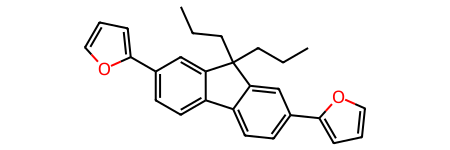

In [ ]:
# get smiles string from optdata index 23
smiles23 = optdata.loc[23, 'Chromophore']
print (smiles23)
# get molecule from smiles string
mol23 = rdkit.Chem.MolFromSmiles(smiles23)
mol23
# get Iupac name from pubmed



/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

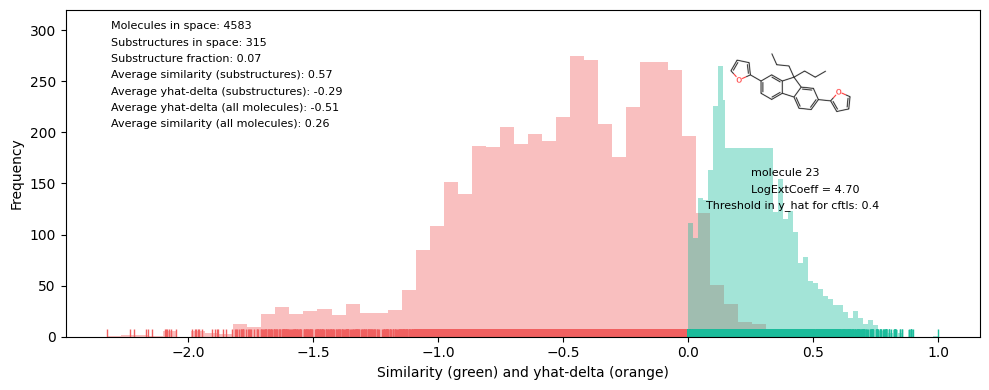

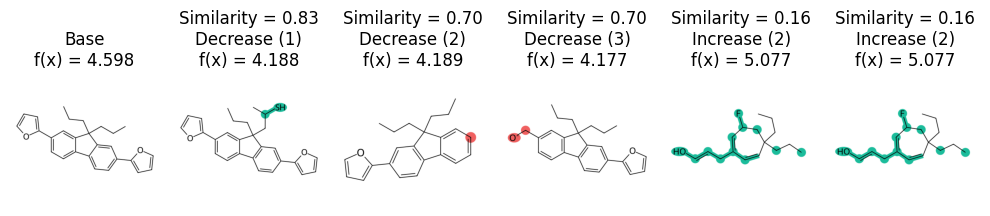

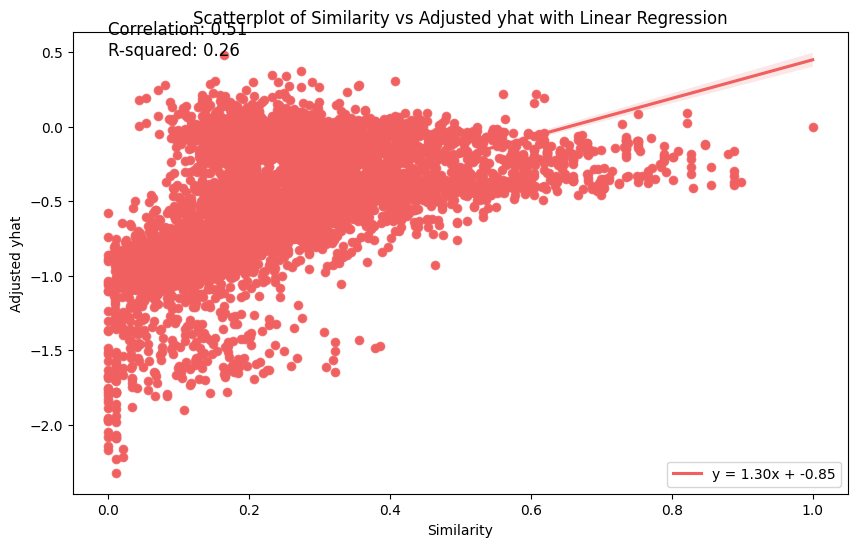

In [ ]:
space_LogExtCoeff_23_5_5000_5_04_2023_diagnostics_df = diagnostics(space_LogExtCoeff_23_5_5000_5_04_2023, smarts, LogExtCoeff_23, 23, 0.4)

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

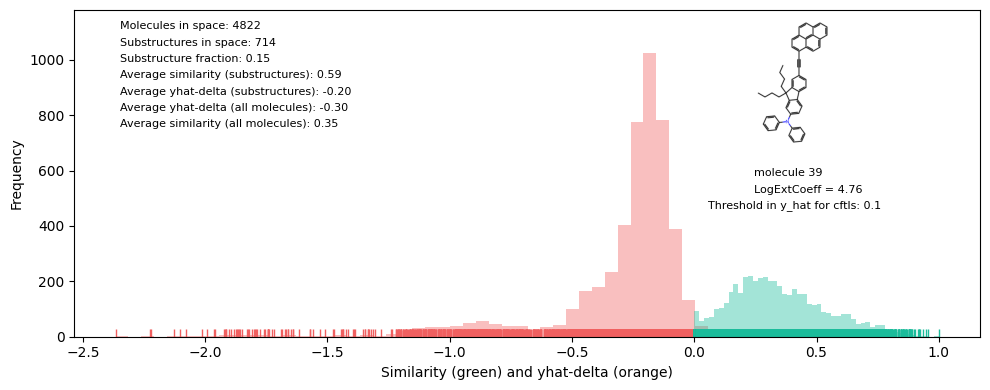

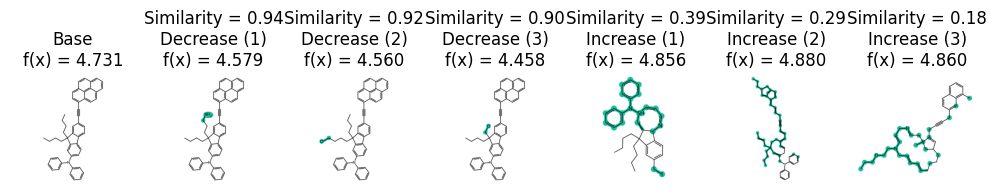

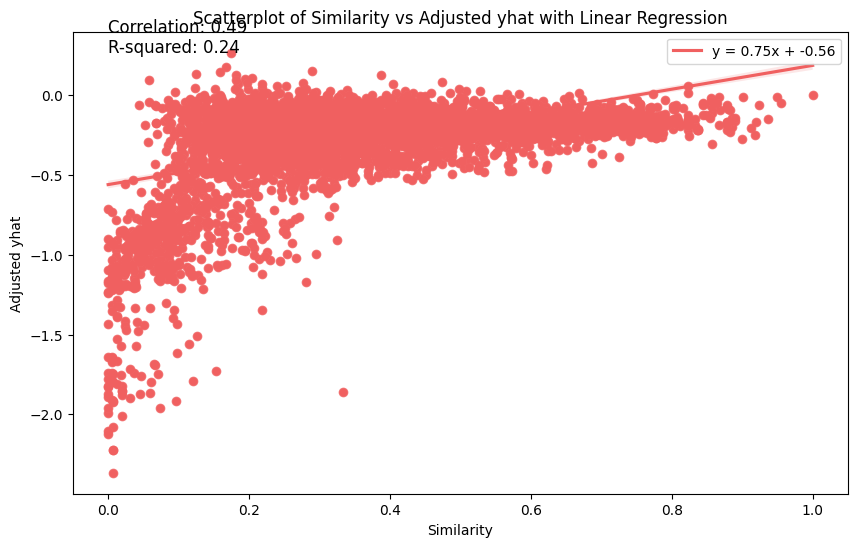

In [ ]:
space_LogExtCoeff_39_5_5000_5_04_2023_df = diagnostics(space_LogExtCoeff_39_5_5000_5_04_2023, smarts, LogExtCoeff_39, 39, 0.1)

## Experiments with SPECTRUM

the type of the space_filename_df is: <class 'pandas.core.frame.DataFrame'>
the shape of space_filename_df is: (1683, 10)
<class 'mordred._base.pandas_module.MordredDataFrame'>
the type of the space_features is: <class 'numpy.ndarray'>
the shape of space_features is: (1683, 789)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

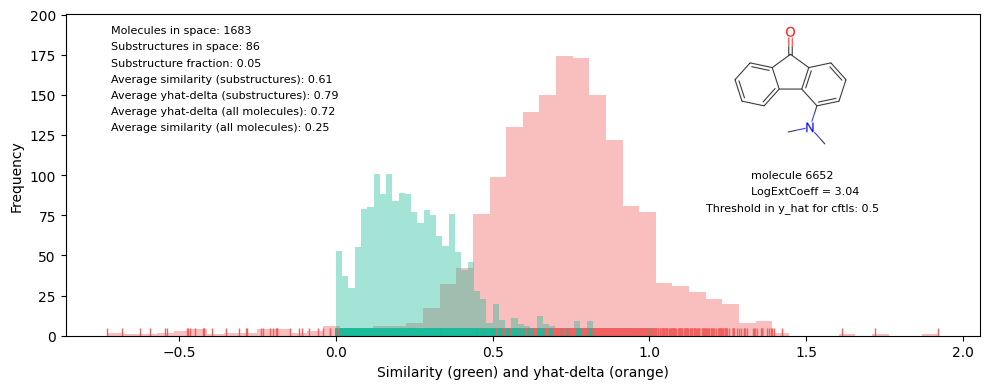

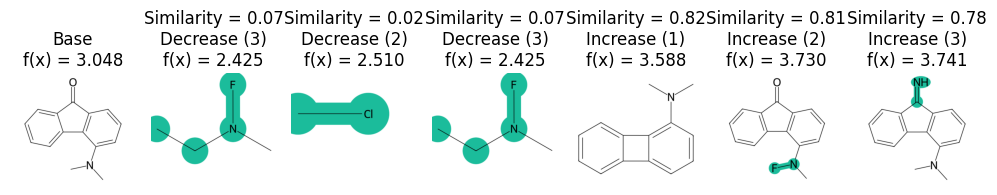

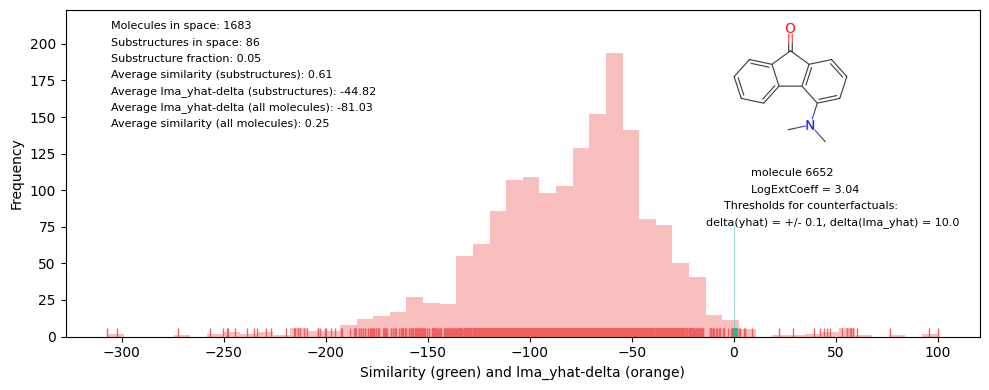

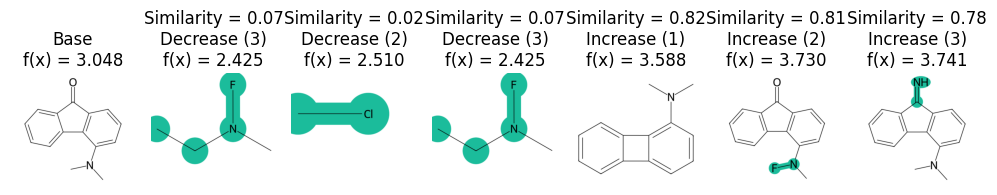

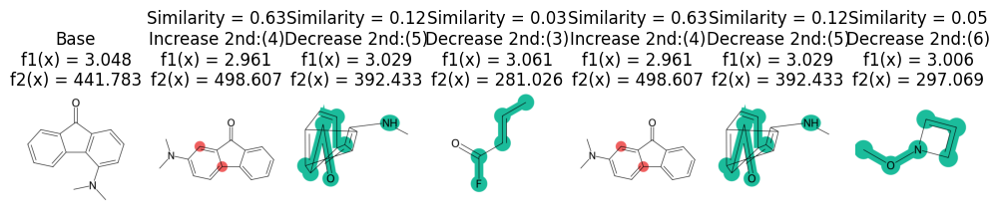

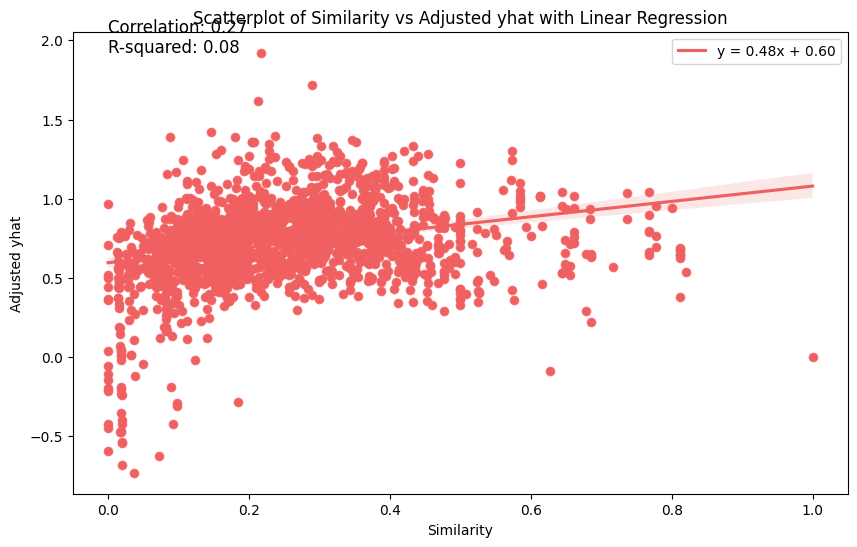

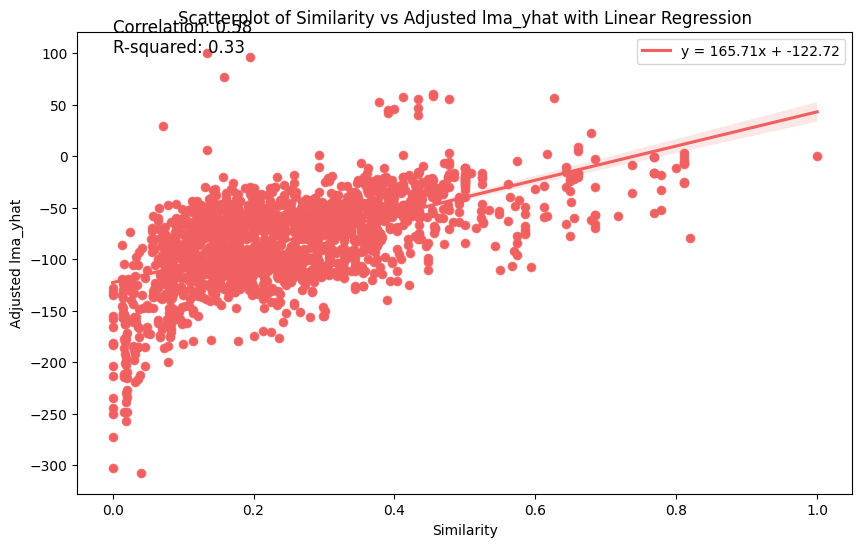

In [ ]:
space_LogExtCoeff_6652_2_2000_5_04_2023, space_LogExtCoeff_6652_2_2000_5_04_2023_features, space_LogExtCoeff_6652_2_2000_5_04_2023_features_lma, space_LogExtCoeff_6652_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_6652_2_2000_5_04_2023, space_LogExtCoeff_6652_2_2000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_6652_2_2000_5_04_2023", 6652, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
test_df = second_property_diagnostics(space_LogExtCoeff_6652_2_2000_5_04_2023, space_LogExtCoeff_6652_2_2000_5_04_2023_df, space_LogExtCoeff_6652_2_2000_5_04_2023_labels_lma, smarts, LogExtCoeff_6652, 6652, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

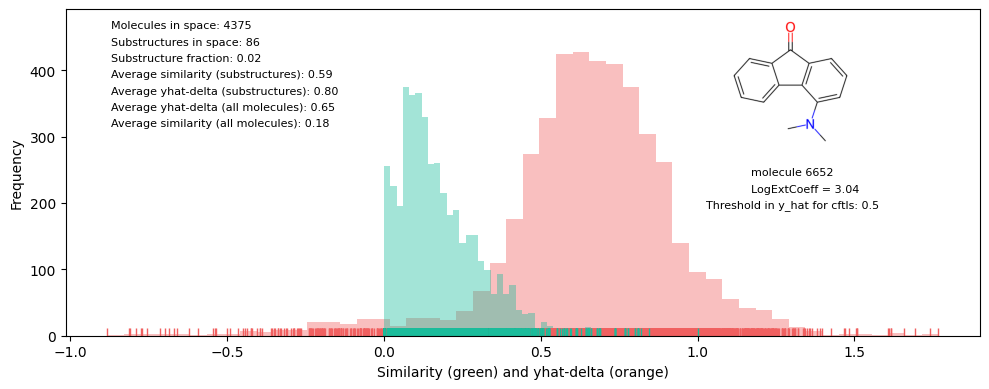

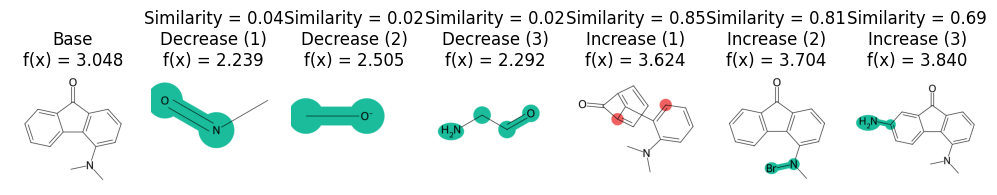

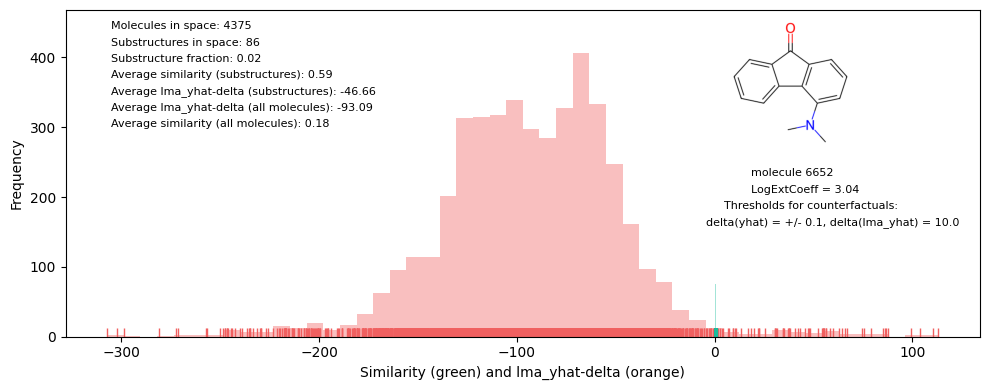

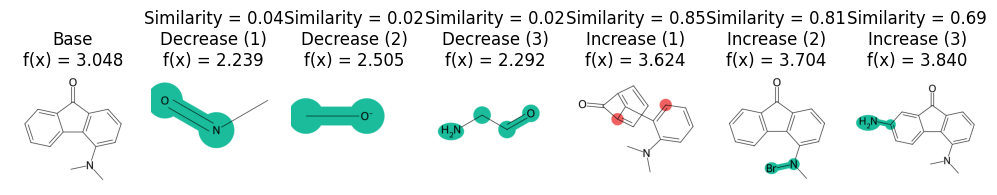

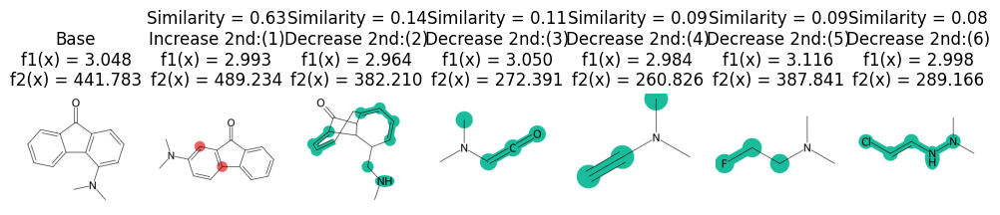

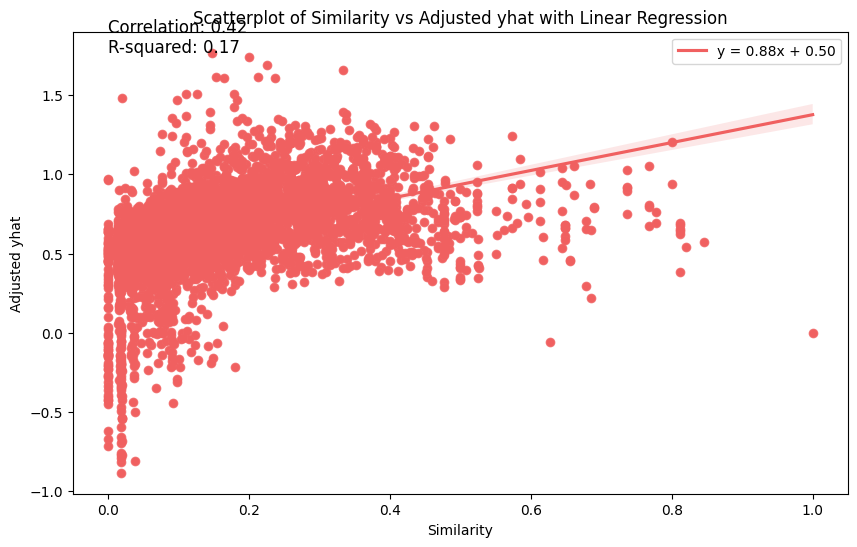

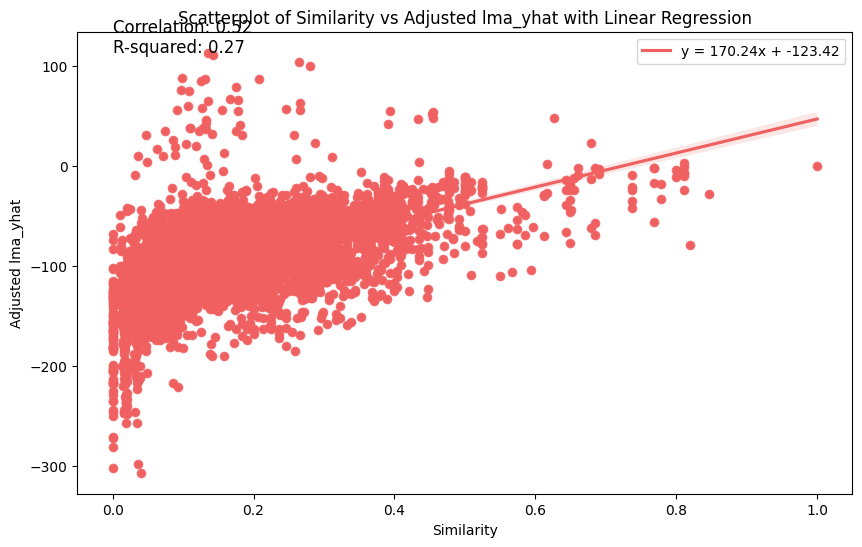

In [ ]:
test_df_6652_5_5000 = second_property_diagnostics(space_LogExtCoeff_6652_5_5000_5_04_2023, space_LogExtCoeff_6652_5_5000_5_04_2023_df, space_LogExtCoeff_6652_5_5000_5_04_2023_labels_lma, smarts, LogExtCoeff_6652, 6652, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)

/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

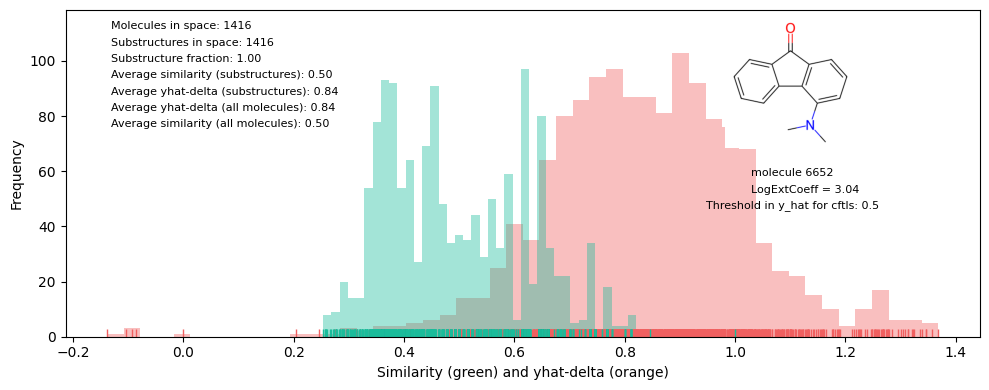

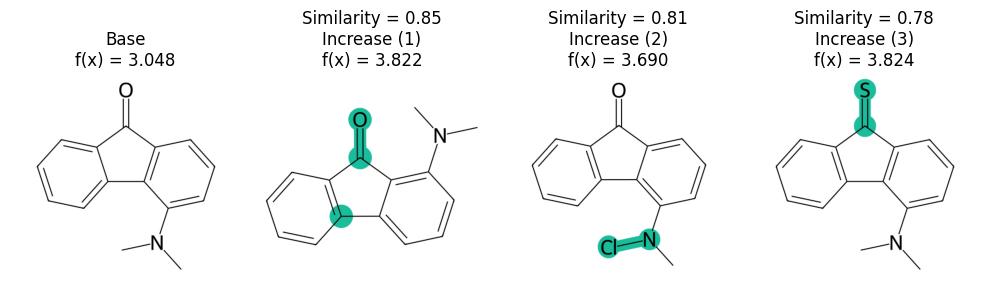

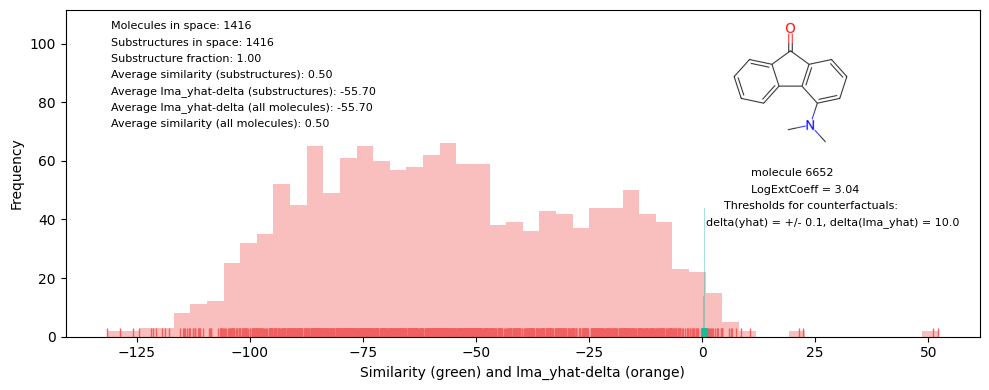

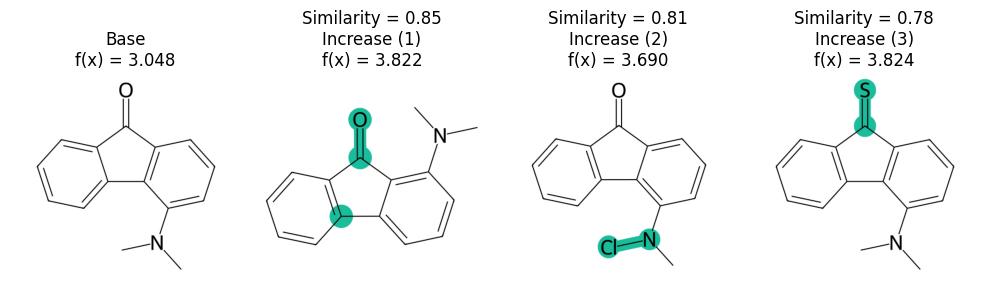

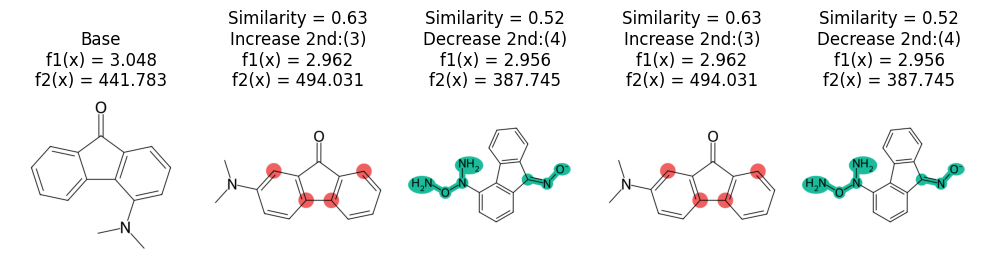

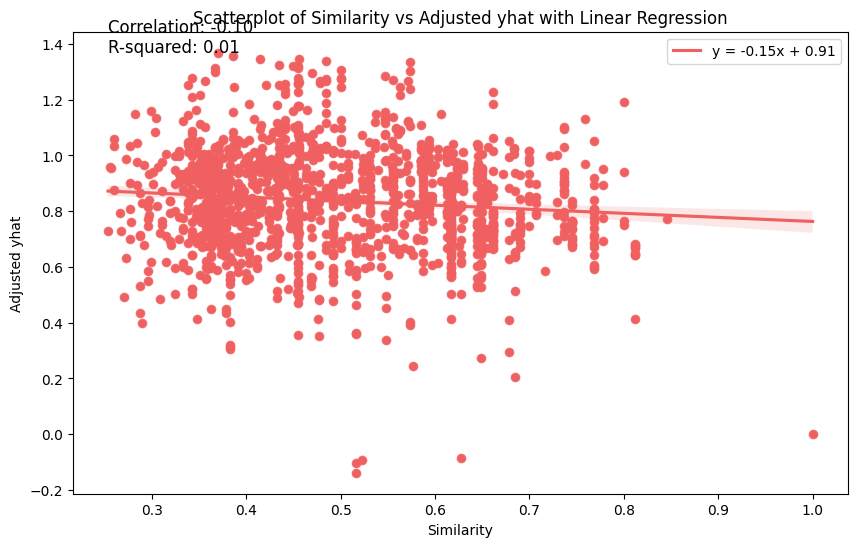

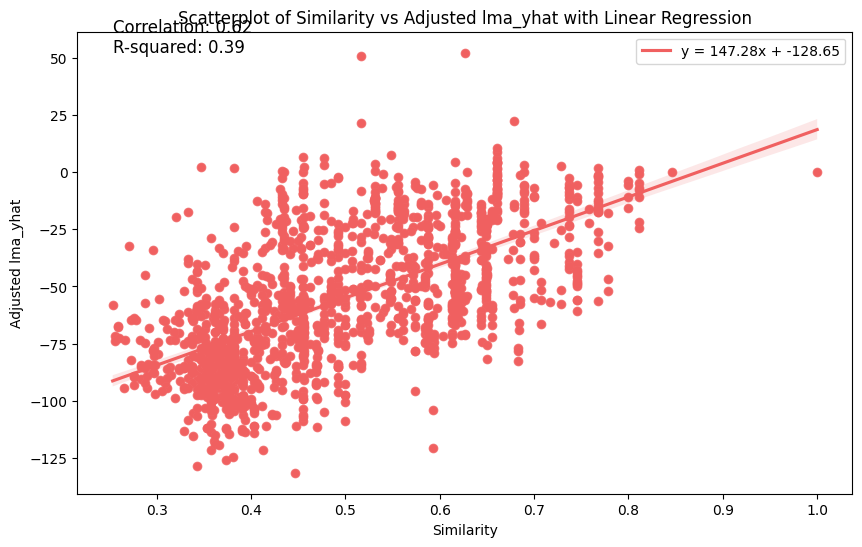

In [ ]:
test_df = second_property_diagnostics(space_LogExtCoeff_6652_5_5000_5_04_2023_subs, space_LogExtCoeff_6652_5_5000_5_04_2023_df_subs, space_LogExtCoeff_6652_5_5000_5_04_2023_labels_lma_subs, smarts, LogExtCoeff_6652, 6652, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

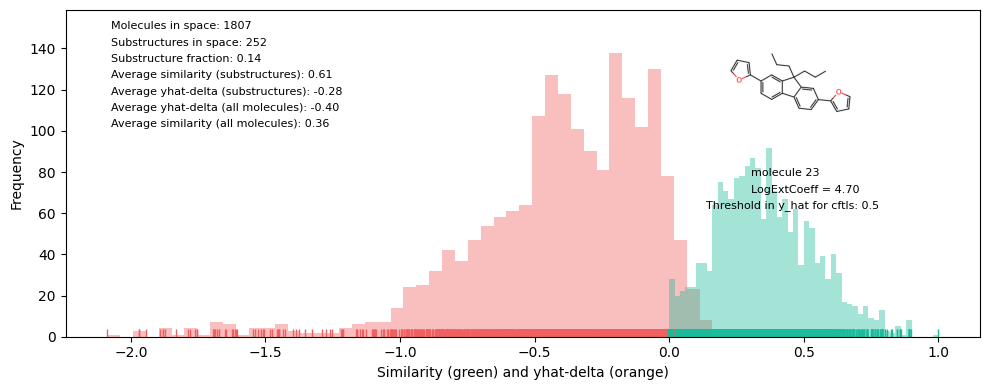

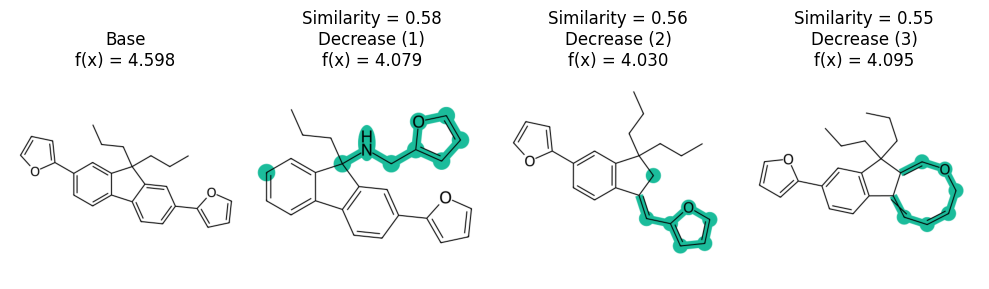

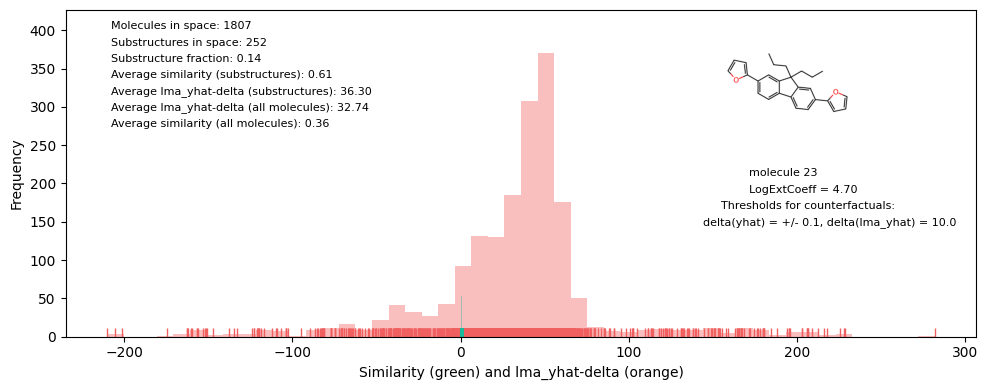

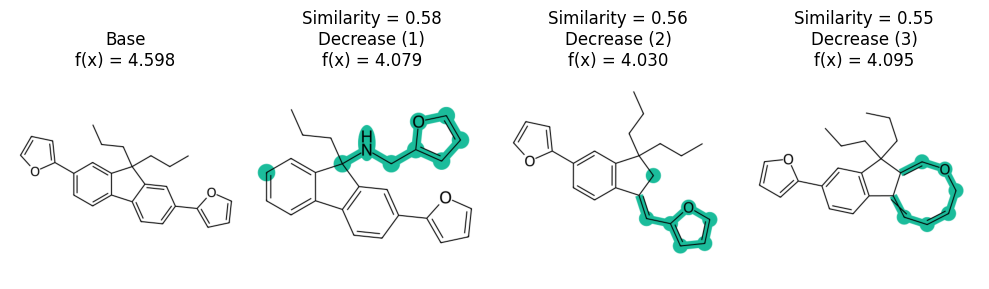

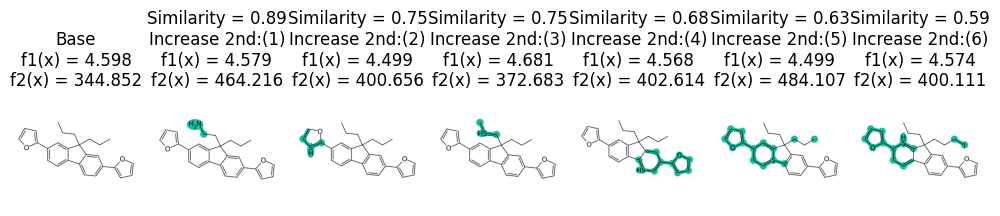

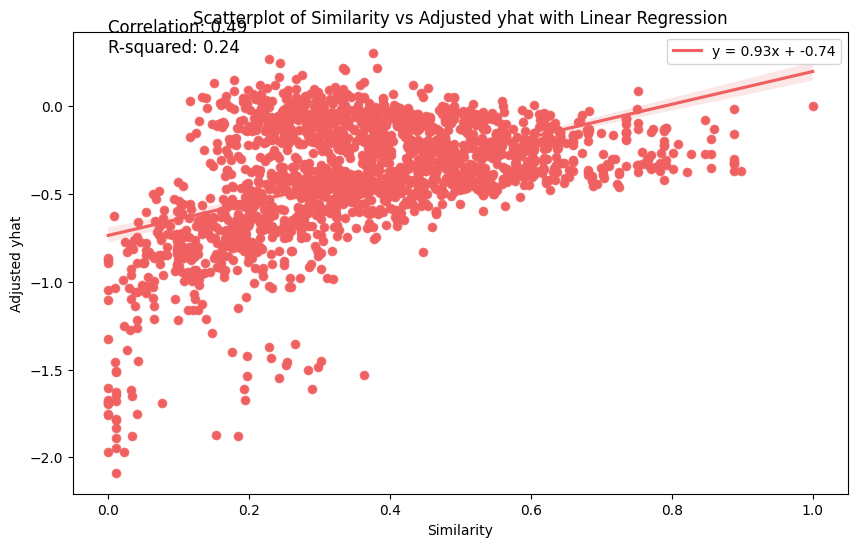

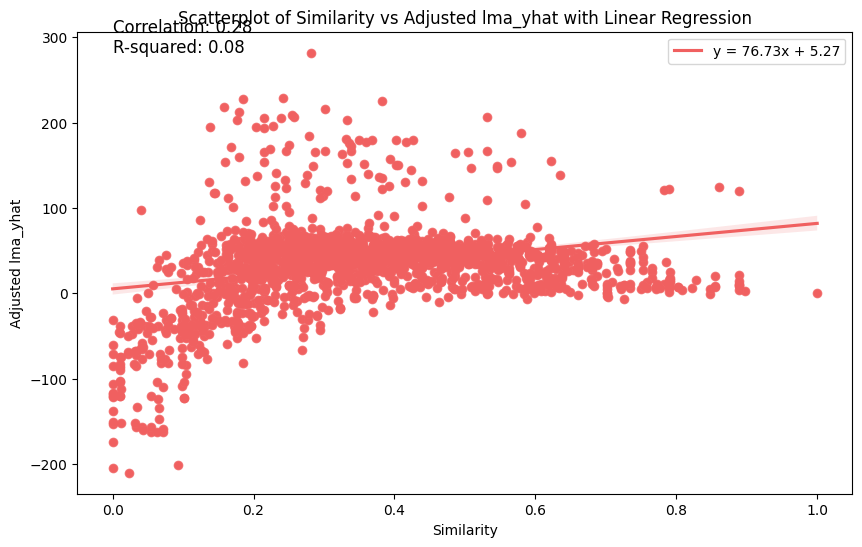

In [ ]:
test_df_23_2_2000 = second_property_diagnostics(space_LogExtCoeff_23_2_2000_5_04_2023, space_LogExtCoeff_23_2_2000_5_04_2023_df, space_LogExtCoeff_23_2_2000_5_04_2023_labels_lma, smarts, LogExtCoeff_23, 23, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

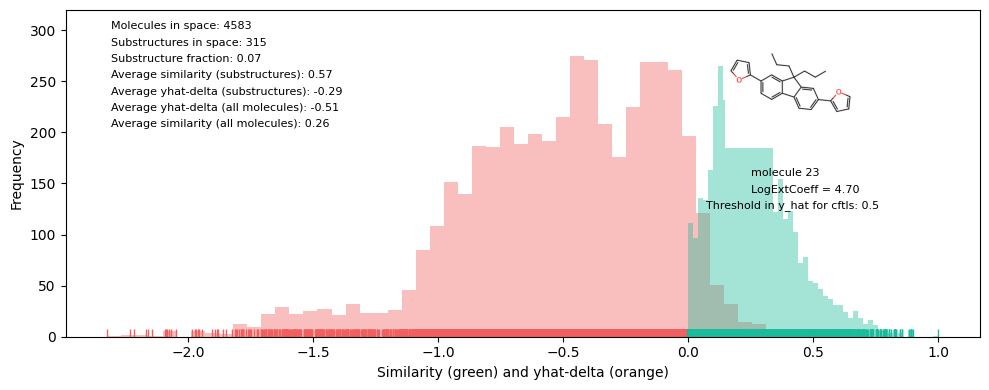

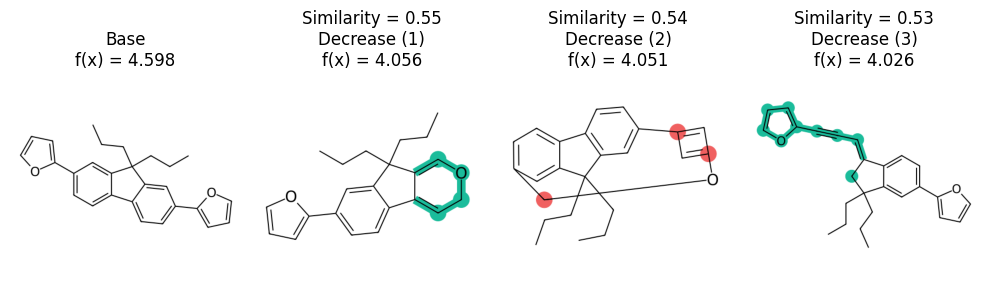

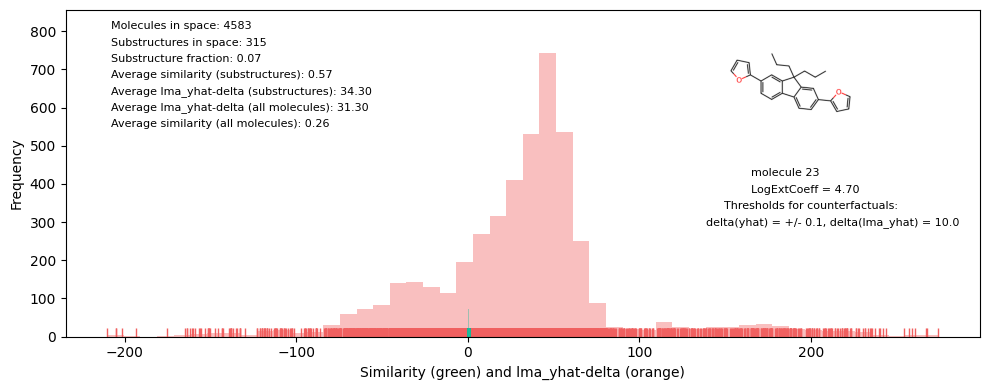

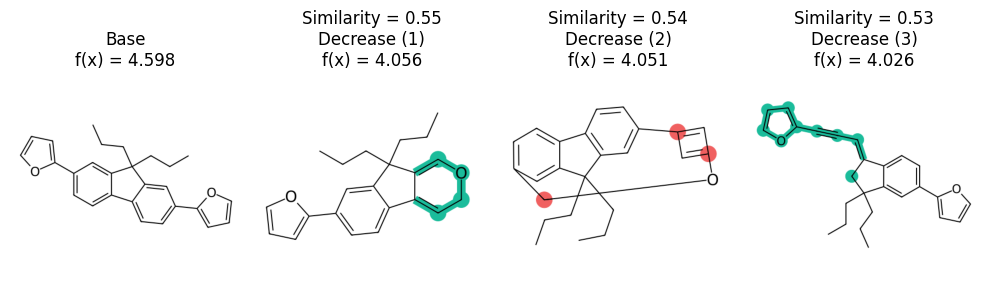

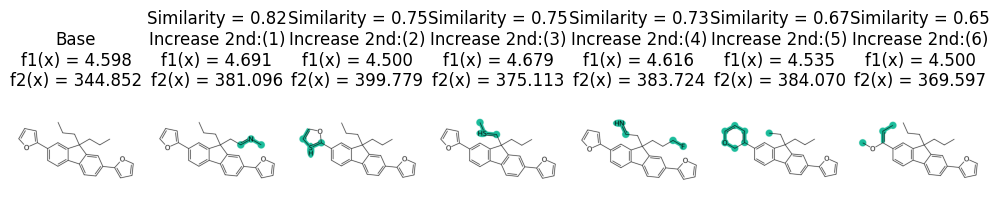

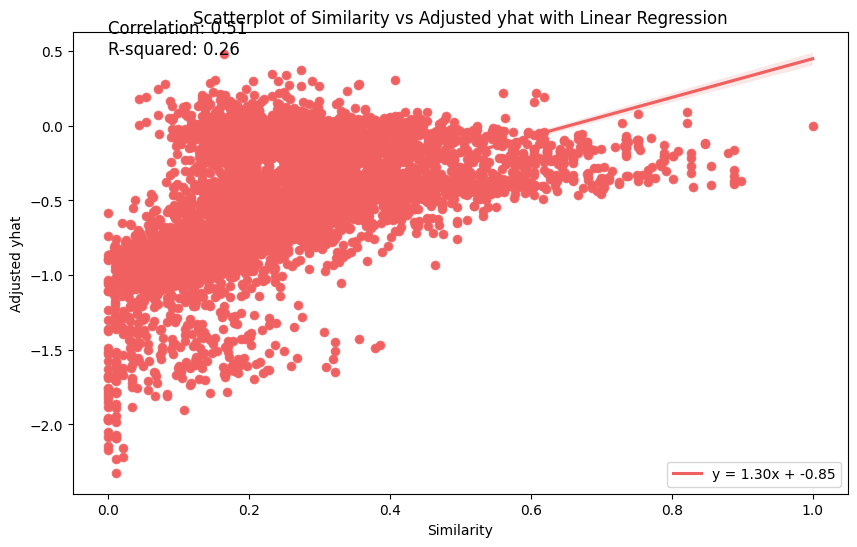

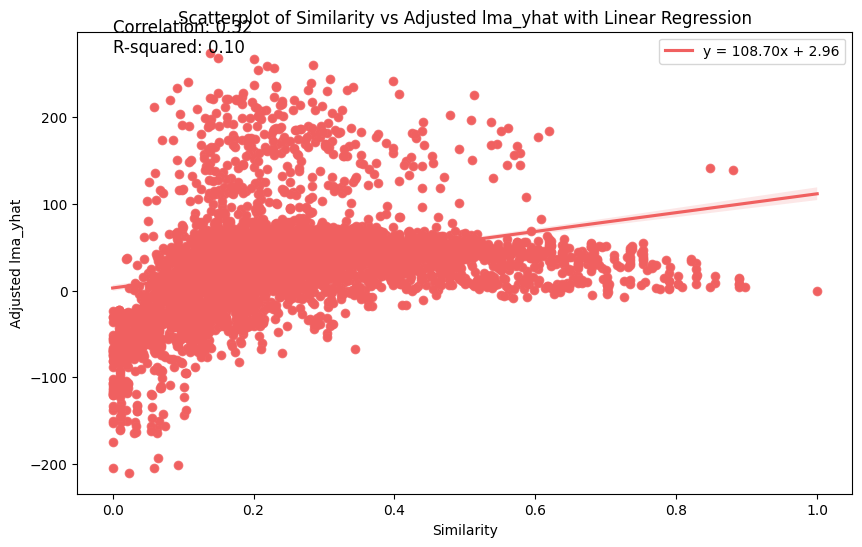

In [ ]:
test_df_23_5_5000 = second_property_diagnostics(space_LogExtCoeff_23_5_5000_5_04_2023, space_LogExtCoeff_23_5_5000_5_04_2023_df, space_LogExtCoeff_23_5_5000_5_04_2023_labels_lma, smarts, LogExtCoeff_23, 23, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)


In [ ]:
# test_df_39_2_2000 = second_property_diagnostics(space_LogExtCoeff_39_2_2000_5_04_2023, space_LogExtCoeff_39_2_2000_5_04_2023_df, space_LogExtCoeff_39_2_2000_5_04_2023_labels_lma, smarts, LogExtCoeff_39, 39, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

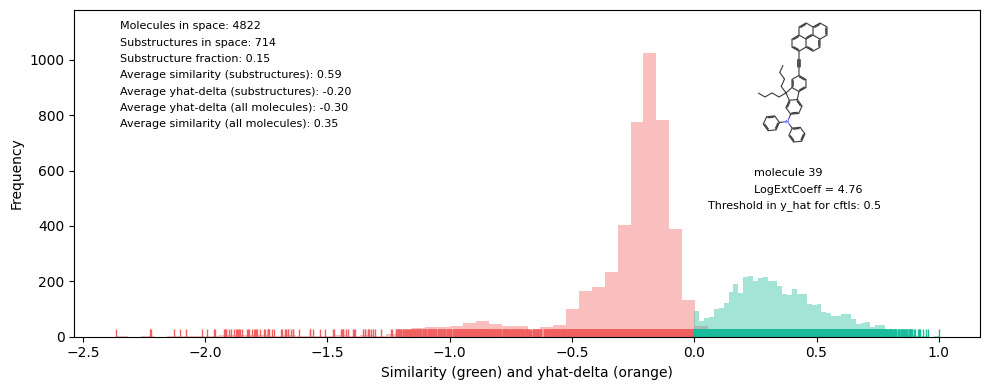

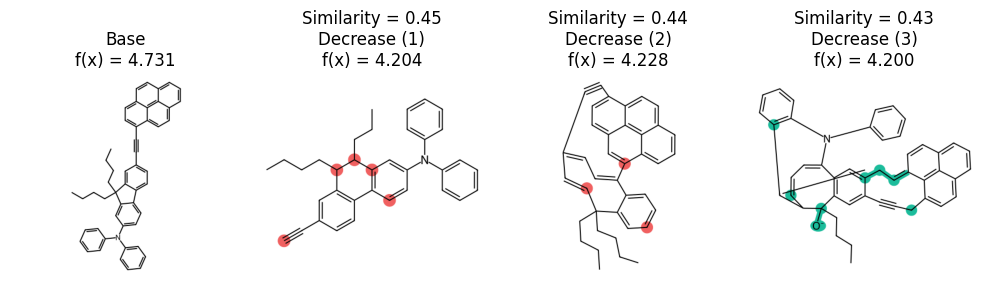

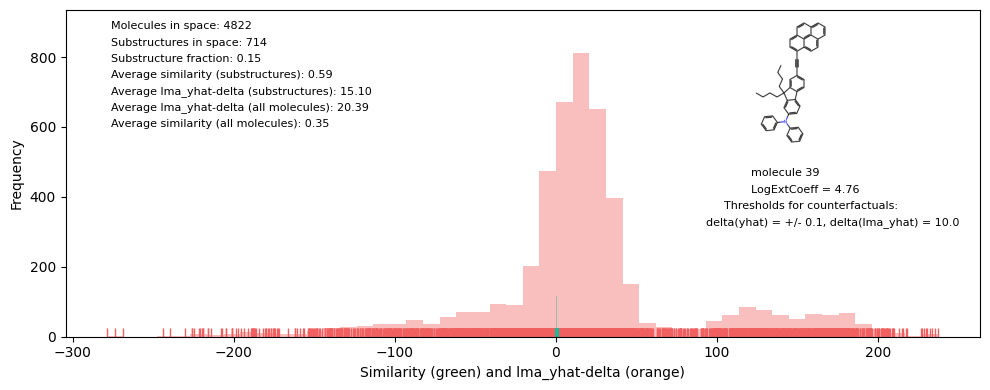

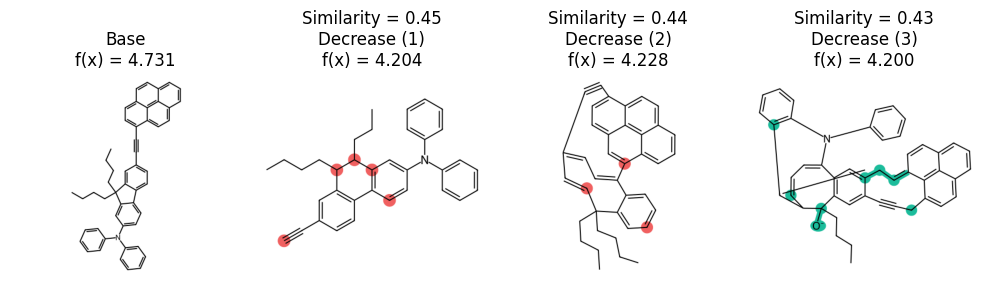

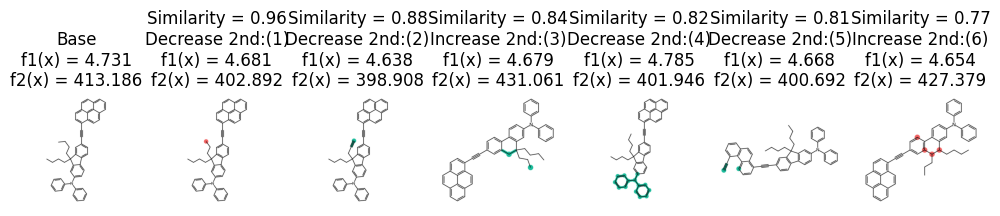

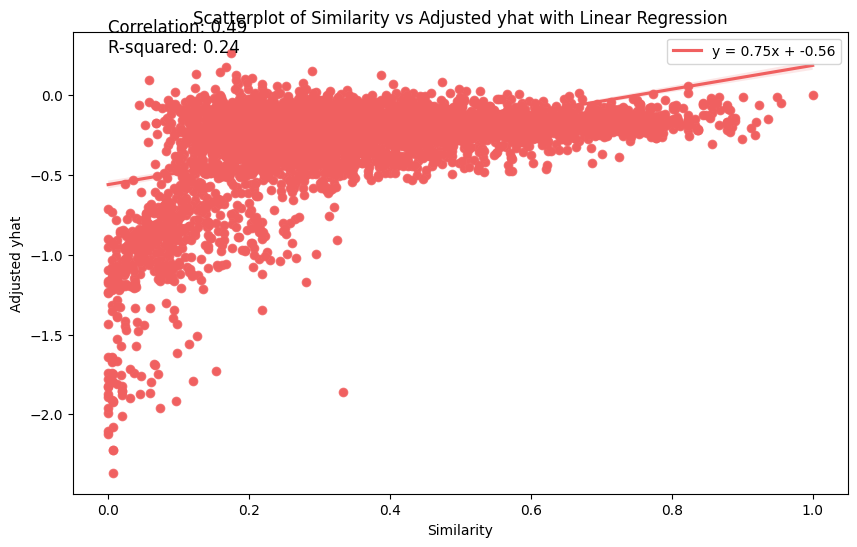

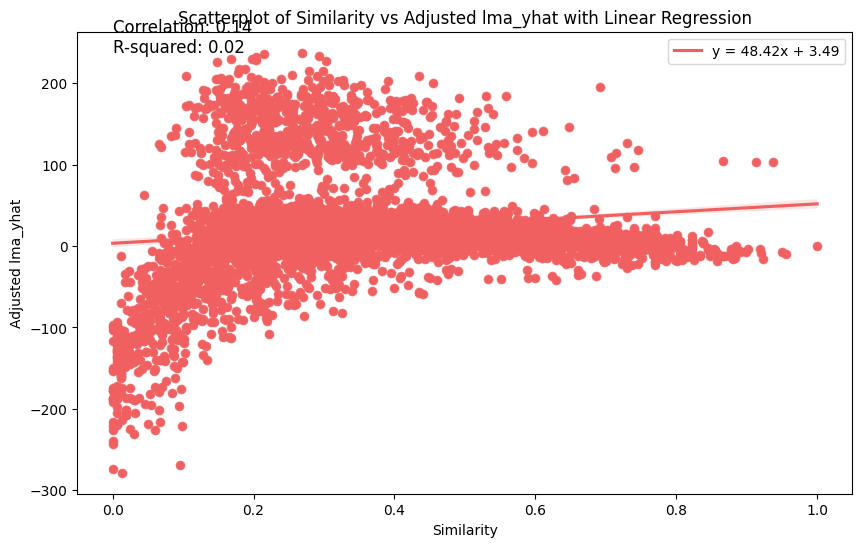

In [ ]:
test_df_39_5_5000 = second_property_diagnostics(space_LogExtCoeff_39_5_5000_5_04_2023, space_LogExtCoeff_39_5_5000_5_04_2023_df, space_LogExtCoeff_39_5_5000_5_04_2023_labels_lma, smarts, LogExtCoeff_39, 39, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

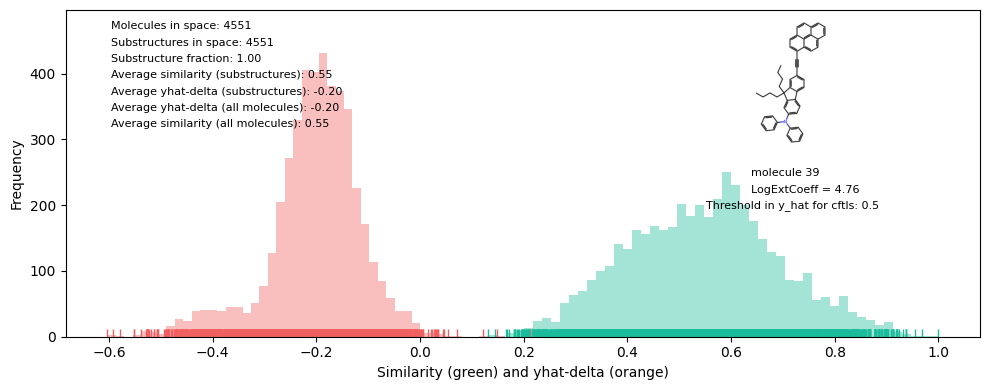

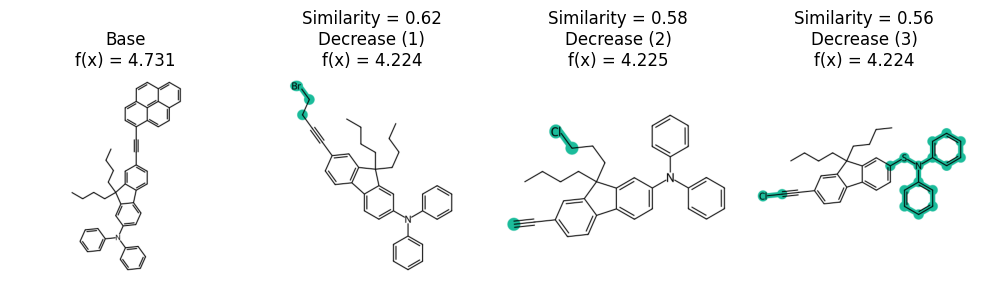

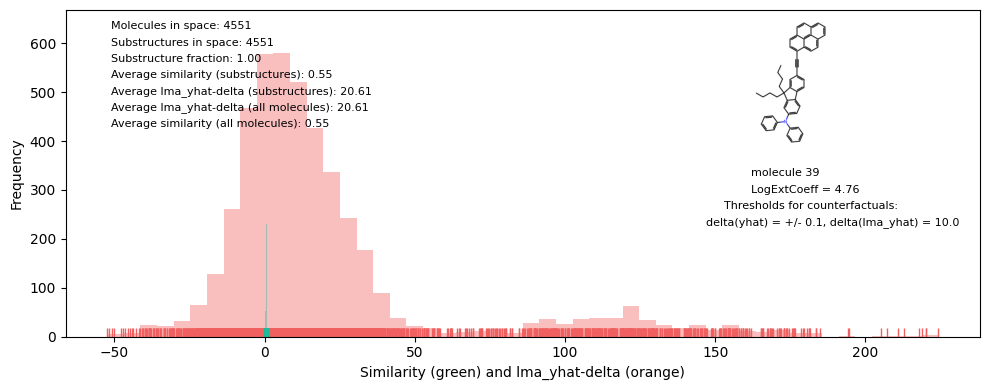

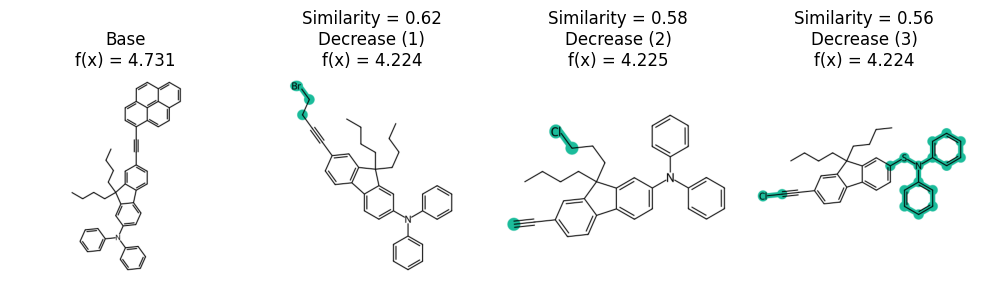

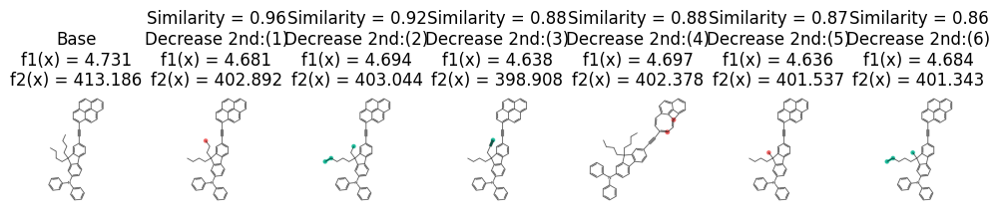

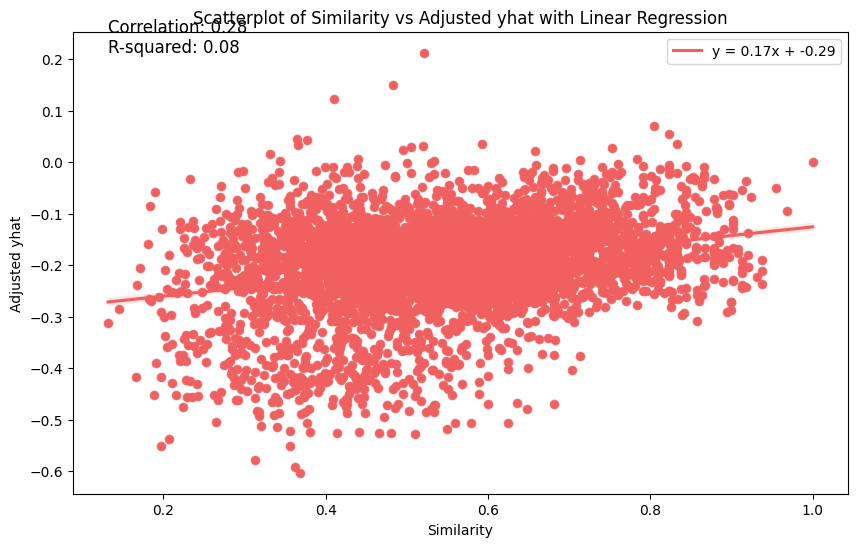

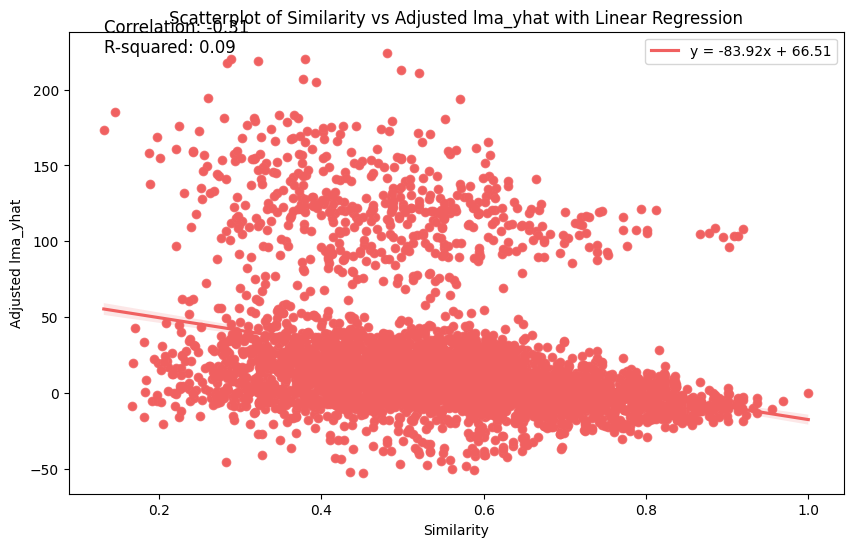

In [ ]:
test_df_39_5_5000_subs = second_property_diagnostics(space_LogExtCoeff_39_5_5000_5_04_2023_subs, space_LogExtCoeff_39_5_5000_5_04_2023_df_subs, space_LogExtCoeff_39_5_5000_5_04_2023_labels_lma_subs, smarts, LogExtCoeff_39, 39, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)


the type of the space_filename_df is: <class 'pandas.core.frame.DataFrame'>
the shape of space_filename_df is: (1750, 10)
<class 'mordred._base.pandas_module.MordredDataFrame'>
the type of the space_features is: <class 'numpy.ndarray'>
the shape of space_features is: (1750, 789)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

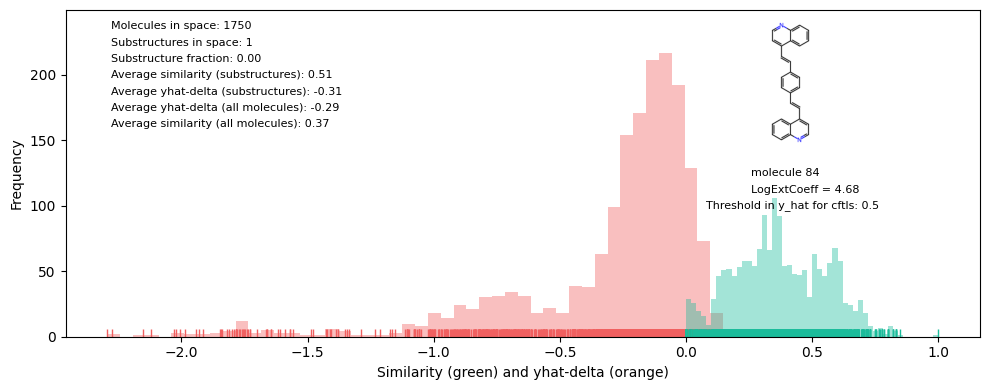

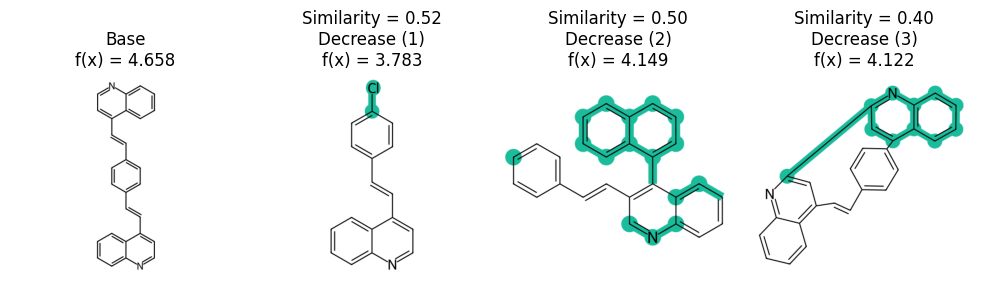

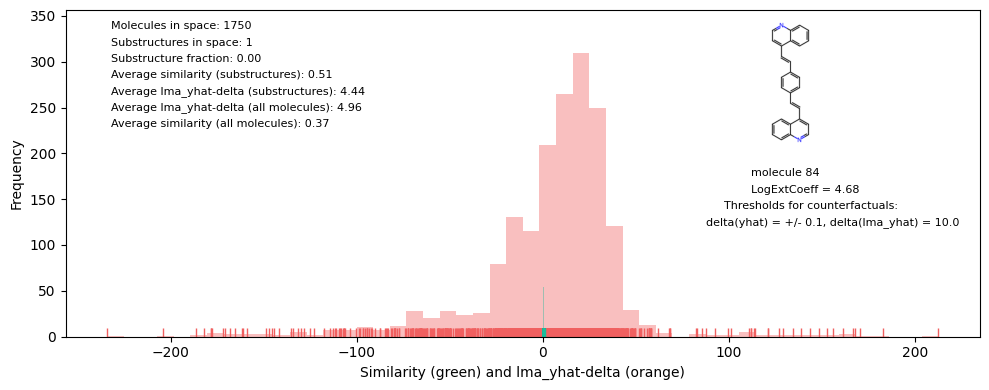

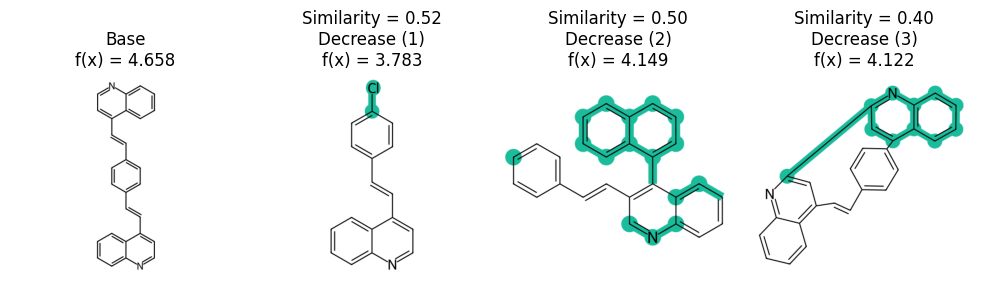

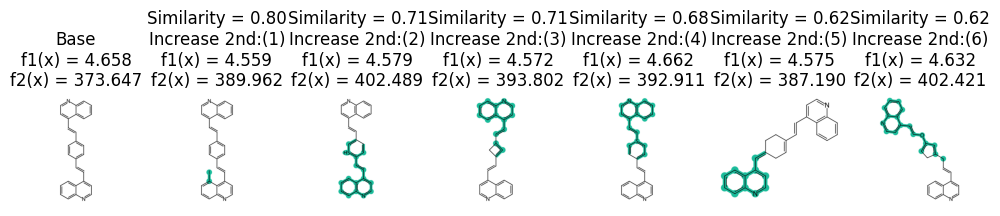

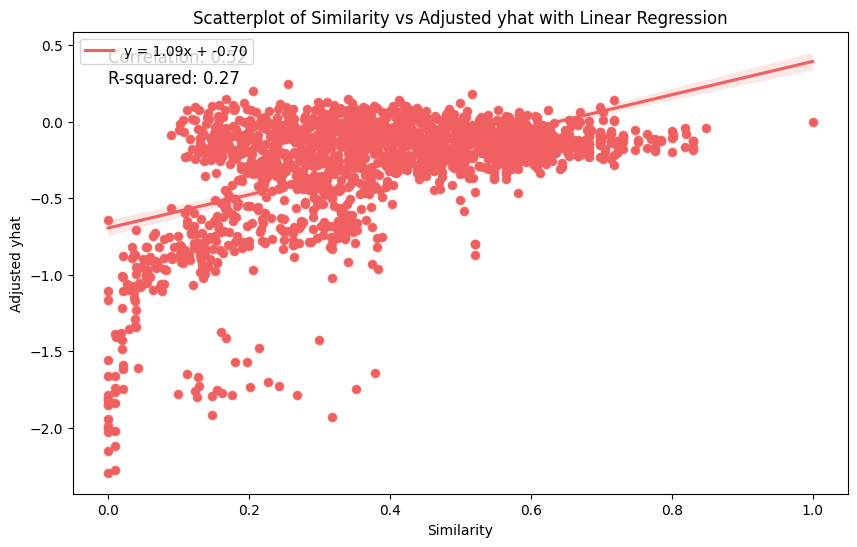

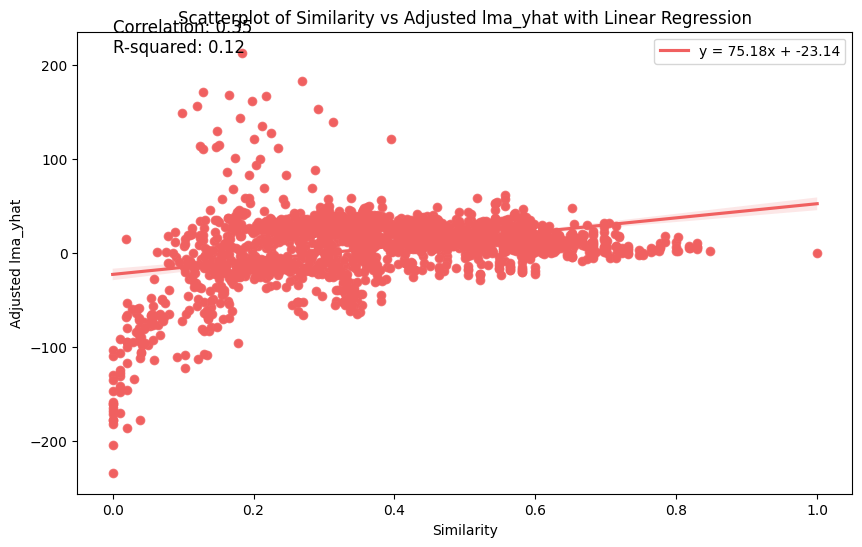

In [ ]:
space_LogExtCoeff_84_2_2000_5_04_2023, space_LogExtCoeff_84_2_2000_5_04_2023_features, space_LogExtCoeff_84_2_2000_5_04_2023_features_lma, space_LogExtCoeff_84_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_84_2_2000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_84_2_2000_5_04_2023, space_LogExtCoeff_84_2_2000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_84_2_2000_5_04_2023", 84, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)

test_df_84_2_2000 = second_property_diagnostics(space_LogExtCoeff_84_2_2000_5_04_2023, space_LogExtCoeff_84_2_2000_5_04_2023_df, space_LogExtCoeff_84_2_2000_5_04_2023_labels_lma, smarts, LogExtCoeff_84, 84, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

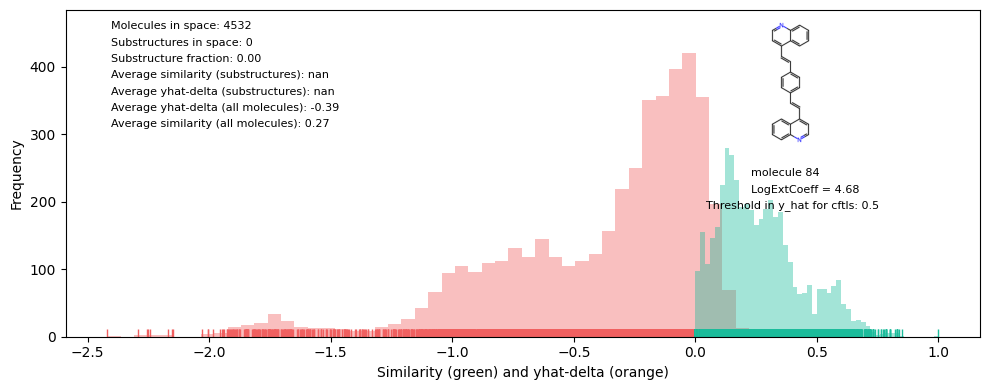

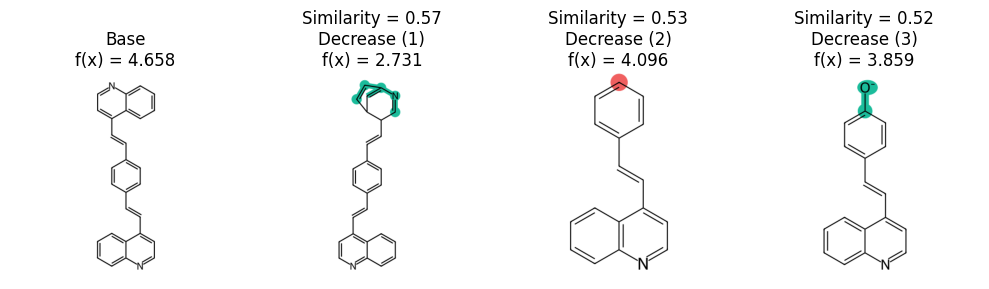

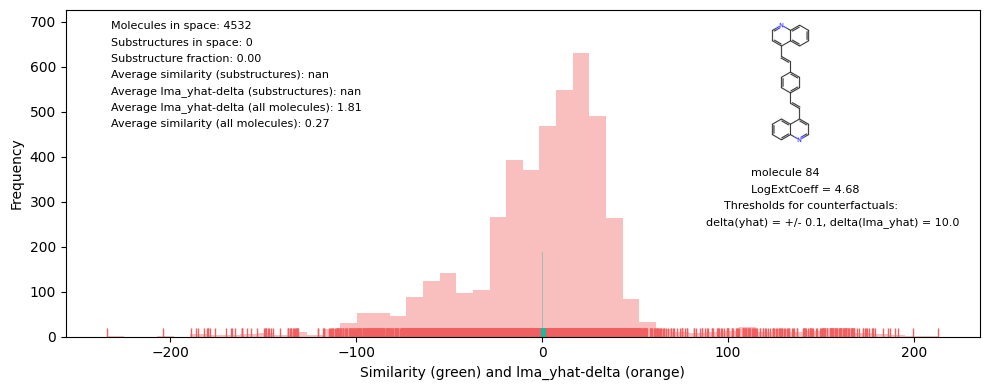

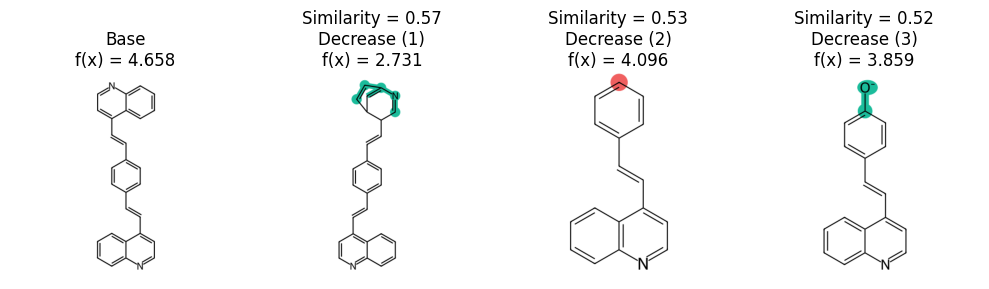

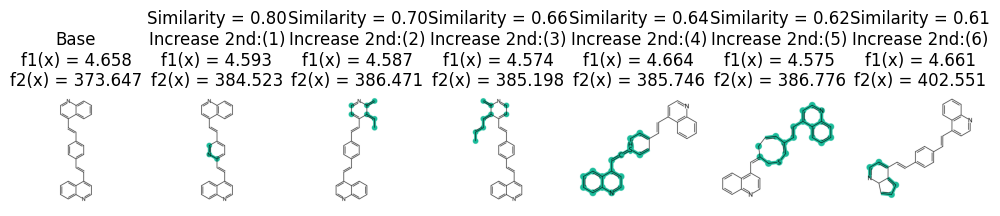

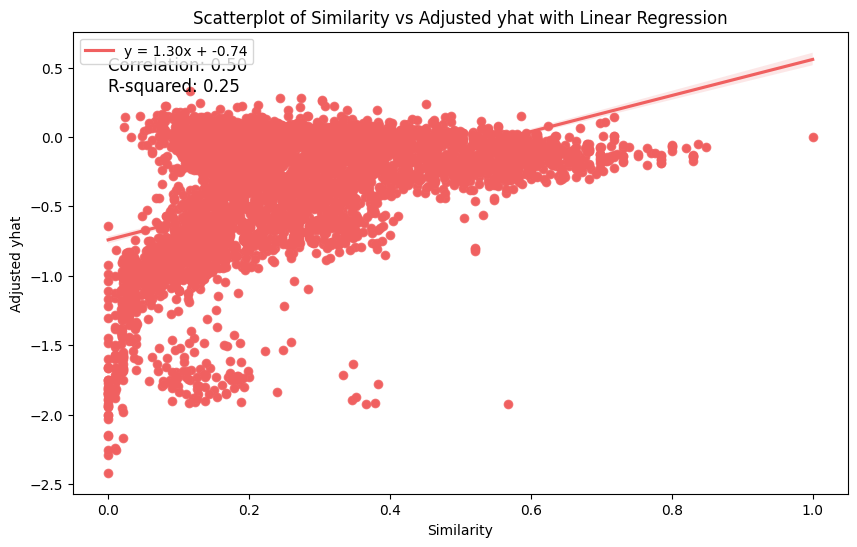

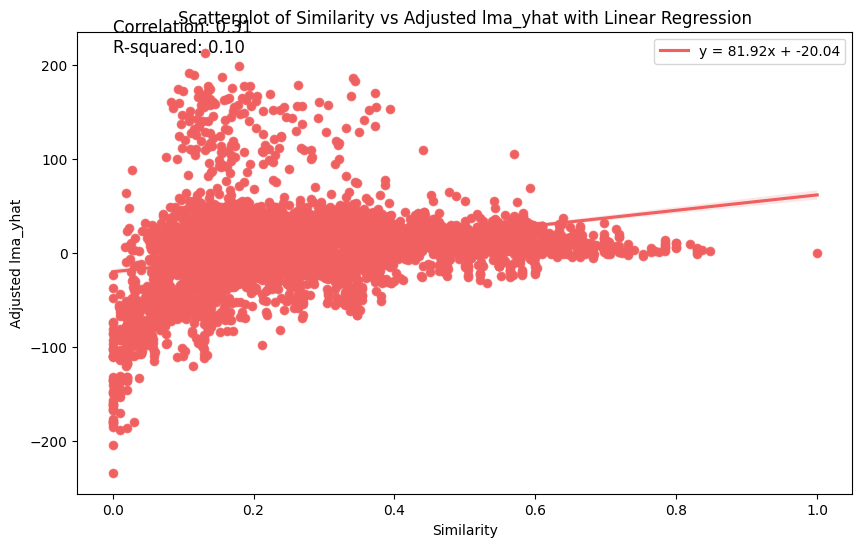

In [ ]:
test_df_84_5_5000 = second_property_diagnostics(space_LogExtCoeff_84_5_5000_5_04_2023, space_LogExtCoeff_84_5_5000_5_04_2023_df, space_LogExtCoeff_84_5_5000_5_04_2023_labels_lma, smarts, LogExtCoeff_84, 84, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)


the type of the space_filename_df is: <class 'pandas.core.frame.DataFrame'>
the shape of space_filename_df is: (1668, 10)
<class 'mordred._base.pandas_module.MordredDataFrame'>
the type of the space_features is: <class 'numpy.ndarray'>
the shape of space_features is: (1668, 789)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

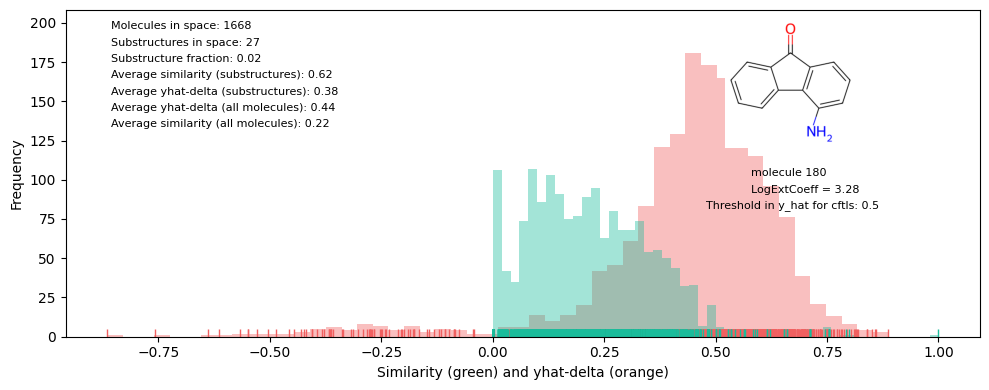

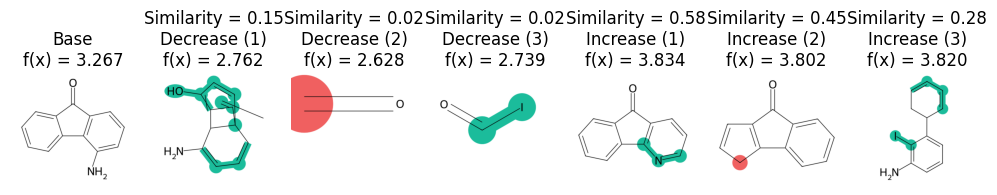

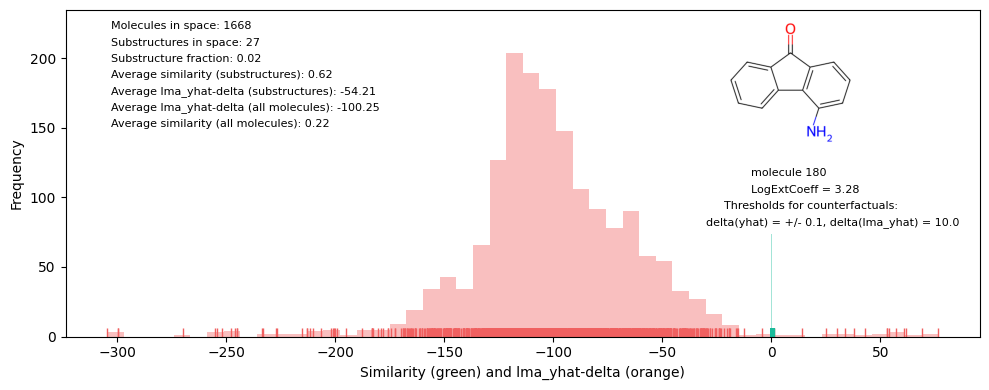

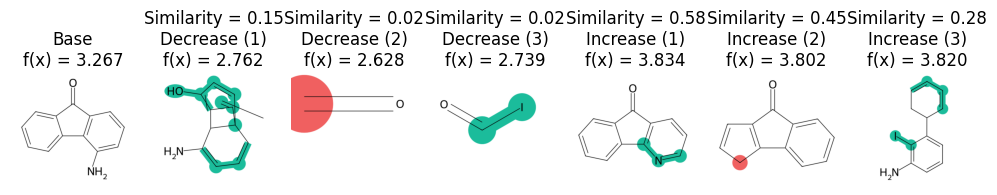

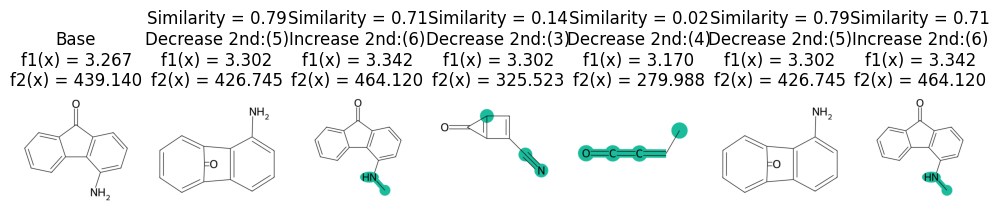

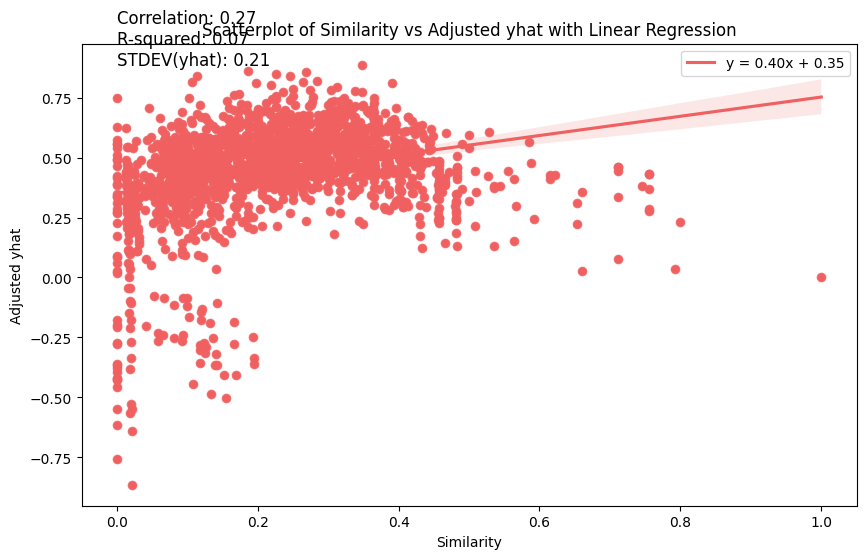

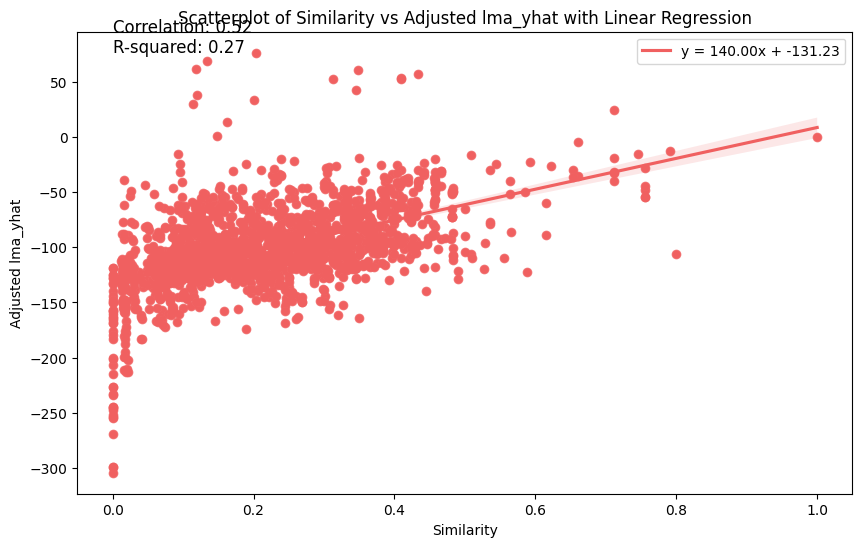

In [ ]:
space_LogExtCoeff_180_2_2000_5_04_2023, space_LogExtCoeff_180_2_2000_5_04_2023_features, space_LogExtCoeff_180_2_2000_5_04_2023_features_lma, space_LogExtCoeff_180_2_2000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_180_2_2000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_180_2_2000_5_04_2023, space_LogExtCoeff_180_2_2000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_180_2_2000_5_04_2023", 180, substructure_smarts = None, stoned_kwargs = stoned_kwargs_2_2000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
# space_LogExtCoeff_180_5_5000_5_04_2023, space_LogExtCoeff_180_5_5000_5_04_2023_features, space_LogExtCoeff_180_5_5000_5_04_2023_features_lma, space_LogExtCoeff_180_5_5000_5_04_2023_labels_LogExtCoeff, space_LogExtCoeff_180_5_5000_5_04_2023_labels_lma, raw_space_features_LogExtCoeff_180_5_5000_5_04_2023, space_LogExtCoeff_180_5_5000_5_04_2023_df = set_and_forget_space_features_generator("space_LogExtCoeff_180_5_5000_5_04_2023", 180, substructure_smarts = None, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)
# space_LogExtCoeff_180_5_5000_5_04_2023_subs, space_LogExtCoeff_180_5_5000_5_04_2023_features_subs, space_LogExtCoeff_180_5_5000_5_04_2023_features_lma_subs, space_LogExtCoeff_180_5_5000_5_04_2023_labels_LogExtCoeff_subs, space_LogExtCoeff_180_5_5000_5_04_2023_labels_lma_subs, raw_space_features_LogExtCoeff_180_5_5000_5_04_2023_subs, space_LogExtCoeff_180_5_5000_5_04_2023_df_subs = set_and_forget_space_features_generator("space_LogExtCoeff_180_5_5000_5_04_2023_subs", 180, substructure_smarts = fluorene_smarts, stoned_kwargs = stoned_kwargs_5_5000, mordred_calc = calc, features_select_first = features_select, features_select_second = features_select_lma, clf_first = clf, clf_second = clf_lma)


test_df_180_2_2000 = second_property_diagnostics(space_LogExtCoeff_180_2_2000_5_04_2023, space_LogExtCoeff_180_2_2000_5_04_2023_df, space_LogExtCoeff_180_2_2000_5_04_2023_labels_lma, smarts, LogExtCoeff_180, 180, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

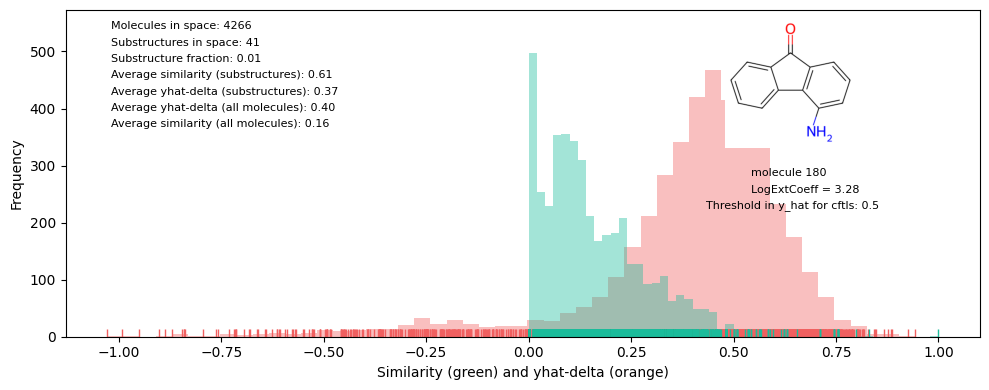

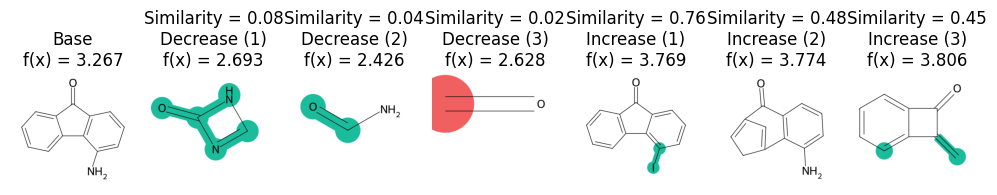

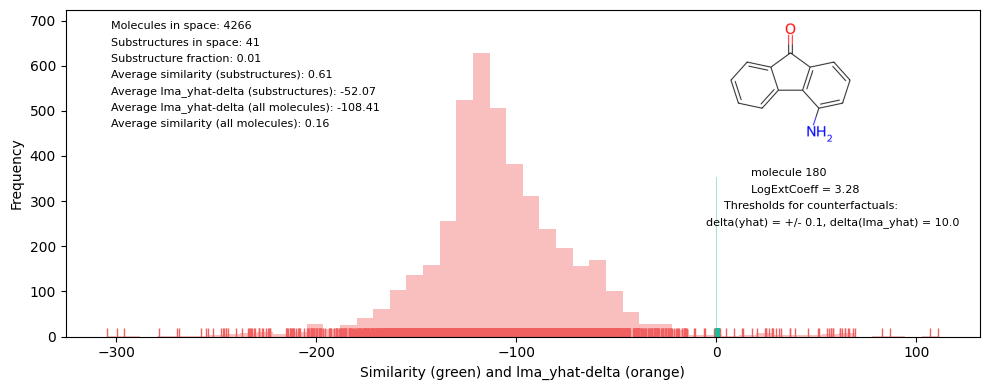

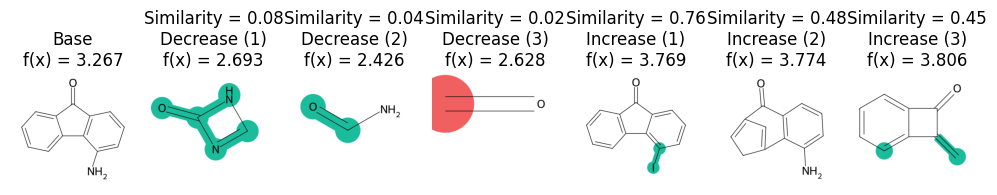

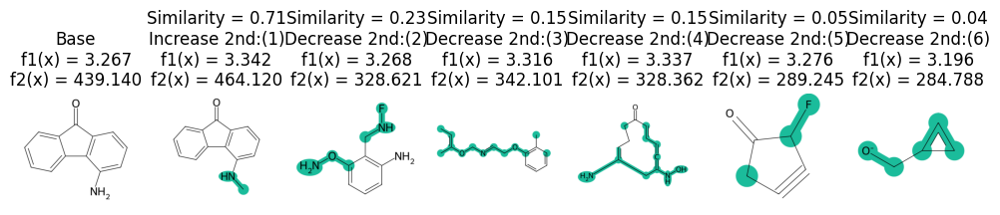

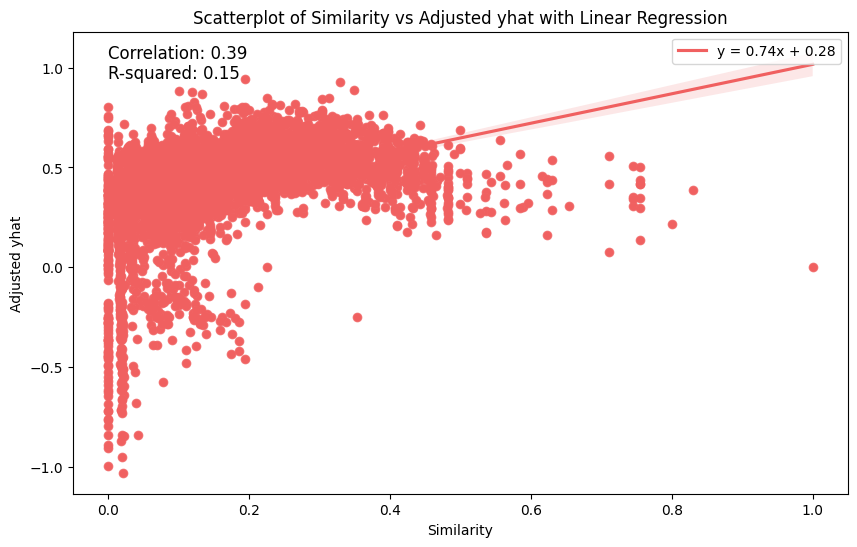

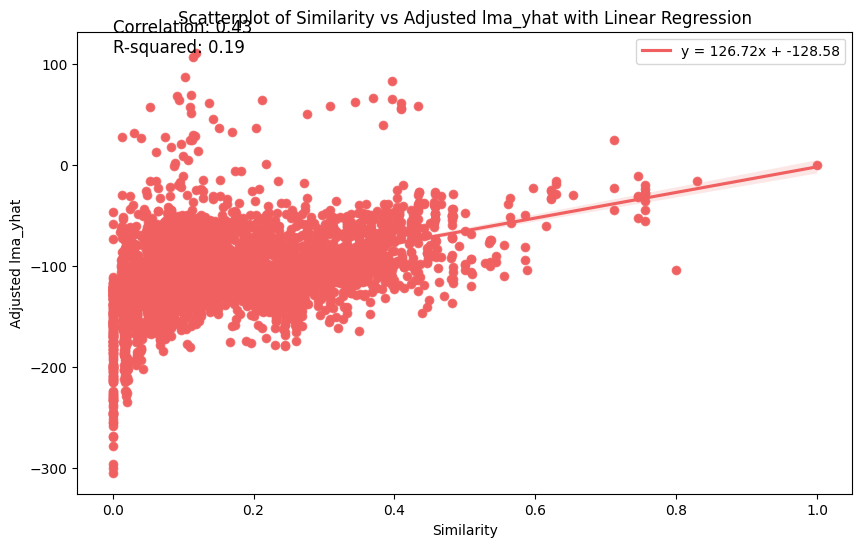

In [ ]:
test_df_180_5_5000 = second_property_diagnostics(space_LogExtCoeff_180_5_5000_5_04_2023, space_LogExtCoeff_180_5_5000_5_04_2023_df, space_LogExtCoeff_180_5_5000_5_04_2023_labels_lma, smarts, LogExtCoeff_180, 180, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

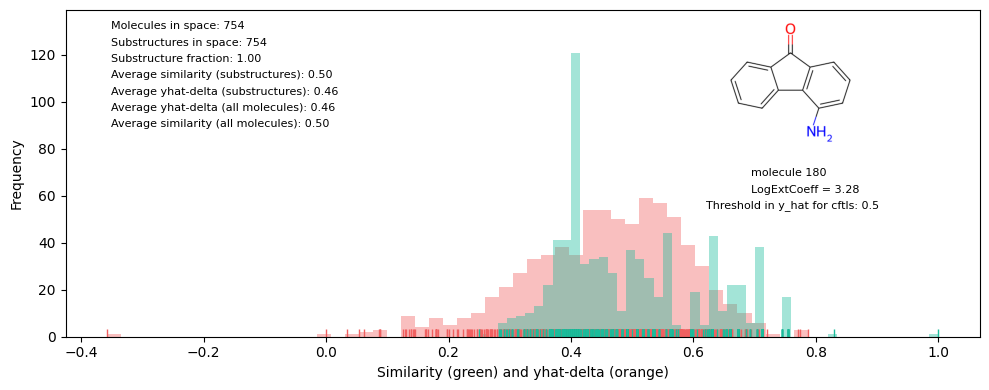

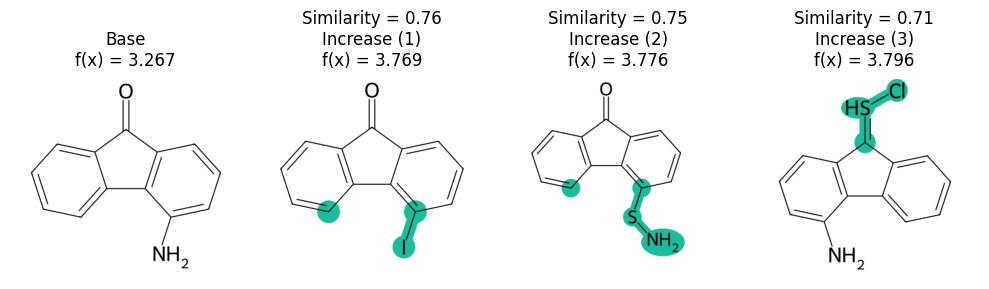

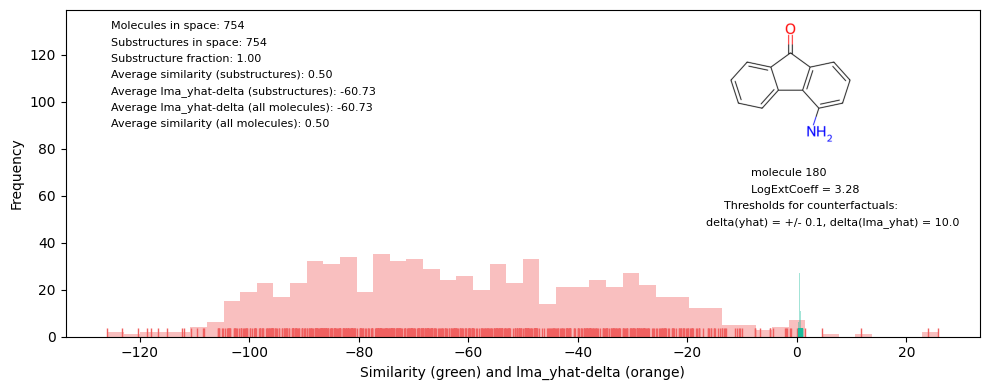

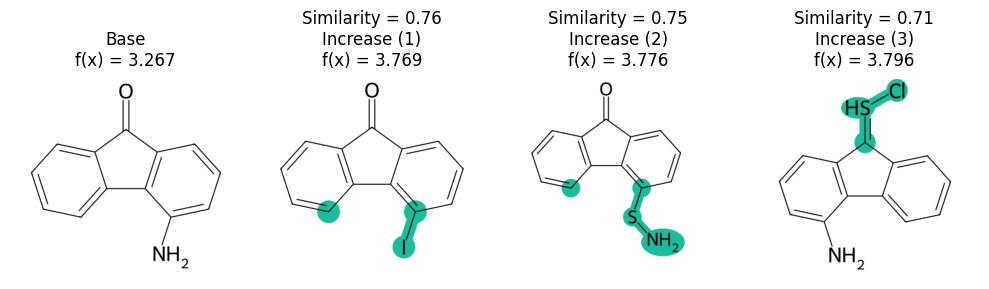

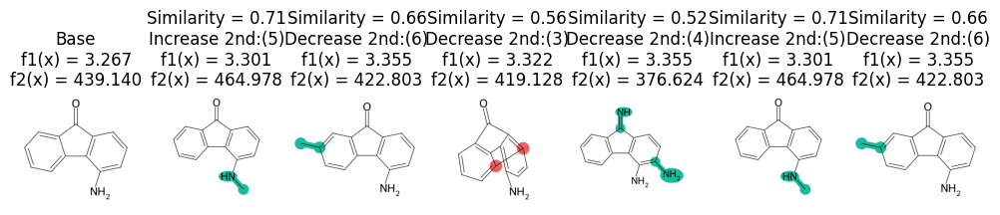

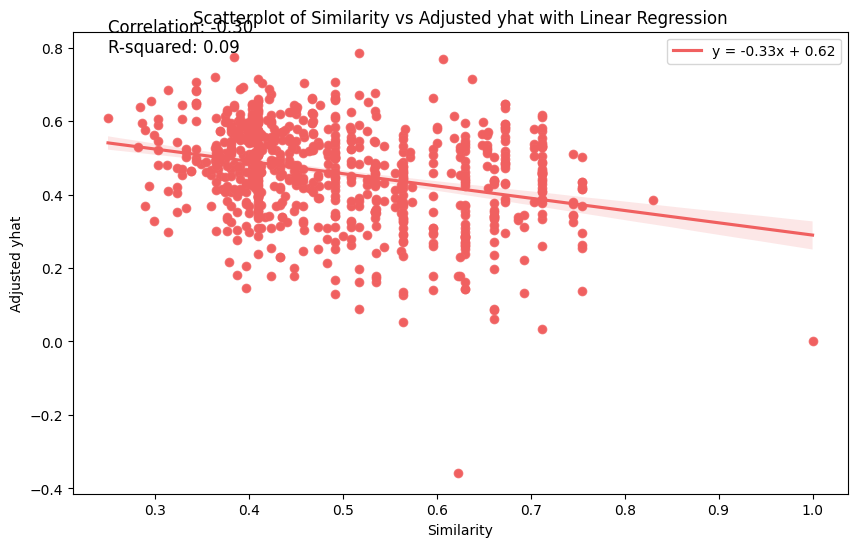

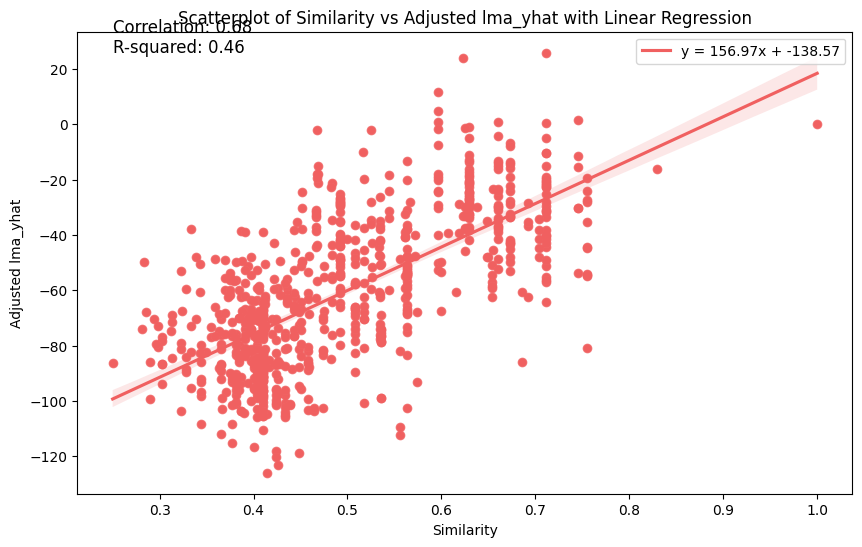

In [ ]:
test_df_180_5_5000_subs = second_property_diagnostics(space_LogExtCoeff_180_5_5000_5_04_2023_subs, space_LogExtCoeff_180_5_5000_5_04_2023_df_subs, space_LogExtCoeff_180_5_5000_5_04_2023_labels_lma_subs, smarts, LogExtCoeff_180, 180, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st = 6, nmols2nd = 6)


In [ ]:
# show the entry for index # 180 from optdata
print (optdata.iloc[180])



Tag                               12177
Chromophore     Nc1cccc2c1-c1ccccc1C2=O
Solvent                        c1ccccc1
LambdaMaxAbs                      440.0
LambdaMaxEm                       544.0
Lifetime                            9.3
QY                                0.074
LogExtCoeff                    3.278754
AbsFWHMcm-1                         NaN
EmFWHMcm-1                          NaN
AbsFWHMnm                           NaN
EmFWHMnm                            NaN
MolarMass                     195.22046
reference        DOI: 10.1021/jp980158u
Name: 180, dtype: object


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

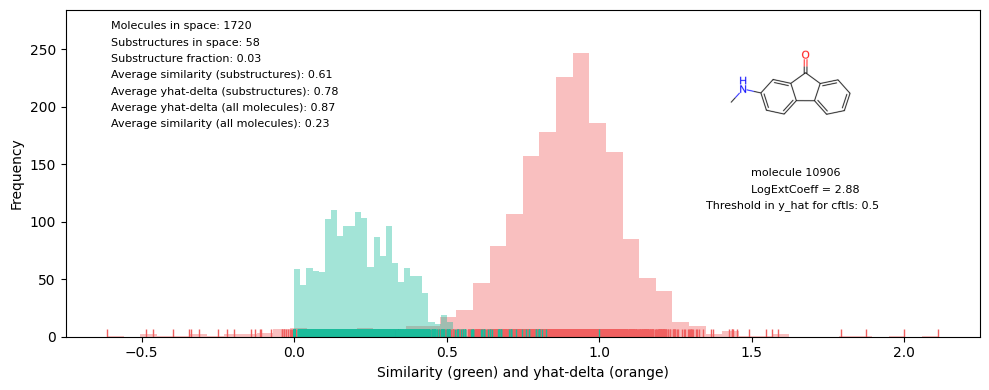

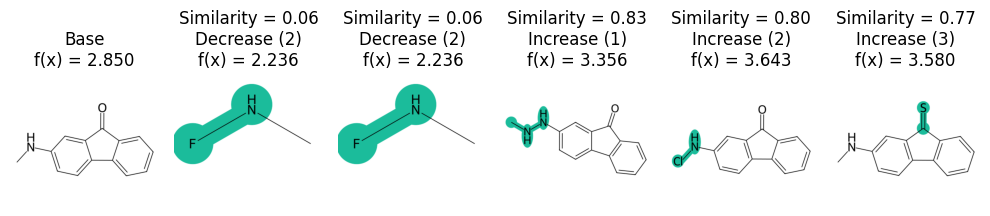

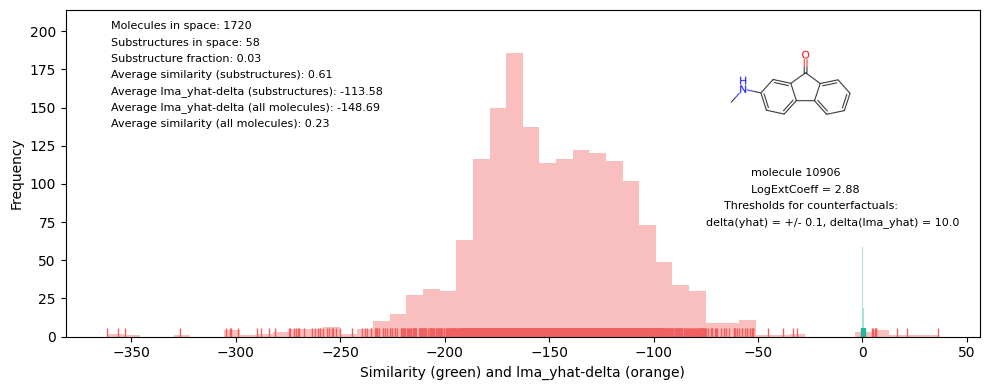

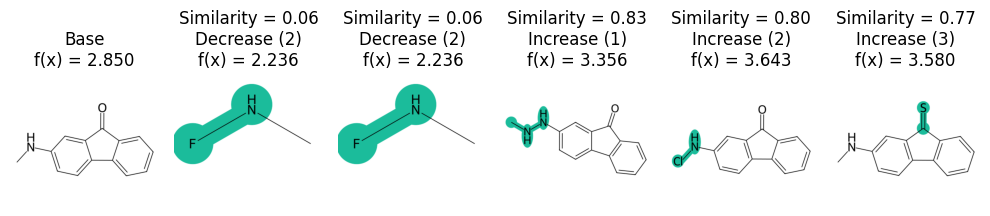

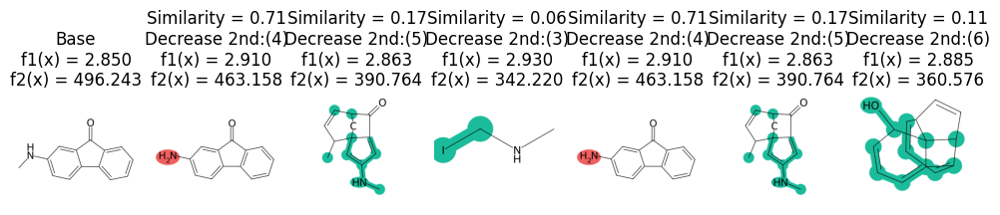

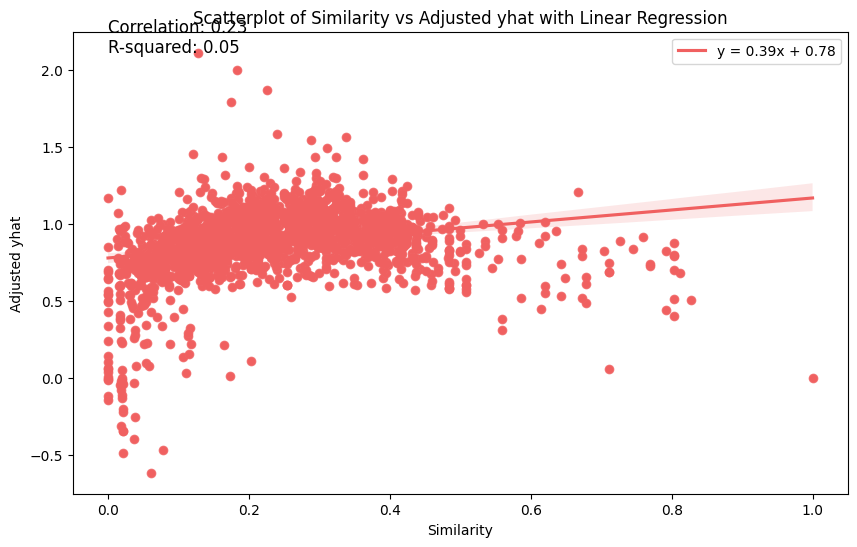

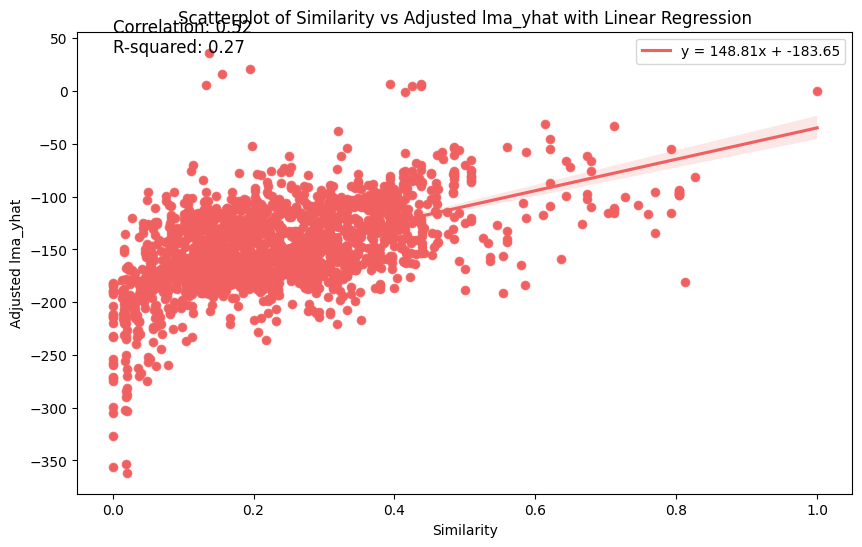

In [ ]:
test_df_10906_2_2000 = second_property_diagnostics(space_LogExtCoeff_10906_2_2000_5_04_2023, space_LogExtCoeff_10906_2_2000_5_04_2023_df, space_LogExtCoeff_10906_2_2000_5_04_2023_labels_lma, smarts, LogExtCoeff_10906, 10906, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st=6, nmols2nd=6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

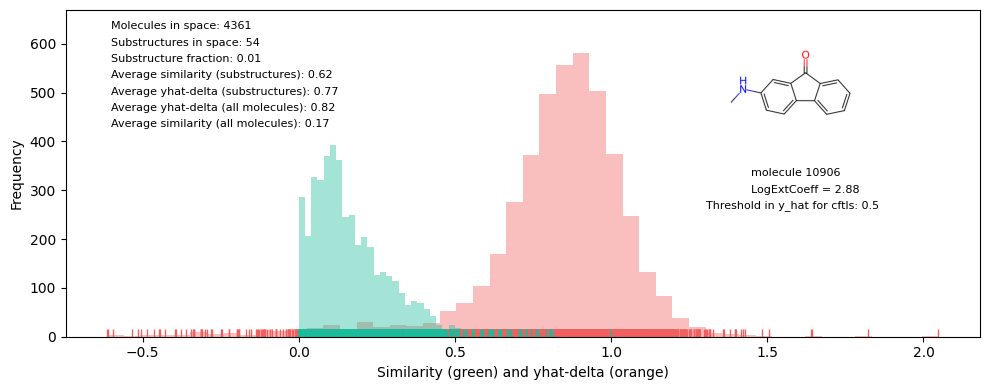

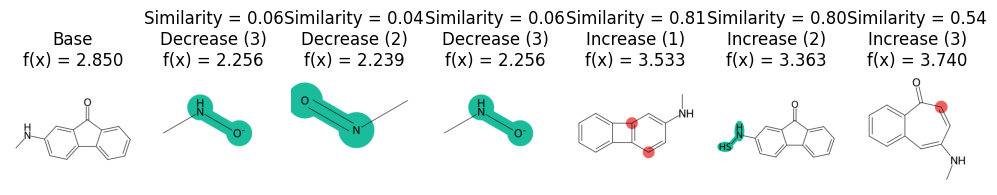

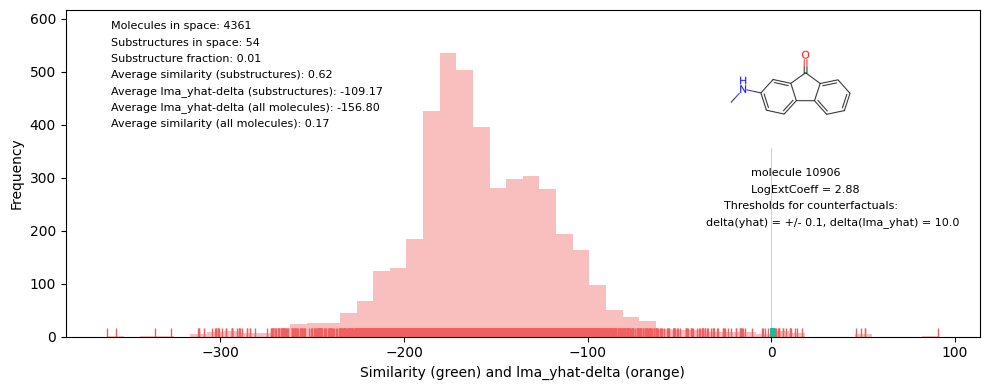

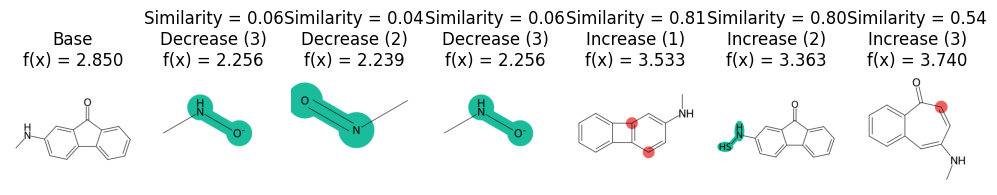

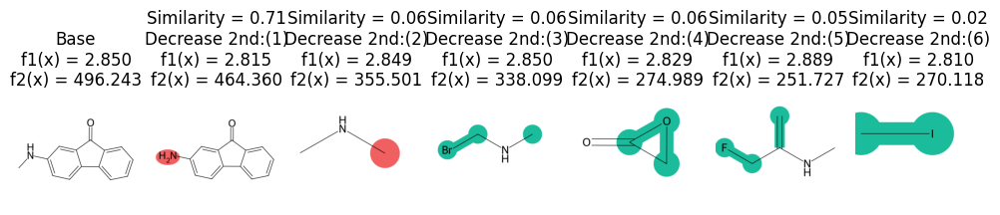

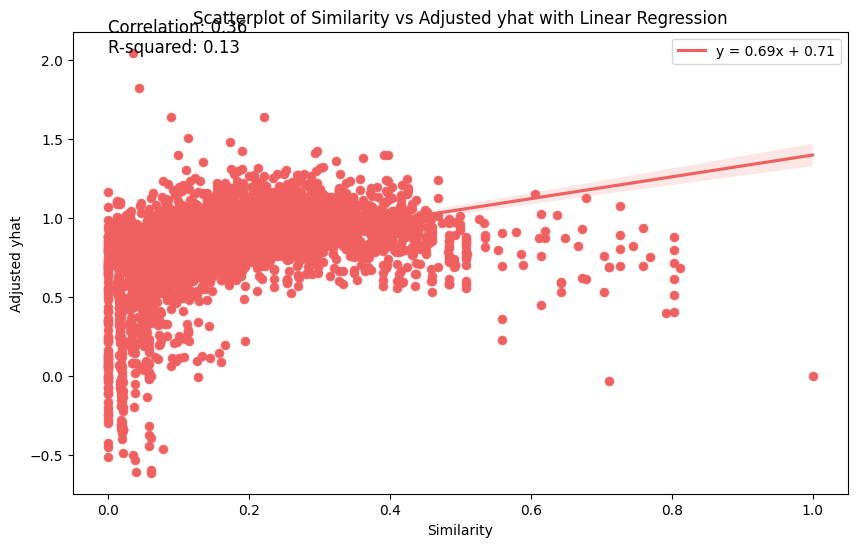

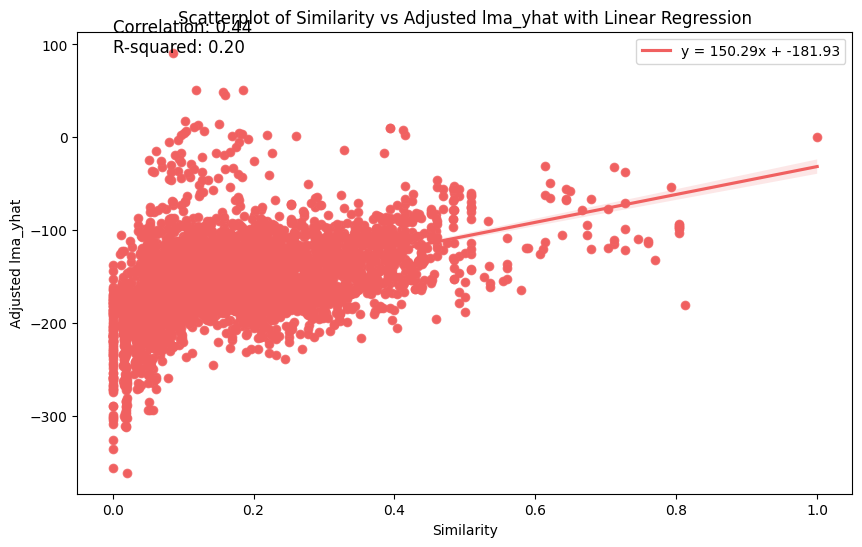

In [ ]:
test_df_10906_5_5000 = second_property_diagnostics(space_LogExtCoeff_10906_5_5000_5_04_2023, space_LogExtCoeff_10906_5_5000_5_04_2023_df, space_LogExtCoeff_10906_5_5000_5_04_2023_labels_lma, smarts, LogExtCoeff_10906, 10906, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st=6, nmols2nd=6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

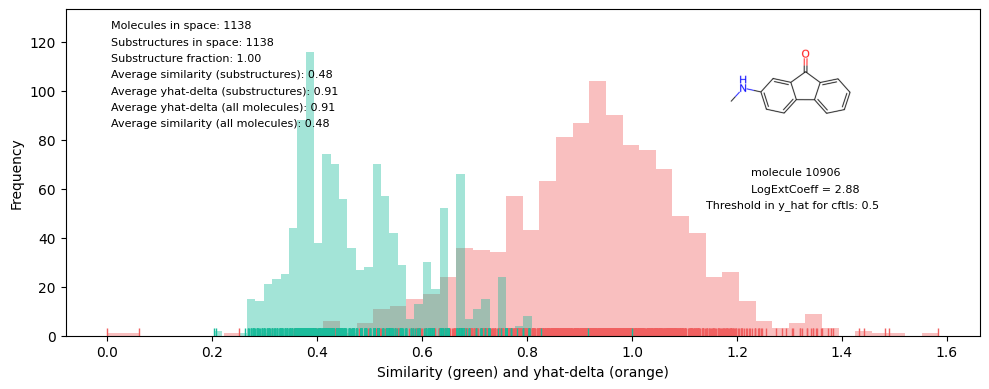

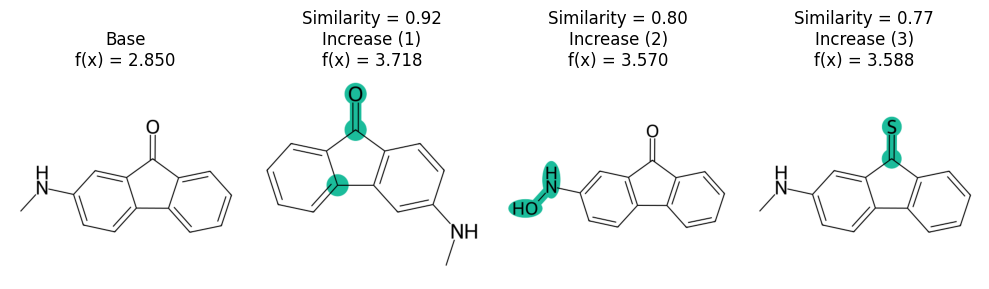

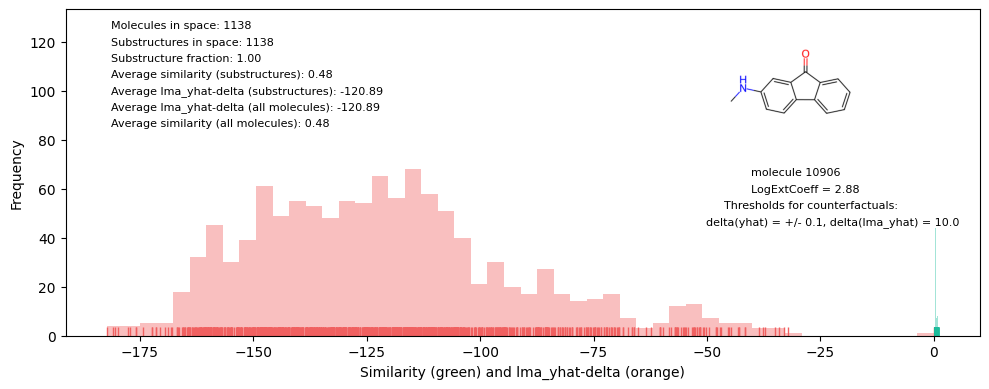

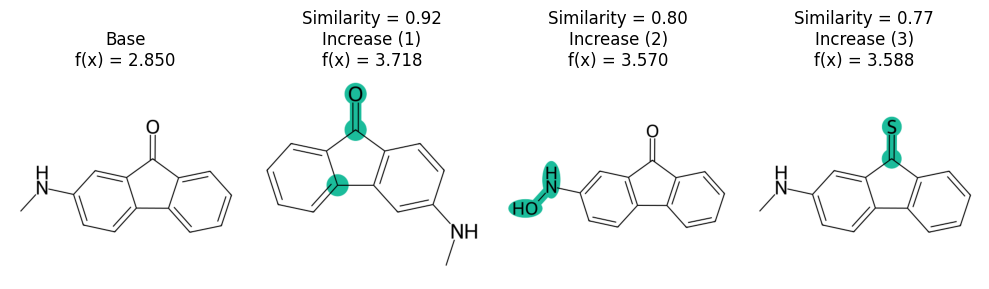

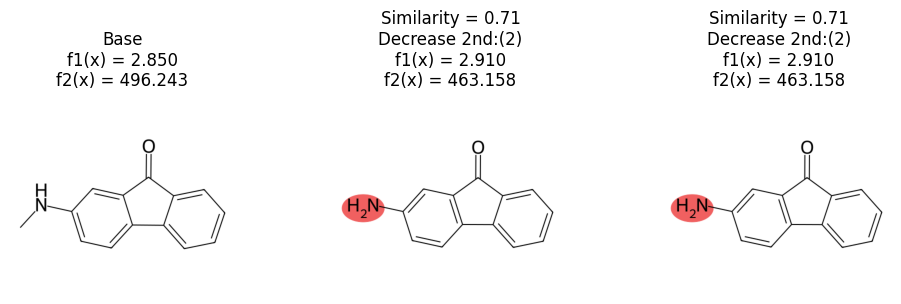

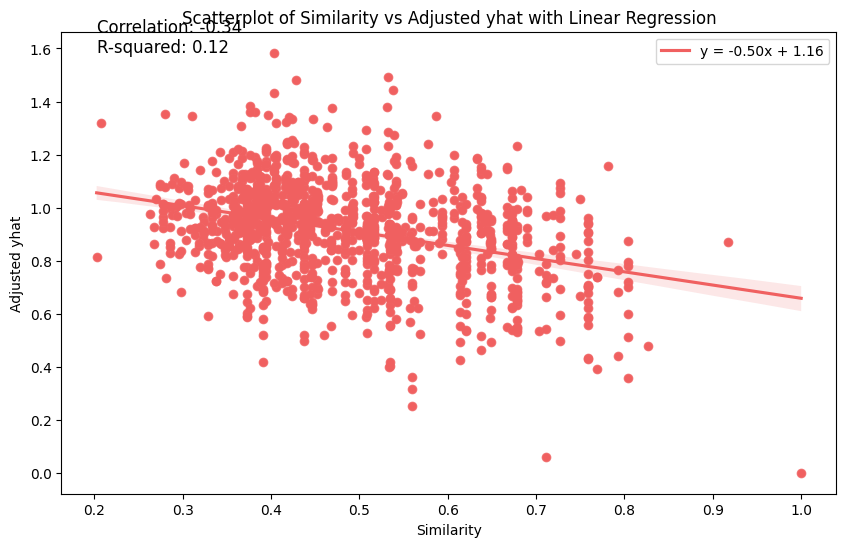

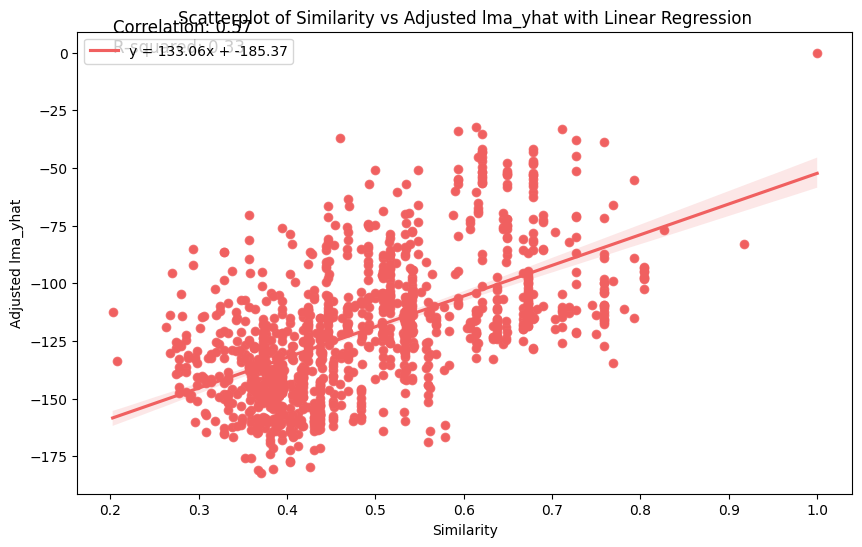

In [ ]:
test_df_10906_5_5000_subs = second_property_diagnostics(space_LogExtCoeff_10906_5_5000_5_04_2023_subs, space_LogExtCoeff_10906_5_5000_5_04_2023_df_subs, space_LogExtCoeff_10906_5_5000_5_04_2023_labels_lma_subs, smarts, LogExtCoeff_10906, 10906, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st=6, nmols2nd=6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

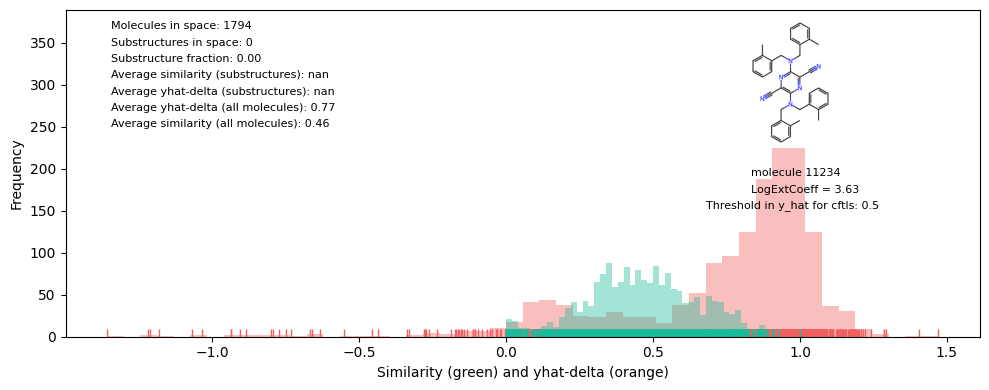

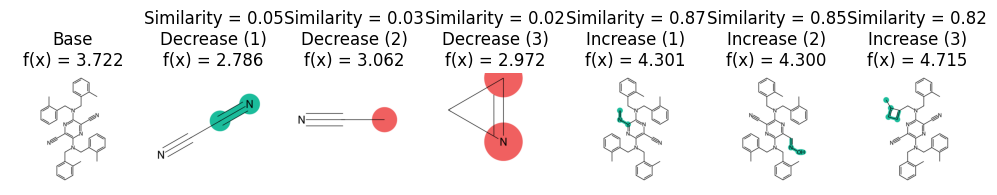

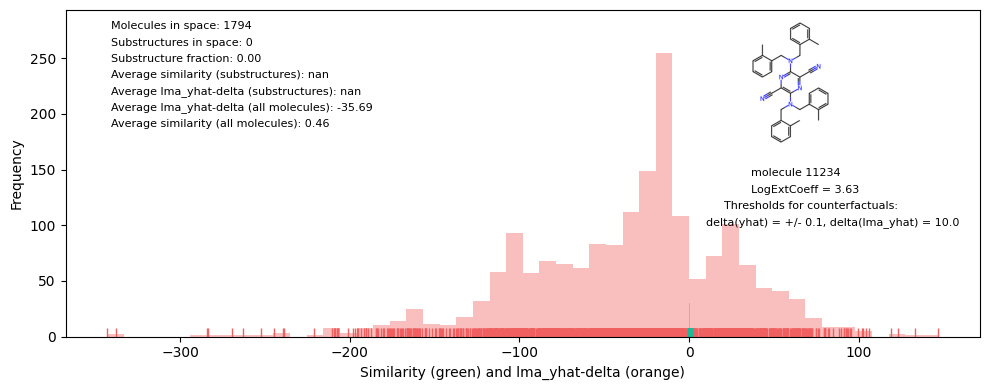

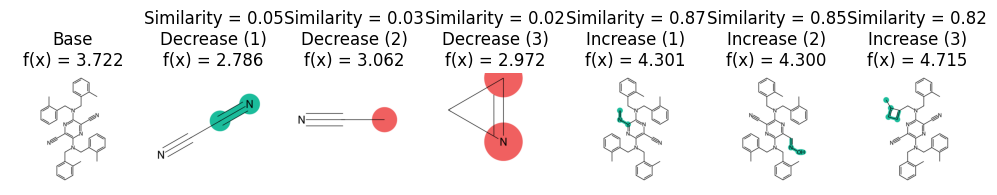

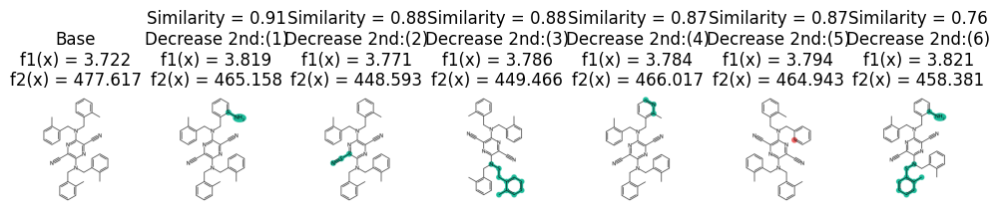

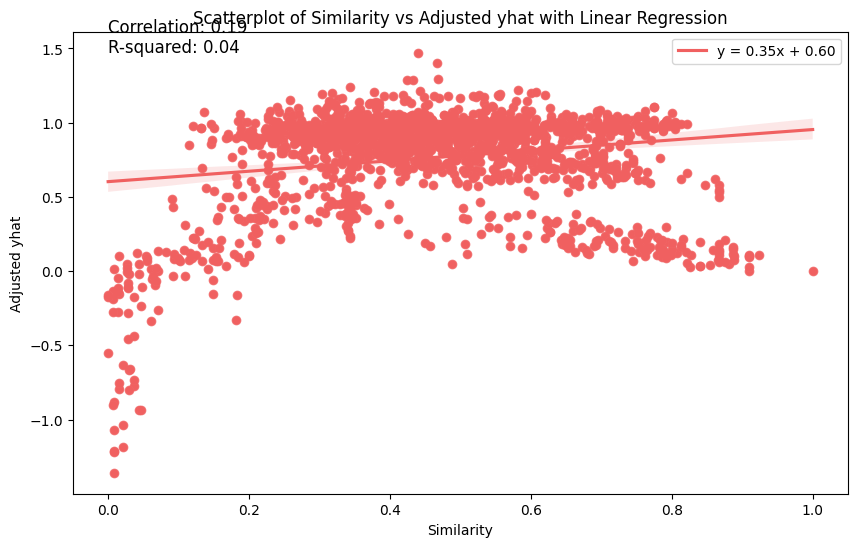

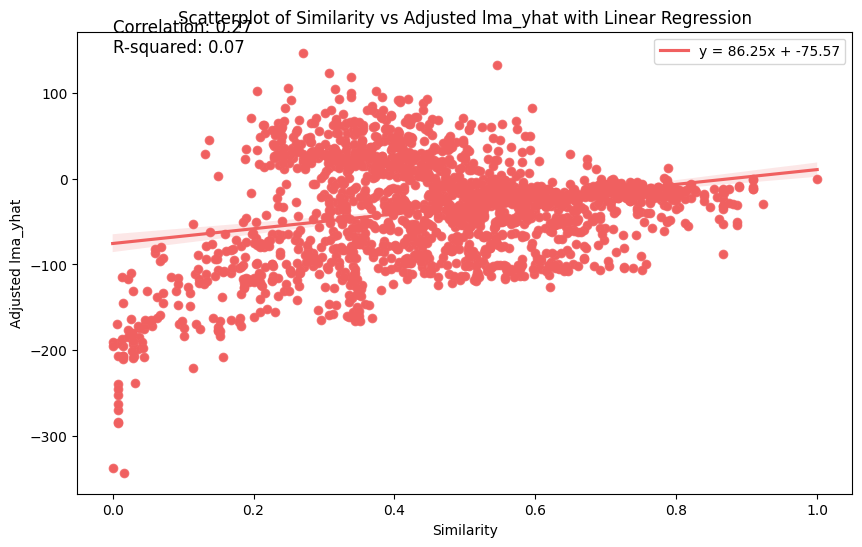

In [ ]:
test_df_11234_2_2000 = second_property_diagnostics(space_LogExtCoeff_11234_2_2000_5_04_2023, space_LogExtCoeff_11234_2_2000_5_04_2023_df, space_LogExtCoeff_11234_2_2000_5_04_2023_labels_lma, smarts, LogExtCoeff_11234, 11234, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st=6, nmols2nd=6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

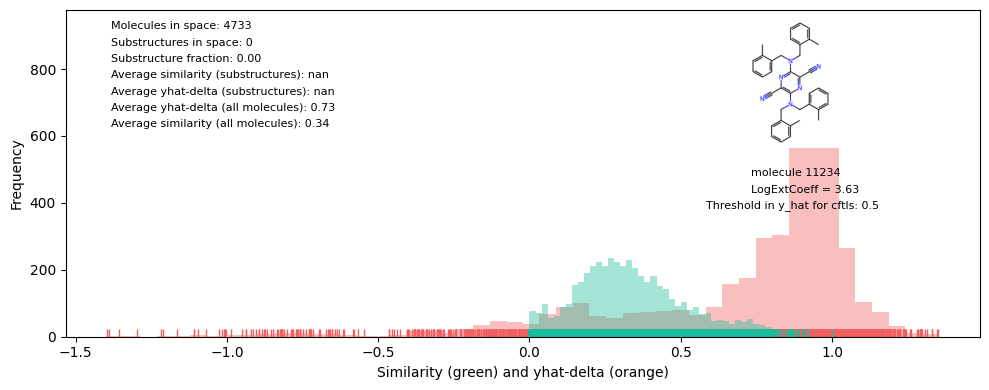

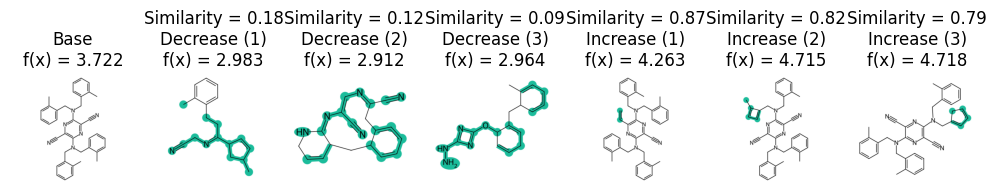

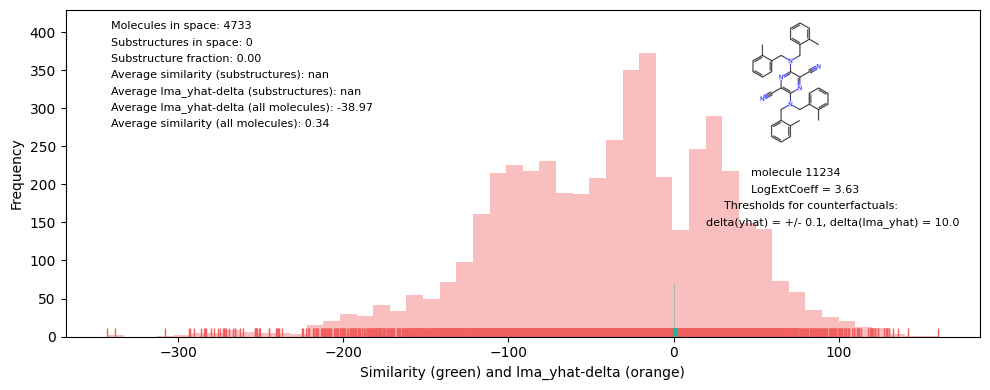

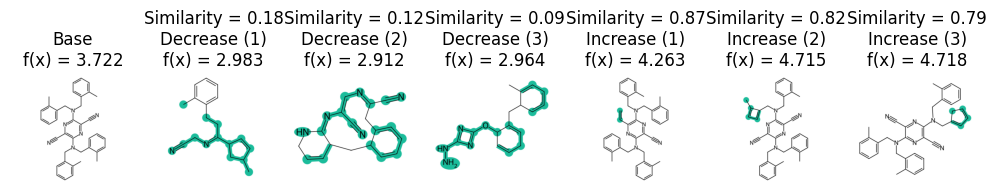

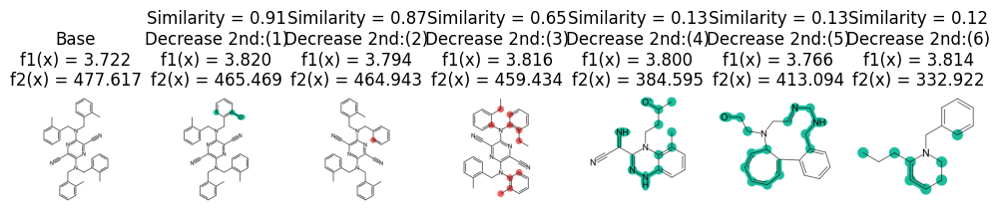

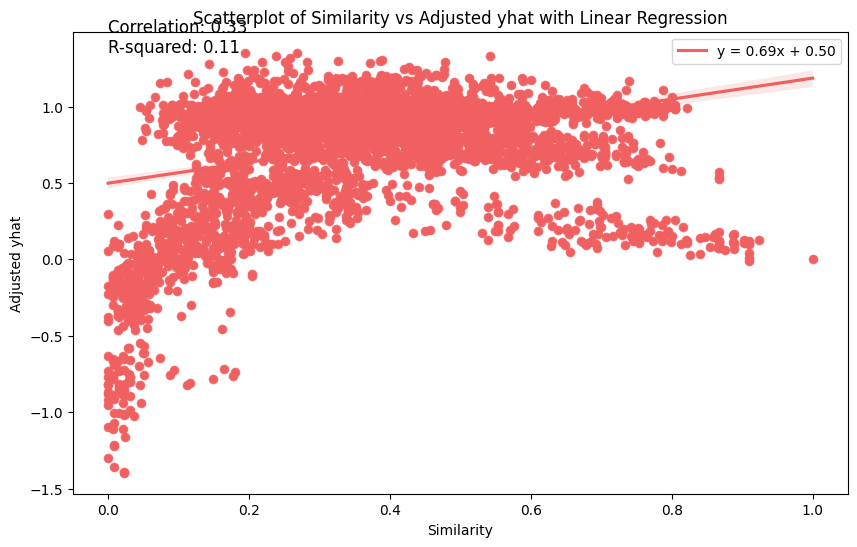

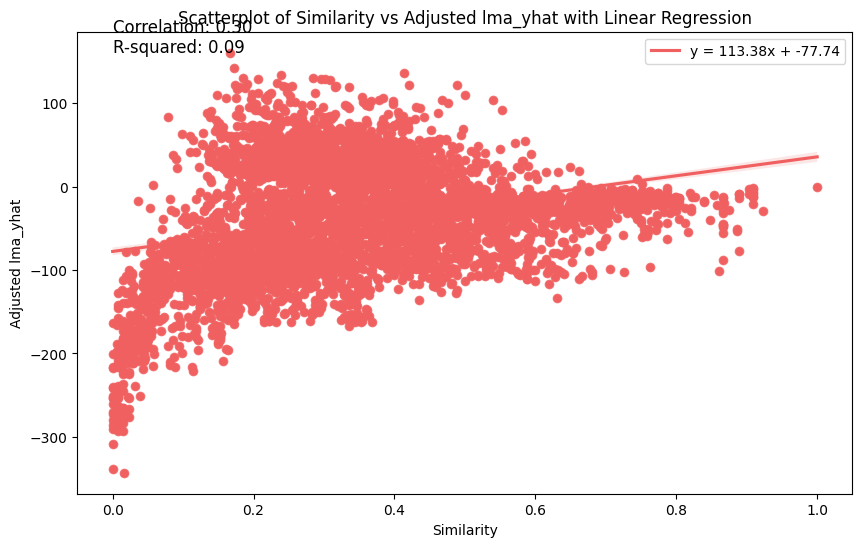

In [ ]:
test_df_11234_5_5000 = second_property_diagnostics(space_LogExtCoeff_11234_5_5000_5_04_2023, space_LogExtCoeff_11234_5_5000_5_04_2023_df, space_LogExtCoeff_11234_5_5000_5_04_2023_labels_lma, smarts, LogExtCoeff_11234, 11234, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st=6, nmols2nd=6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

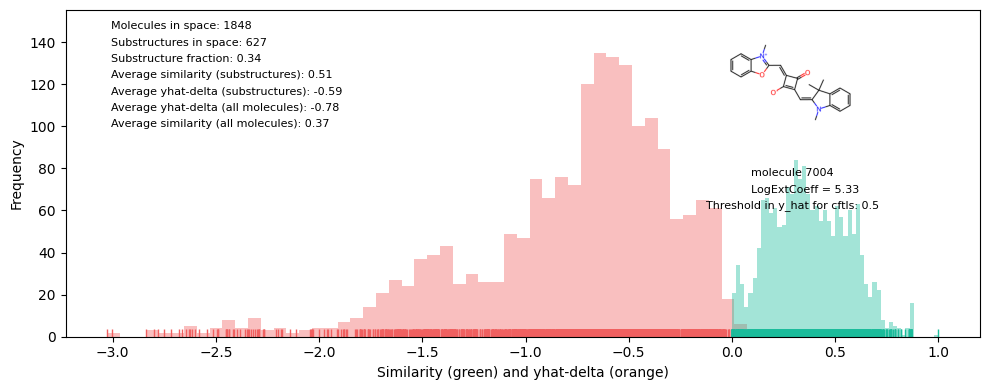

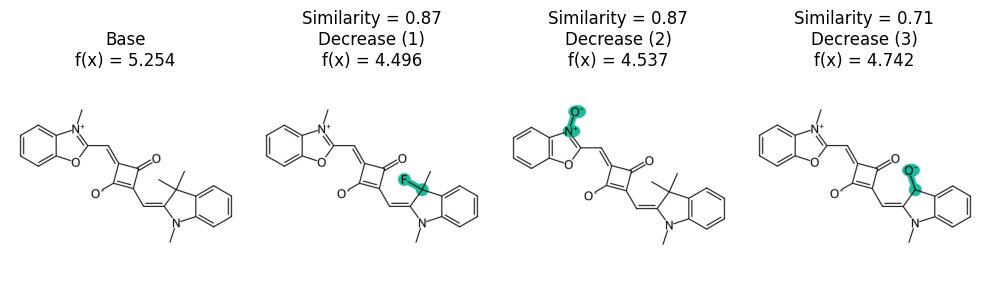

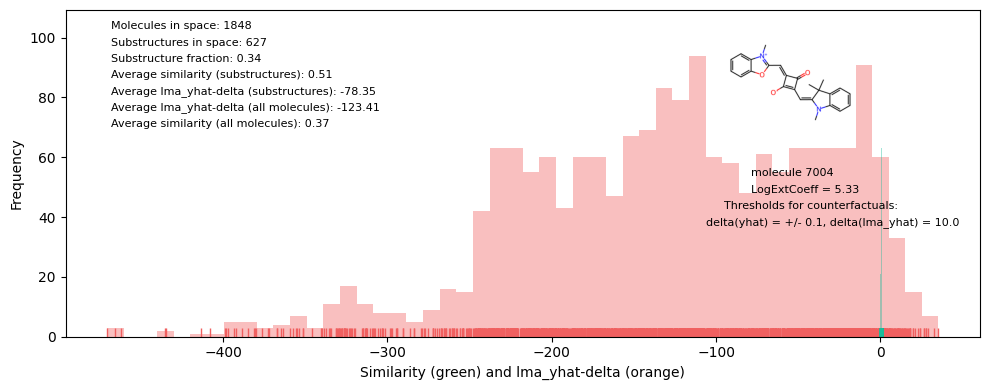

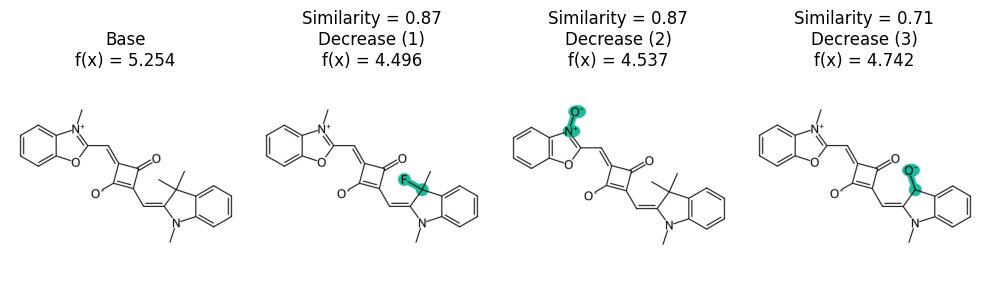

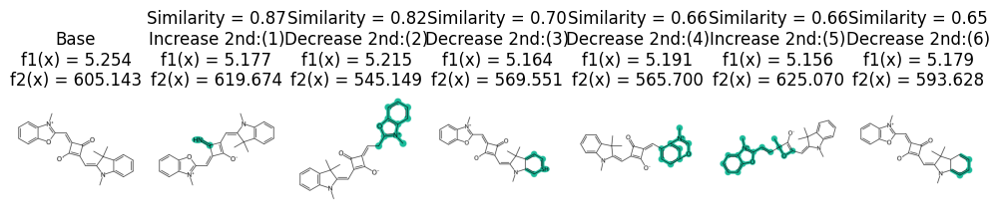

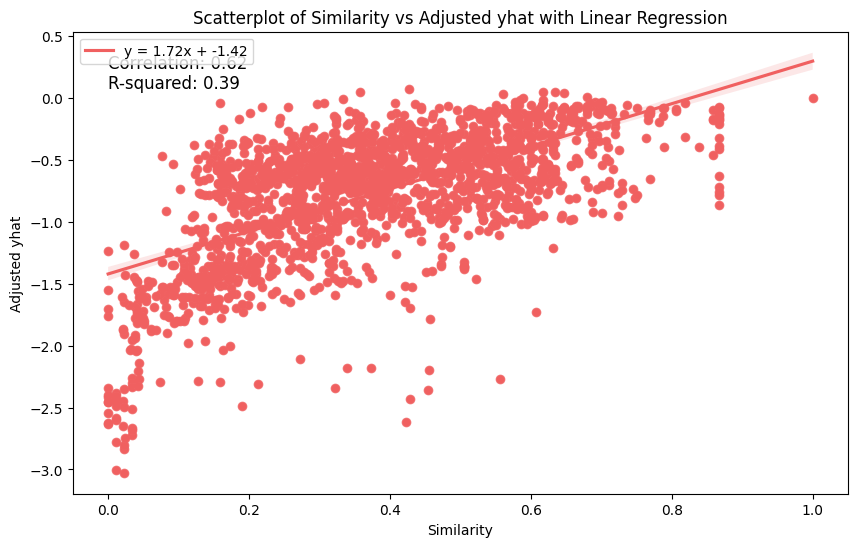

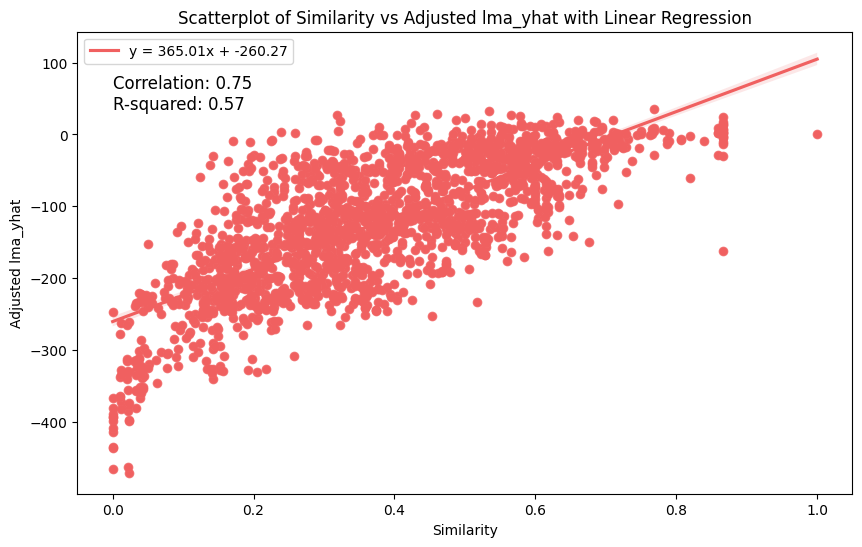

In [ ]:
test_df_7004_2_2000 = second_property_diagnostics(space_LogExtCoeff_7004_2_2000_5_04_2023, space_LogExtCoeff_7004_2_2000_5_04_2023_df, space_LogExtCoeff_7004_2_2000_5_04_2023_labels_lma, squaraine_smarts, LogExtCoeff_7004, 7004, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st=6, nmols2nd=6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

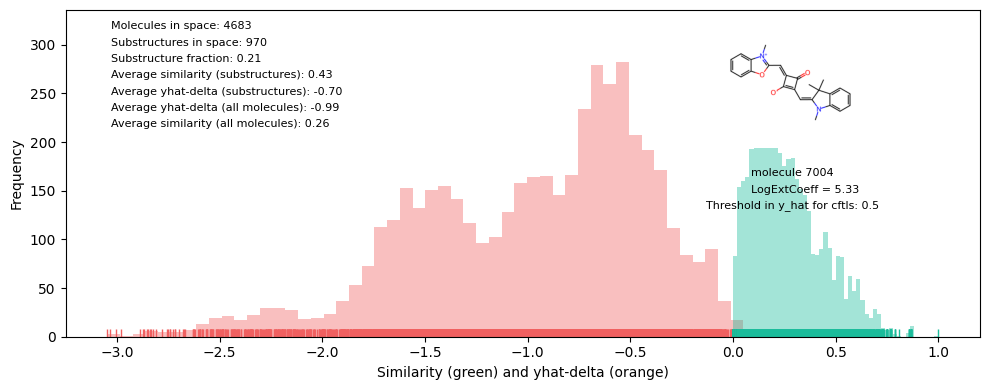

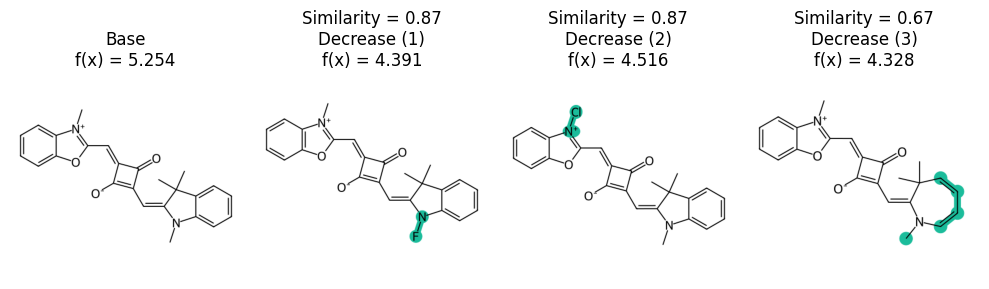

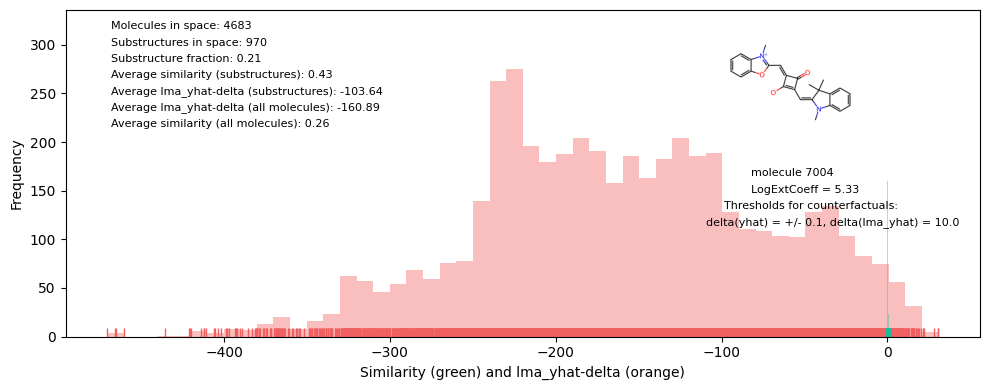

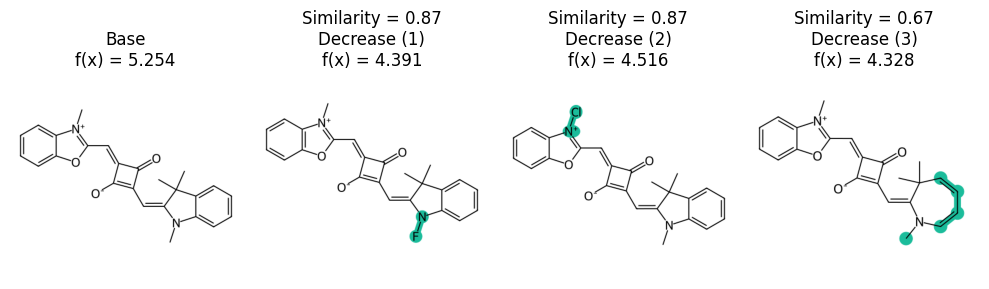

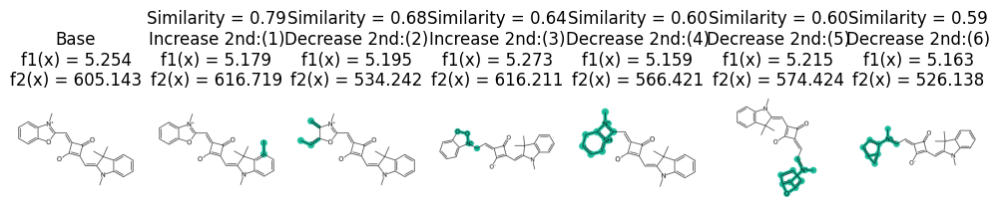

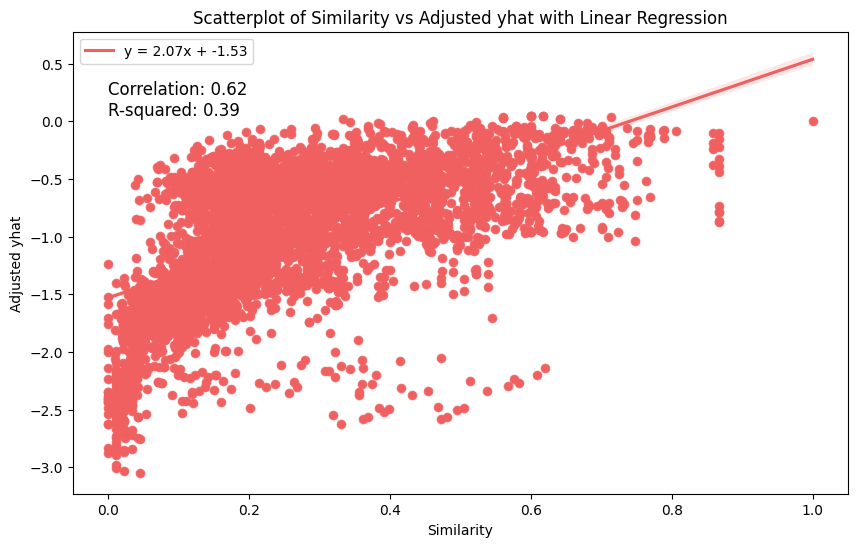

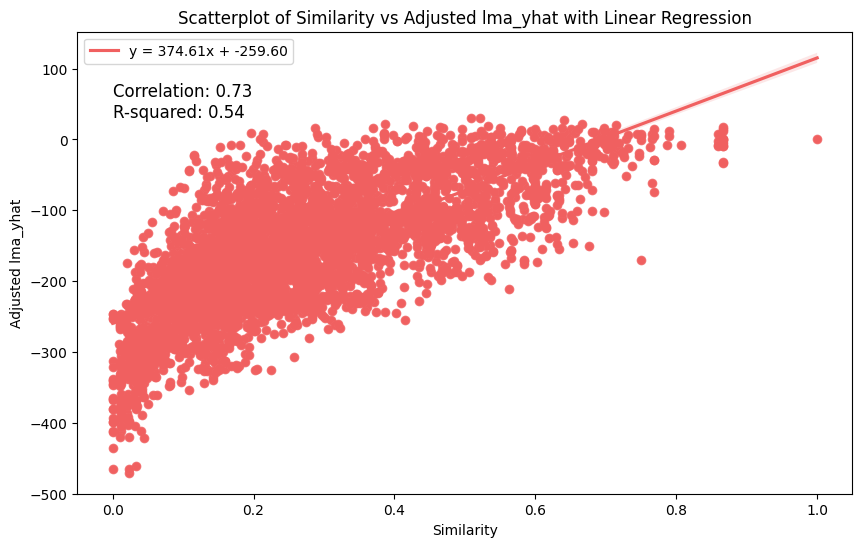

In [ ]:
test_df_7004_5_5000 = second_property_diagnostics(space_LogExtCoeff_7004_5_5000_5_04_2023, space_LogExtCoeff_7004_5_5000_5_04_2023_df, space_LogExtCoeff_7004_5_5000_5_04_2023_labels_lma, squaraine_smarts, LogExtCoeff_7004, 7004, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st=6, nmols2nd=6)


/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.9/site-packages/seaborn/distr

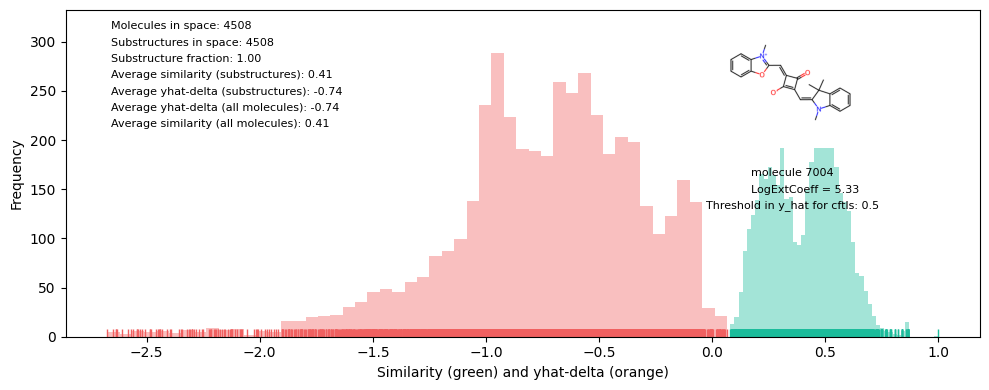

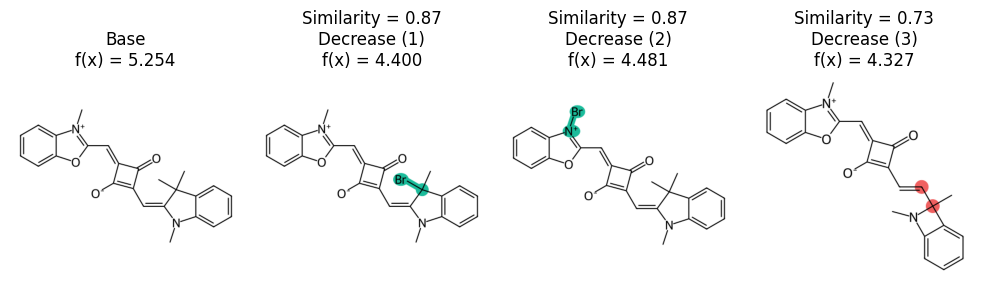

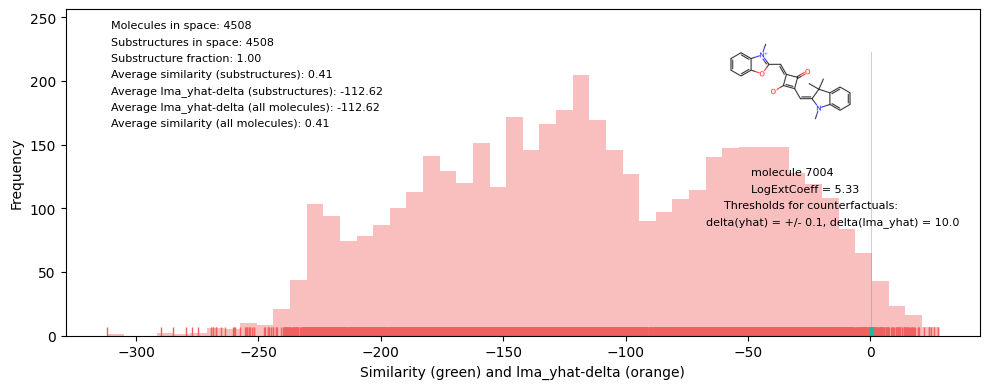

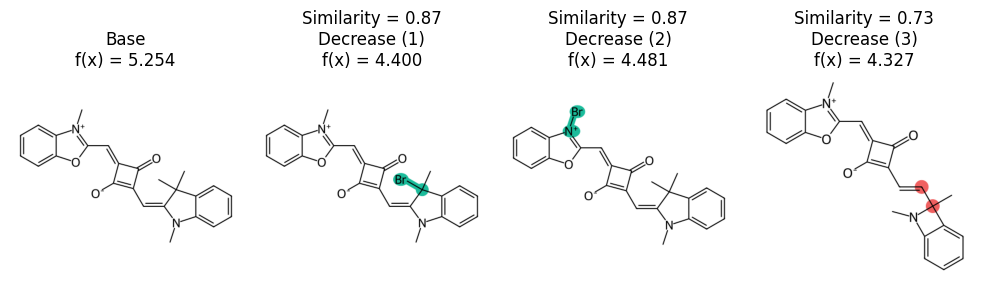

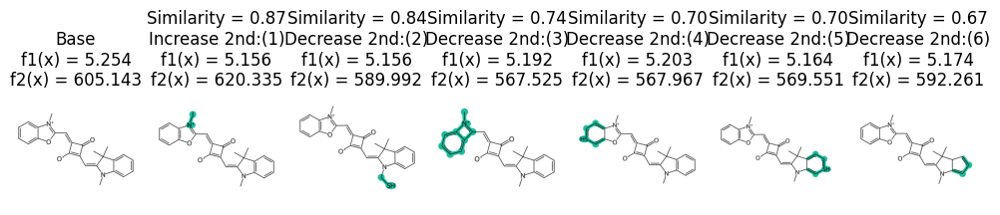

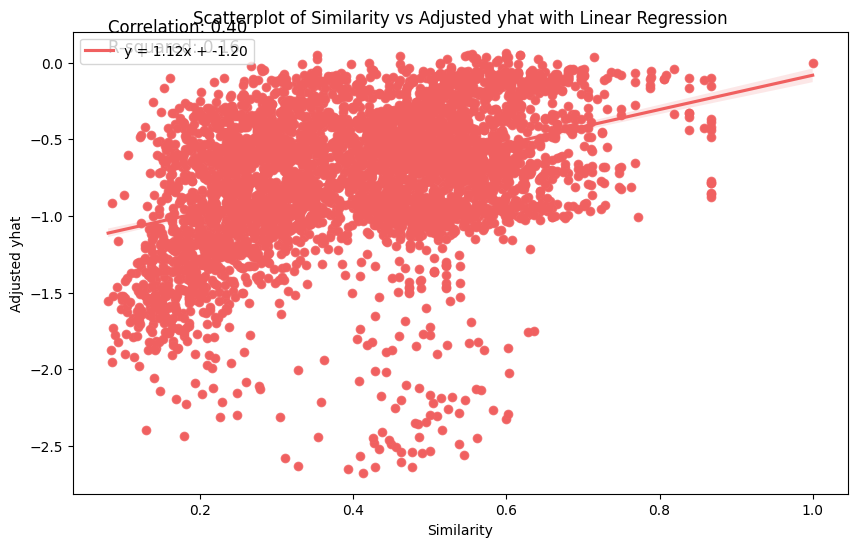

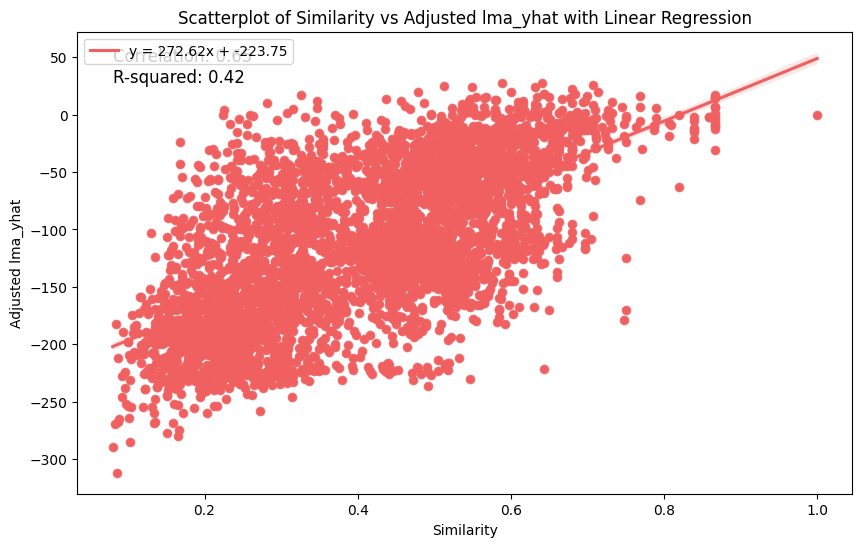

In [ ]:
# need to split these up into separate cells

test_df_7004_5_5000_subs = second_property_diagnostics(space_LogExtCoeff_7004_5_5000_5_04_2023_subs, space_LogExtCoeff_7004_5_5000_5_04_2023_df_subs, space_LogExtCoeff_7004_5_5000_5_04_2023_labels_lma_subs, squaraine_smarts, LogExtCoeff_7004, 7004, rcf_delta=0.5, rcf_delta_first_property = 0.1, rcf_delta_second_property=10, nmols1st=6, nmols2nd=6)


## OLD STUFF perhaps still valuable but not the focus here.

In [ ]:
print asvf

In [ ]:
space_LogExtCoeff_39_5_5000_4_18_2023_new_stoned_df.head()

In [ ]:
space_LogExtCoeff_10906_2_2000_3_30_2023_df = diagnostics(space_LogExtCoeff_10906_2_2000_3_30_2023, smarts, LogExtCoeff_10906, 10906, 1.0)

In [ ]:
space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned_df = diagnostics(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned, smarts, LogExtCoeff_10906, 10906, 1.0)

In [ ]:
space_LogExtCoeff_23_2_2000_3_18_2023_df = diagnostics(space_LogExtCoeff_23_2_2000_3_18_2023, smarts, LogExtCoeff_23, 23, 1.0)

In [ ]:
space_LogExtCoeff_23_2_2000_3_19_2023_df = diagnostics(space_LogExtCoeff_23_2_2000_3_19_2023, smarts, LogExtCoeff_23, 23, 0.5)

In [ ]:
space_LogExtCoeff_23_5_5000_4_18_2023_df = diagnostics(space_LogExtCoeff_23_5_5000_4_18_2023_new_stoned, smarts, LogExtCoeff_23, 23, 0.5)

In [ ]:
space_LogExtCoeff_84_2_2000_3_18_2023_df = diagnostics(space_LogExtCoeff_84_2_2000_3_18_2023, smarts, LogExtCoeff_84, 84, 1.0)

In [ ]:
space_LogExtCoeff_84_2_2000_3_19_2023_df = diagnostics(space_LogExtCoeff_84_2_2000_3_19_2023, smarts, LogExtCoeff_84, 84, 1.0)

In [ ]:
space_LogExtCoeff_180_2_2000_3_30_2023_df = diagnostics(space_LogExtCoeff_180_2_2000_3_30_2023, smarts,LogExtCoeff_180, 180, 0.9)

In [ ]:
space_LogExtCoeff_180_2_2000_4_3_2023_new_stoned_df = diagnostics(space_LogExtCoeff_180_2_2000_4_3_2023_new_stoned, smarts, LogExtCoeff_180, 180, 0.9)

In [ ]:
space_LogExtCoeff_6652_2_2000_3_30_2023_df = diagnostics(space_LogExtCoeff_6652_2_2000_3_30_2023, smarts,LogExtCoeff_6652, 6652, 1.1)

In [ ]:
space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned_df = diagnostics(space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned, smarts, LogExtCoeff_6652, 6652, 1.1)

In [ ]:
space_LogExtCoeff_11234_2_2000_3_18_2023_df = diagnostics(space_LogExtCoeff_11234_2_2000_3_18_2023, smarts, LogExtCoeff_11234, 11234, 0.5)

In [ ]:
space_LogExtCoeff_11234_2_2000_3_19_2023_df = diagnostics(space_LogExtCoeff_11234_2_2000_3_19_2023, smarts, LogExtCoeff_11234, 11234)

In [ ]:
space_LogExtCoeff_11234_2_2000_3_17_2023_df = diagnostics(space_LogExtCoeff_11234_2_2000_3_17_2023, smarts, LogExtCoeff_11234, 11234, 0.5)

In [ ]:
space_LogExtCspace_LogExtCoeff_7004_5_5000_4_17_2023_new_stoned_df = diagnostics(space_LogExtCoeff_7004_5_5000_4_17_2023_new_stoned, sq_smarts, LogExtCoeff_7004, 7004, 1.0)

## Let's Try synspace with a small molecule<br>
Does it need stoned to work?
How is this done?


In [ ]:
# Note that we are currently using a substructure preserver, as a default setting in exmol?

stoned_kwargs_synspace = {}
#     "num_samples": 5000,
#     "alphabet": exmol.get_basic_alphabet(),
#     "max_mutations": 5,
#     "preset": "synspace",
# }

In [ ]:
# def load_existing_synspace(space_filename: str, base_number: int, substructure_smarts: str = None, retro: int=1, forward: int=1):
#     """Load an existing space from a pickle file, or create a new one if the file does not exist."""
 
#     try:
#         loaded_space = space_pickle_load(space_filename)
#     except FileNotFoundError as e:
#         smi = optdata_LogExtCoeff.Chromophore[base_number]
#         loaded_space = exmol.sample_space(smi, model_eval, preset="synspace", stoned_kwargs=stoned_kwargs_synspace, quiet=False,
#                                         #    substructure_smarts=substructure_smarts,
#                                              retro=retro, forward=forward)
#         with open(space_filename, "wb") as fp:   #Pickling
#             pickle.dump(loaded_space, fp)
#     return loaded_space

def load_existing_synspace(space_filename: str, base_number: int, substructure_smarts: str = None, retro: int = 1, forward: int = 1, num_samples: int = 1000):
    """Load an existing space from a pickle file, or create a new one if the file does not exist."""
    try:
        loaded_space = space_pickle_load(space_filename)
    except FileNotFoundError as e:
        smi = optdata_LogExtCoeff.Chromophore[base_number]
        stoned_kwargs_synspace = {
            "preset": "synspace",
            "retro": retro,
            "forward": forward,
        }
        loaded_space = exmol.sample_space(smi, model_eval, preset = "synspace", num_samples=num_samples, quiet=False, retro = retro, forward = forward)
        with open(space_filename, "wb") as fp:   # Pickling
            pickle.dump(loaded_space, fp)
    return loaded_space

#note that if stoned_kwargs is defined, the program defaults to "run_stoned", which is not what is required by definition with synspace

def load_existing_synspace_with_features(space_filename: str, base_number: int, substructure_smarts: str = None, retro: int = 1, forward: int = 1, num_samples: int = 1000):
    """Load an existing space from a pickle file, or create a new one if the file does not exist."""
    try:
        loaded_space = space_pickle_load(space_filename)
    except FileNotFoundError as e:
        smi = optdata_LogExtCoeff.Chromophore[base_number]
        stoned_kwargs_synspace = {
            "preset": "synspace",
            "retro": retro,
            "forward": forward,
        }
        loaded_space = exmol.sample_space(smi, model_eval, preset = "synspace", num_samples=num_samples, quiet=False, retro = retro, forward = forward)
        with open(space_filename, "wb") as fp:   # Pickling
            pickle.dump(loaded_space, fp)
    return loaded_space



Still need to try the approach with features return with Synspace

In [ ]:
space_LogExtCoeff_6652_synspace = load_existing_synspace("space_LogExtCoeff_6652_synspace", 6652, retro=1, forward=3)
space_LogExtCoeff_6652_5000_synspace = load_existing_synspace("space_LogExtCoeff_6652_5000_synspace", 6652, retro=1, forward=3, num_samples=5000)
# note that substructure smarts doesn't do anything here because sample_space in exmol calls the synspace program which
# performs a series of retrosynthesis and forward synthesis steps to generate new molecules,
# and it filters and sorts the results based on specific properties and criteria.

In [ ]:
space_LogExtCoeff_6652_synspace_df = diagnostics(space_LogExtCoeff_6652_synspace, smarts, LogExtCoeff_6652, 6652, 1.0)

In [ ]:
space_LogExtCoeff_6652_5000_synspace_df = diagnostics(space_LogExtCoeff_6652_5000_synspace, smarts, LogExtCoeff_6652, 6652, 0.5)

## other stuff

In [ ]:
# build df of all molecules in space and their yhat values and their similarities to the original molecule
space_LogExtCoeff_23_2_2000_3_19_2023_df = pd.DataFrame(columns = ['Chromophore', 'yhat_LogExtCoeff', 'Similarity'])
for i in range(len(space_LogExtCoeff_23_2_2000_3_19_2023)):
    space_LogExtCoeff_23_2_2000_3_19_2023_df.loc[i] = [space_LogExtCoeff_23_2_2000_3_19_2023[i].smiles, 
                                                       space_LogExtCoeff_23_2_2000_3_19_2023[i].yhat,
                                                        space_LogExtCoeff_23_2_2000_3_19_2023[i].similarity]
# append a column with rdKit mol objects
space_LogExtCoeff_23_2_2000_3_19_2023_df['mol'] = space_LogExtCoeff_23_2_2000_3_19_2023_df.Chromophore.apply(rdkit.Chem.MolFromSmiles)
# sort by LogExtCoeff all molecules with >0.5 similarity to the original molecule
space_LogExtCoeff_23_2_2000_3_19_2023_df = space_LogExtCoeff_23_2_2000_3_19_2023_df[space_LogExtCoeff_23_2_2000_3_19_2023_df.Similarity > 0.5]
space_LogExtCoeff_23_2_2000_3_19_2023_df = space_LogExtCoeff_23_2_2000_3_19_2023_df.sort_values(by = 'yhat_LogExtCoeff', ascending = True)
space_LogExtCoeff_23_2_2000_3_19_2023_df.head(50)

In [ ]:
def draw_most_similar(df):
    # sort df by similarity, highest to lowest
    df = df.sort_values(by = 'similarity', ascending = True)
    # draw the 50 most similar molecules using rdkit
    legends = [f"yhat: {yhat:0.2f}\nsimilarity: {similarity:0.2f}" for yhat, similarity in zip(df.yhat[:50], df.similarity[:50])]
    img = Draw.MolsToGridImage(df.mol[:50], molsPerRow=10, subImgSize=(200, 200), legends=legends)
    return img

space_LogExtCoeff_6652_synspace_img = draw_most_similar(space_LogExtCoeff_6652_synspace_df)
display(space_LogExtCoeff_6652_synspace_img)


In [ ]:
print (space_LogExtCoeff_23_2_2000_3_19_2023_df.Chromophore[10])
# draw the molecule
mol = space_LogExtCoeff_23_2_2000_3_19_2023_df.mol[10]
mol

In [ ]:
print (space_LogExtCoeff_23_2_2000_3_19_2023_df.Chromophore[710])
# draw the molecule
mol = space_LogExtCoeff_23_2_2000_3_19_2023_df.mol[710]
mol

In [ ]:
print (space_LogExtCoeff_23_2_2000_3_19_2023_df.Chromophore[336])
# draw the molecule
mol = space_LogExtCoeff_23_2_2000_3_19_2023_df.mol[336]
mol

## Get Counterfactuals (Squaraine)

In [ ]:
exps = exmol.rcf_explain(space_LogExtCoeff_7004_5_5000_4_17_2023_new_stoned, (-1.5, 1), nmols=6)

In [ ]:
fkw = {"figsize": (10, 3)}
exmol.plot_cf(exps, figure_kwargs=fkw, mol_size=(450, 400), nrows=1)
plt.savefig("test1.png", bbox_inches="tight", dpi=180)
svg = exmol.insert_svg(exps, mol_fontsize=16)
with open("Space_LogExtCoeff_23_2_2000_3_19_2023.svg", "w") as f:
    f.write(svg)

In [ ]:
fkw = {"figsize": (10, 4)}
font = {"family": "normal", "weight": "normal", "size": 22}

exmol.plot_space(space_LogExtCoeff_7004_5_5000_4_17_2023_new_stoned, exps, figure_kwargs=fkw, mol_size=(100, 100), offset=1)
ax = plt.gca()
plt.colorbar(
    ax.get_children()[1],
    ax=[ax],
    label="increase in LogExpCoeff from base",
    location="left",
    shrink=0.8,
)
plt.savefig("space_base_6652.png", bbox_inches="tight", dpi=180)
svg = exmol.insert_svg(exps, mol_fontsize=16)
with open("space_base_7004.svg", "w") as f:
    f.write(svg)



## Counterfactuals from Fluorene

In [ ]:
exps = exmol.rcf_explain(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned, (-1.5, 1), nmols=6)

In [ ]:
fkw = {"figsize": (10, 3)}
exmol.plot_cf(exps, figure_kwargs=fkw, mol_size=(450, 400), nrows=1)
plt.savefig("test1.png", bbox_inches="tight", dpi=180)
svg = exmol.insert_svg(exps, mol_fontsize=16)
with open("Space_LogExtCoeff_10906_2_2000_4_3_2023.svg", "w") as f:
    f.write(svg)

In [ ]:
# Note that cf_explain does not apply a threshold for selecting counterfactuals, but rcf_explain does!
# note that exps and cfs are the same here... they represent the counterfactuals. The key difference to be aware of is the regression 
# counterfactual calculation which adds the threshold
cfs = exmol.rcf_explain(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned)
# cfs = exmol.cf_explain(space_base_6652)
exmol.plot_space(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned, cfs, offset = 2)

## Now the fit around the whole space to the local model <br>
Beta here calls the lime_explain function that returns a graph of the t-statistics for the whole fit over the space molecules that are similar enough to the original base that they are counted. The t-statistic is the regression coefficient for each descriptor, divided by the standard error of the regression. Standard error, Sβi , is a ratio of the prediction accuracy to feature variance. Here, prediction accuracy refers to how closely g(~x) approximates f (~x). Finding the t-statistic removes sensitivity coming from units and magnitudes of the features.

In [ ]:
radius = 4
similarity_threshold = -6

In [ ]:
beta, space_features_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned = get_beta(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned, "classic", return_beta = True, return_examples = True, radius = radius, similarity_threshold=similarity_threshold)
plot_parity(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned, beta, similarity_threshold)

In [ ]:
descriptor_type = "expanded_chromophore"
exmol.lime_explain(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned, descriptor_type=descriptor_type)
wls_attr = calc_feature_importance(list(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned[0].descriptors.descriptor_names), list(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned[0].descriptors.tstats))
wls_attr

# x = wls_attr.keys()
# modify code to only take top 10 features of importance
x = list(wls_attr.keys())

xaxis = np.arange(len(x))
x_colors = ["purple" if t in names else "black" for t in x]

rf_imp = {a: b for a, b in zip(names, clf.feature_importances_)}
rf_x = np.zeros(len(x))
rf_y = np.zeros(len(x))
for i, j in enumerate(x):
    if j in rf_imp:
        rf_x[i] = i
        rf_y[i] = rf_imp[j]

width = [wls_attr[i] for i in x]
colors = ["#F06060" if i < 0 else "#1BBC9B" for i in width]

top_n = 14  # number of top features to plot
fig, ax = plt.subplots(figsize=(6, 5))
ax.barh(xaxis[:top_n] + 0.2, width[:top_n], 0.75, label="WLS", color=colors[:top_n])

plt.xticks(fontsize=12)
plt.xlabel("Feature t-statistics", fontsize=12)
plt.yticks(xaxis[:top_n], x[:top_n], fontsize=12)
[t.set_color(i) for (i, t) in zip(x_colors, ax.yaxis.get_ticklabels())]
plt.gca().invert_yaxis()
plt.title("Random Forest Regression", fontsize=12)


# fig, ax = plt.subplots(figsize=(6, 5))
# ax.barh(xaxis + 0.2, width, 0.75, label="WLS", color=colors)

# plt.xticks(fontsize=12)
# plt.xlabel("Feature t-statistics", fontsize=12)
# plt.yticks(xaxis, x, fontsize=12)
# [t.set_color(i) for (i, t) in zip(x_colors, ax.yaxis.get_ticklabels())]
# plt.gca().invert_yaxis()
# plt.title("Random Forest Regression", fontsize=12)


In [ ]:
print (type(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned))
# print (space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned[0])

## Calculate Chromophore Descriptors (tests before modifying exmol)

In [ ]:
def _calculate_chromophore_descriptors_local(space):
    
    # The following are imported above but need to make sure that if other features are added we import the appropriate calculators
    # import mordred, mordred.descriptors
    # from mordred import HydrogenBond, Polarizability
    # from mordred import SLogP, AcidBase, BertzCT, Aromatic, BondCount, AtomCount
    # from mordred import Calculator

    calc_lime = Calculator()
    calc_lime.register([Aromatic.AromaticBondsCount, Aromatic.AromaticAtomsCount,
    AtomCount.AtomCount("F"), AtomCount.AtomCount("Cl"), AtomCount.AtomCount("O"),
     AtomCount.AtomCount("S"), AtomCount.AtomCount("N"), AtomCount.AtomCount("Bridgehead"),
     AtomCount.AtomCount("Spiro"), AtomCount.AtomCount("X"), AtomCount.AtomCount("HeavyAtom"),
     AtomCount.AtomCount("Q"), AtomCount.AtomCount("P"),Polarizability.APol])
    
    # convert space to pandas dataframe
    space_df = pd.DataFrame(space)
    # append column of mols to dataframe
    space_df["mol"] = space_df["smiles"].apply(rdkit.Chem.MolFromSmiles)
    d = calc_lime.pandas(space_df.mol, nproc=8, quiet=False)
    # convert to tuple
    # d = tuple(d.values[0])
    # d = c.CalcDescriptors(mol)
    return d

In [ ]:
#load "mordred_feature_list_from_excel.csv" to pandas dataframe
mordred_feature_list_df = pd.read_csv("mordred_feature_list_from_excel.csv")
mordred_feature_list_df.head()

In [ ]:
# Extract feature list of strings to tuple
names_of_new_features = tuple(mordred_feature_list_df["name"].values)
print(names_of_new_features)


In [ ]:
# Extract feature names to tuple
symbols_new_features = tuple(mordred_feature_list_df["feature"].values)
print(symbols_new_features)


In [ ]:
from mordred import Weight, WienerIndex, ZagrebIndex, TopologicalIndex, TopologicalCharge, RotatableBond, RingCount
from mordred import Polarizability, PathCount, MoeType, McGowanVolume, LogS, HydrogenBond, GeometricalIndex, Framework
from mordred import FragmentComplexity, EccentricConnectivityIndex, EState, Chi, CarbonTypes, Autocorrelation, BondCount
from mordred import AtomCount, Aromatic, BalabanJ, BertzCT, BaryszMatrix, AcidBase, ABCIndex, Constitutional, RotatableBond


# AMW, apol, BalabanJ, BertzCT, bpol, Diameter, ECIndex, FCSP3, FilterItLogS, fMF, fragCpx, GGI2, GGI1
# Mare, Mi, Mm, Mp, Mv, MZ, MW, nBonds, nAtom, nAromAtom, nBondsKS, nBondsO, nC, nBondsM, nBondsS, nAromBond
# nBondsA, nHeavyAtom, nH, nBondsKD, nBondsD, nHetero, nHRing, nRot, nRing, nARing, naRing, nN, n6Ring, n5HRing
# nAHRing, n6aRing, n5Ring, nHBAcc, nO, nF, nB, nX, naHRing, TpiPC10, VMcGowan, WPath, WPol, Xp-1d, Xpc-4d, Zagreb1
# Zagreb2, MPC2, MPC3, MPC4, MPC5, MPC6, MPC7, MPC8, MPC9, MPC10



def _calculate_chromophore_descriptors_new(space):
    
    # The following are imported above but need to make sure that if other features are added we import the appropriate calculators
    # import mordred, mordred.descriptors
    # from mordred import HydrogenBond, Polarizability
    # from mordred import SLogP, AcidBase, BertzCT, Aromatic, BondCount, AtomCount
    # from mordred import Calculator

    calc_lime = Calculator()
    calc_lime.register([Weight.Weight(True,True), Polarizability.APol, BalabanJ.BalabanJ, BertzCT.BertzCT, Polarizability.BPol,
                        GeometricalIndex.Diameter3D, EccentricConnectivityIndex.EccentricConnectivityIndex(), CarbonTypes.FractionCSP3(), LogS.LogS(),
                        Framework.Framework(), FragmentComplexity.FragmentComplexity(), TopologicalCharge.TopologicalCharge('raw',2),
                        TopologicalCharge.TopologicalCharge('raw',1), Constitutional.ConstitutionalMean('are'), Constitutional.ConstitutionalMean('i'),
                        Constitutional.ConstitutionalMean('m'), Constitutional.ConstitutionalMean('p'), Constitutional.ConstitutionalMean('v'),
                        Constitutional.ConstitutionalMean('Z'), Weight.Weight('True,False'),
                        BondCount.BondCount('any', False), AtomCount.AtomCount('Atom'), Aromatic.AromaticAtomsCount(),
                        BondCount.BondCount('single', True), BondCount.BondCount('heavy', False), AtomCount.AtomCount('C'),
                        BondCount.BondCount('multiple', False), BondCount.BondCount('single', False), Aromatic.AromaticBondsCount(),
                        BondCount.BondCount('aromatic', False), AtomCount.AtomCount('HeavyAtom'), AtomCount.AtomCount('H'),
                        BondCount.BondCount('double', True), BondCount.BondCount('double', False), AtomCount.AtomCount('Hetero'),
                        RingCount.RingCount (None, False, False, None, True),
                        RotatableBond.RotatableBondsCount(), RingCount.RingCount (None, False, False, None, None),
                        RingCount.RingCount (None, False, False, False, None), RingCount.RingCount (None, False, False, True, None),
                        AtomCount.AtomCount('N'), RingCount.RingCount (6, False, False, None, None), RingCount.RingCount (5, False, False, None, True),
                        RingCount.RingCount(None, False, False, False, True), RingCount.RingCount (6, False, False, True, None),
                        RingCount.RingCount (5, False, False, None, None), HydrogenBond.HBondAcceptor(), AtomCount.AtomCount('O'), AtomCount.AtomCount('F'),
                        AtomCount.AtomCount('B'), AtomCount.AtomCount('X'), RingCount.RingCount (None, False, False, True, True),
                        PathCount.PathCount (10, True, True, True), McGowanVolume.McGowanVolume(), WienerIndex.WienerIndex(False),
                        WienerIndex.WienerIndex(True), Chi.Chi ('path', 1, 'd', False), Chi.Chi ('path_cluster', 4, 'd', False),
                        ZagrebIndex.ZagrebIndex(1,1), ZagrebIndex.ZagrebIndex(2,1), PathCount.PathCount (2, False, False, False),
                        PathCount.PathCount (3, False, False, False), PathCount.PathCount (4, False, False, False),
                        PathCount.PathCount (5, False, False, False), PathCount.PathCount (6, False, False, False),
                        PathCount.PathCount (7, False, False, False), PathCount.PathCount (8, False, False, False),
                        PathCount.PathCount (9, False, False, False), PathCount.PathCount (10, False, False, False)],
                        

                        )
    
    # convert space to pandas dataframe
    space_df = pd.DataFrame(space)
    # append column of mols to dataframe
    space_df["mol"] = space_df["smiles"].apply(rdkit.Chem.MolFromSmiles)
    d = calc_lime.pandas(space_df.mol, nproc=8, quiet=False)
    # convert to tuple
    # d = tuple(d.values[0])
    # d = c.CalcDescriptors(mol)
    return d

In [ ]:
space_df_to_study = _calculate_chromophore_descriptors_new(space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned)

In [ ]:
space_df_to_study.head()

In [ ]:
# show distplot in seaborn for first 5 features of space_df_to_study
for i in range(5):
    sns.distplot(space_df_to_study.iloc[:,i])
    plt.show()

In [ ]:
# show distplot in seaborn for columns 7-27 of space_df_to_study
for i in range(7,47):
    sns.distplot(space_df_to_study.iloc[:,i])
    plt.show()

In [ ]:
# convert to list
mordred_feature_list = mordred_feature_list_df["0"].tolist()


In [ ]:
names: tuple =(
            [
                'Average Mol. Wt.', 'Apolarity: distribution of partial charges', 'BalabanJ molecular complexity and branching',
                'BertzCT topological complexity', 'Bond polarizability', 'Diameter: Longest path between two atoms',
                'Eccentricity: Deviation from molecular shape', 'Fraction of SP3 Carbons', 'Predicted Aqueous solubility (FilterIt)',
                'Functional gp. Count', 'Complexity of molecular framework', 'GGI global similarity of atomic polarizabilities.',
                'GGI global similarity of molecular mass values', 'molecular surface area', 'molecular flexibility',
                'Mm: How Compact or Symmetrical; mass distribution around Center of Mass',
                'Mp: How Compact or Symmetrical; Moments of inertia along principal axes',
                'Molecular volume', 'Mean mass weighted by atomic number', 'Molecular weight', 'nBonds: The number of bonds in the molecule.',
                'nAtom: The number of atoms in the molecule.', 'nAromAtom: The number of aromatic atoms in the molecule.',
                'nBondsKS: The number of non-hydrogen bonds that connect to sp3 carbon (sigma bonds in a tetrahedral geometry).',
                'nBondsO: The number of non-hydrogen bonds to oxygen atoms.', 'nC: The number of carbon atoms in the molecule.',
                'nBondsM: The number of non-hydrogen bonds to metal atoms.', 'nBondsS: The number of non-hydrogen bonds to sulfur atoms.',
                'nAromBond: The number of aromatic bonds in the molecule.',
                'nBondsA: The number of non-hydrogen bonds to atoms that are not C,H,O,N,S,halogens (B, Si, Ge, As, Se, Te, P, etc.).',
                'nHeavyAtom: The number of heavy atoms in the molecule (i.e., atoms other than hydrogen).',
                'nH: The number of hydrogen atoms in the molecule.',
                'nBondsKD: The number of non-hydrogen bonds to atoms with a maximum bond order of 2 (Kier and Hall electrotopological state indices).',
                'nBondsD: The number of non-hydrogen bonds to atoms with a maximum bond order of 1 (Kier and Hall electrotopological state indices).',
                'nHetero: The number of heteroatoms in the molecule (i.e., non-carbon and non-hydrogen atoms).',
                'nHRing: The number of hydrogen atoms in rings in the molecule.', 'nRot: The number of rotatable bonds in the molecule.',
                'nRing: The number of rings in the molecule.', 'nARing: The number of aromatic rings in the molecule.',
                'naRing: The number of aliphatic rings in the molecule.', 'nN: The number of nitrogen atoms in the molecule.',
                'n6Ring: The number of 6-membered rings in the molecule.',
                'n5HRing: The number of 5-membered rings containing at least one hydrogen atom in the molecule.',
                'nAHRing: The number of aromatic and heteroaromatic rings in the molecule.',
                'n6aRing: The number of 6-membered aliphatic rings in the molecule.', 'n5Ring: The number of 5-membered rings in the molecule.',
                'nHBAcc: The number of hydrogen bond acceptor atoms in the molecule (N, O, F).', 'nO: The number of oxygen atoms in the molecule.',
                'nF: The number of fluorine atoms in the molecule.', 'nB: The number of boron atoms in the molecule.',
                'nX: The number of halogen atoms in the molecule (Cl, Br, I).',
                'naHRing: The number of aliphatic rings containing at least one hydrogen atom in the molecule.',
                'TpiPC10 distribution of pi-electrons', 'VMcGowan weight per volume; how tightly packed the atoms are in the molecule',
                'Branching/complexity of molecule', 'Wiener topological complexity polarizability', 'Polar Func.Gp. Presence/Arrangement',
                'Pi-electron presence/arrangement', 'Zagreb branching/Connectivity', 'Zagreb size/complexity', 'Average atomic mass',
                'Average atomic polarizability', 'Average atomic volume', 'Molecular mass', 'Molecular polarizability',
                'Mean first-order electrostatic moment',
                  'Mean second-order electrostatic moment', 'Mean third-order electrostatic moment', 'Average atomic partial charge'
            ]
        )
# mols = [rdkit.Chem.MolFromSmiles(m.smiles) for m in space_LogExtCoeff_84_2_2000_3_19_2023]
# for e, m in zip(space_LogExtCoeff_84_2_2000_3_19_2023, mols):
descriptors_df = _calculate_chromophore_descriptors_new(space_LogExtCoeff_23_2_2000_3_19_2023)
print (type(descriptors_df))
# convert descriptors to a list of lists for each row in the dataframe
descriptors = descriptors_df.values.tolist()
# add descriptors to space in column 'descriptors'
# convert space to pandas dataframe
# space_LogExtCoeff_84_2_2000_3_19_2023_df = pd.DataFrame(space_LogExtCoeff_84_2_2000_3_19_2023)
# space_LogExtCoeff_84_2_2000_3_19_2023_df['descriptors'] = descriptors
# descriptors_examples = dataframe_to_examples_list(space_LogExtCoeff_84_2_2000_3_19_2023_df)
# print (type(descriptors_examples))
descriptor_names = names

# Now we have to look at the format of 'descriptors' to make sure we're not converting to an examples object format twice!
for e, d in zip(space_LogExtCoeff_23_2_2000_3_19_2023, descriptors): 
    e.descriptors = Descriptors(
            descriptor_type=descriptor_type,
            descriptors=descriptors,
            descriptor_names=descriptor_names,
            plotting_names=descriptor_names,
             )

## Now we look at the LIME as a function of descriptor 

In [ ]:
ind_explainers(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned, 'classic', radius = 4, similarity_threshold=-6)

In [ ]:
cfs = exmol.cf_explain(space_LogExtCoeff_23_2_2000_3_19_2023)
exmol.plot_space(space_LogExtCoeff_23_2_2000_3_19_2023, cfs, offset = 2)

In [ ]:
exmol.plot_cf(cfs)

In [ ]:
ind_explainers(space_LogExtCoeff_23_2_2000_3_19_2023, 'maccs', radius = 4, similarity_threshold=-6)

## OLD get_space_features: not really used any more; move to end

In [ ]:
# The problem is with feature convert!

In [ ]:
print (type(raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2))
print (raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2.shape)

raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2 = raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2.values.astype(float)

raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2 = raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2[:, features_select]

print (type(raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2))
print (raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2.shape)
# space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2 = feature_convert(raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2)
# print (type(space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2))
# space_features_lma = feature_convert_lma(raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2)

# test_df = pd.DataFrame(space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2)
# test_df.head()

In [ ]:
# print (type(raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2))
# raw_space_features_space_LogExtCoeff_23_2_2000_3_18_2023_v2.head()

In [ ]:
space_LogExtCoeff_6652_2_2000_3_30_2023_features_v2, space_LogExtCoeff_6652_2_2000_3_30_2023_features_lma_v2, space_LogExtCoeff_6652_2_2000_3_30_2023_labels_LogExtCoeff_v2, space_LogExtCoeff_6652_2_2000_3_30_2023_labels_lma_v2 = get_space_features(space_LogExtCoeff_6652_2_2000_3_30_2023, "space_LogExtCoeff_6652_2_2000_3_30_2023")

In [ ]:

space_LogExtCoeff_23_2_2000_3_19_2023_features, space_LogExtCoeff_23_2_2000_3_19_2023_features_lma, space_LogExtCoeff_23_2_2000_3_19_2023_labels_LogExtCoeff, space_LogExtCoeff_23_2_2000_3_19_2023_labels_lma = get_space_features(space_LogExtCoeff_23_2_2000_3_19_2023, "space_LogExtCoeff_23_2_2000_3_19_2023")
space_LogExtCoeff_84_2_2000_3_18_2023_features, space_LogExtCoeff_84_2_2000_3_18_2023_features_lma, space_LogExtCoeff_84_2_2000_3_18_2023_labels_LogExtCoeff, space_LogExtCoeff_84_2_2000_3_18_2023_labels_lma = get_space_features(space_LogExtCoeff_84_2_2000_3_18_2023, "space_LogExtCoeff_84_2_2000_3_18_2023")
space_LogExtCoeff_84_2_2000_3_19_2023_features, space_LogExtCoeff_84_2_2000_3_19_2023_features_lma, space_LogExtCoeff_84_2_2000_3_19_2023_labels_LogExtCoeff, space_LogExtCoeff_84_2_2000_3_19_2023_labels_lma = get_space_features(space_LogExtCoeff_84_2_2000_3_19_2023, "space_LogExtCoeff_84_2_2000_3_19_2023")
space_LogExtCoeff_180_2_2000_3_30_2023_features, space_LogExtCoeff_180_2_2000_3_30_2023_features_lma, space_LogExtCoeff_180_2_2000_3_30_2023_labels_LogExtCoeff, space_LogExtCoeff_180_2_2000_3_30_2023_labels_lma = get_space_features(space_LogExtCoeff_180_2_2000_3_30_2023, "space_LogExtCoeff_180_2_2000_3_30_2023")
space_LogExtCoeff_180_2_2000_4_3_2023_new_stoned_features, space_LogExtCoeff_180_2_2000_4_3_2023_new_stoned_features_lma, space_LogExtCoeff_180_2_2000_4_3_2023_new_stoned_labels_LogExtCoeff, space_LogExtCoeff_180_2_2000_4_3_2023_new_stoned_labels_lma = get_space_features(space_LogExtCoeff_180_2_2000_4_3_2023_new_stoned, "space_LogExtCoeff_180_2_2000_4_3_2023_new_stoned")
space_LogExtCoeff_6652_2_2000_3_30_2023_features, space_LogExtCoeff_6652_2_2000_3_30_2023_features_lma, space_LogExtCoeff_6652_2_2000_3_30_2023_labels_LogExtCoeff, space_LogExtCoeff_6652_2_2000_3_30_2023_labels_lma = get_space_features(space_LogExtCoeff_6652_2_2000_3_30_2023, "space_LogExtCoeff_6652_2_2000_3_30_2023")
space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned_features, space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned_features_lma, space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned_labels_LogExtCoeff, space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned_labels_lma = get_space_features(space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned, "space_LogExtCoeff_6652_2_2000_4_3_2023_new_stoned")
space_LogExtCoeff_10906_2_2000_3_30_2023_features, space_LogExtCoeff_10906_2_2000_3_30_2023_features_lma, space_LogExtCoeff_10906_2_2000_3_30_2023_labels_LogExtCoeff, space_LogExtCoeff_10906_2_2000_3_30_2023_labels_lma = get_space_features(space_LogExtCoeff_10906_2_2000_3_30_2023, "space_LogExtCoeff_10906_2_2000_3_30_2023")
space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned_features, space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned_features_lma, space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned_labels_LogExtCoeff, space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned_labels_lma = get_space_features(space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned, "space_LogExtCoeff_10906_2_2000_4_3_2023_new_stoned")
space_LogExtCoeff_11234_2_2000_3_17_2023_features, space_LogExtCoeff_11234_2_2000_3_17_2023_features_lma, space_LogExtCoeff_11234_2_2000_3_17_2023_labels_LogExtCoeff, space_LogExtCoeff_11234_2_2000_3_17_2023_labels_lma = get_space_features(space_LogExtCoeff_11234_2_2000_3_17_2023, "space_LogExtCoeff_11234_2_2000_3_17_2023")
space_LogExtCoeff_11234_2_2000_3_18_2023_features, space_LogExtCoeff_11234_2_2000_3_18_2023_features_lma, space_LogExtCoeff_11234_2_2000_3_18_2023_labels_LogExtCoeff, space_LogExtCoeff_11234_2_2000_3_18_2023_labels_lma = get_space_features(space_LogExtCoeff_11234_2_2000_3_18_2023, "space_LogExtCoeff_11234_2_2000_3_18_2023")
space_LogExtCoeff_11234_2_2000_3_19_2023_features, space_LogExtCoeff_11234_2_2000_3_19_2023_features_lma, space_LogExtCoeff_11234_2_2000_3_19_2023_labels_LogExtCoeff, space_LogExtCoeff_11234_2_2000_3_19_2023_labels_lma = get_space_features(space_LogExtCoeff_11234_2_2000_3_19_2023, "space_LogExtCoeff_11234_2_2000_3_19_2023")
space_LogExtCoeff_7004_5_5000_4_17_2023_new_stoned_features, space_LogExtCoeff_7004_5_5000_4_17_2023_new_stoned_features_lma, space_LogExtCoeff_7004_5_5000_4_17_2023_new_stoned_labels_LogExtCoeff, space_LogExtCoeff_7004_5_5000_4_17_2023_new_stoned_labels_lma = get_space_features(space_LogExtCoeff_7004_5_5000_4_17_2023_new_stoned, "space_LogExtCoeff_7004_5_5000_4_17_2023_new_stoned")
space_LogExtCoeff_23_5_5000_4_18_2023_new_stoned_features, space_LogExtCoeff_23_5_5000_4_18_2023_new_stoned_features_lma, space_LogExtCoeff_23_5_5000_4_18_2023_new_stoned_labels_LogExtCoeff, space_LogExtCoeff_23_5_5000_4_18_2023_new_stoned_labels_lma = get_space_features(space_LogExtCoeff_23_5_5000_4_18_2023_new_stoned, "space_LogExtCoeff_23_5_5000_4_18_2023_new_stoned")
space_LogExtCoeff_39_5_5000_4_18_2023_new_stoned_features, space_LogExtCoeff_39_5_5000_4_18_2023_new_stoned_features_lma, space_LogExtCoeff_39_5_5000_4_18_2023_new_stoned_labels_LogExtCoeff, space_LogExtCoeff_39_5_5000_4_18_2023_new_stoned_labels_lma = get_space_features(space_LogExtCoeff_39_5_5000_4_18_2023_new_stoned, "space_LogExtCoeff_39_5_5000_4_18_2023_new_stoned")


In [ ]:
# substructure smarts
space_LogExtCoeff_23_5_5000_5_1_2023_subs, space_LogExtCoeff_23_5_5000_5_1_2023_subs_features_LogExtCoeff, space_LogExtCoeff_23_5_5000_5_1_2023_subs_features_lma = load_existing_space_and_features("space_LogExtCoeff_23_5_5000_5_1_2023_subs", 23, substructure_smarts = smarts)
space_LogExtCoeff_180_5_5000_5_1_2023_subs, space_LogExtCoeff_180_5_5000_5_1_2023_subs_features_LogExtCoeff, space_LogExtCoeff_180_5_5000_5_1_2023_subs_features_lma = load_existing_space_and_features("space_LogExtCoeff_180_5_5000_5_1_2023_subs", 180, substructure_smarts = smarts)
space_LogExtCoeff_6652_5_5000_5_1_2023_subs, space_LogExtCoeff_6652_5_5000_5_1_2023_subs_features_LogExtCoeff, space_LogExtCoeff_6652_5_5000_5_1_2023_subs_features_lma = load_existing_space_and_features("space_LogExtCoeff_6652_5_5000_5_1_2023_subs", 6652, substructure_smarts = smarts)
space_LogExtCoeff_10906_5_5000_5_1_2023_subs, space_LogExtCoeff_10906_5_5000_5_1_2023_subs_features_LogExtCoeff, space_LogExtCoeff_10906_5_5000_5_1_2023_subs_features_lma = load_existing_space_and_features("space_LogExtCoeff_10906_5_5000_5_1_2023_subs", 10906, substructure_smarts = smarts)
space_LogExtCoeff_39_5_5000_5_1_2023_subs, space_LogExtCoeff_39_5_5000_5_1_2023_subs_features_LogExtCoeff, space_LogExtCoeff_39_5_5000_5_1_2023_subs_features_lma = load_existing_space_and_features("space_LogExtCoeff_39_5_5000_5_1_2023_subs", 39, substructure_smarts = smarts)
space_LogExtCoeff_7004_5_5000_5_1_2023_subs, space_LogExtCoeff_7004_5_5000_5_1_2023_subs_features_LogExtCoeff, space_LogExtCoeff_7004_5_5000_5_1_2023_subs_features_lma = load_existing_space_and_features("space_LogExtCoeff_7004_5_5000_5_1_2023_subs", 7004, substructure_smarts = squaraine_smarts)


In [ ]:
space_LogExtCoeff_6652_2_2000_5_2_2023 = load_existing_space("space_LogExtCoeff_6652_2_2000_5_2_2023", 6652)

In [ ]:
# Note that we are currently using a substructure preserver, as a default setting in exmol?

stoned_kwargs = {
    "num_samples": 2000,
    "alphabet": exmol.get_basic_alphabet(),
    "max_mutations": 2,
    # "preset": "synspace",
}

space_LogExtCoeff_23_2_2000_5_1_2023, space_LogExtCoeff_23_2_2000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_23_2_2000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_23_2_2000_5_1_2023", 23)
space_LogExtCoeff_84_2_2000_5_1_2023, space_LogExtCoeff_84_2_2000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_84_2_2000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_84_2_2000_5_1_2023", 84)
space_LogExtCoeff_180_2_2000_5_1_2023, space_LogExtCoeff_180_2_2000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_180_2_2000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_180_2_2000_5_1_2023", 180)
space_LogExtCoeff_6652_2_2000_5_1_2023, space_LogExtCoeff_6652_2_2000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_6652_2_2000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_6652_2_2000_5_1_2023", 6652)
space_LogExtCoeff_10906_2_2000_5_1_2023, space_LogExtCoeff_10906_2_2000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_10906_2_2000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_10906_2_2000_5_1_2023", 10906)
space_LogExtCoeff_11234_2_2000_5_1_2023, space_LogExtCoeff_11234_2_2000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_11234_2_2000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_11234_2_2000_5_1_2023", 11234)
space_LogExtCoeff_7004_2_2000_5_1_2023, space_LogExtCoeff_7004_2_2000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_7004_2_2000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_7004_5_2000_2_1_2023", 7004)
space_LogExtCoeff_39_2_2000_5_1_2023, space_LogExtCoeff_39_2_2000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_39_2_2000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_39_2_2000_5_1_2023", 39)










In [ ]:
# Note that we are currently using a substructure preserver, as a default setting in exmol?

stoned_kwargs = {
    "num_samples": 5000,
    "alphabet": exmol.get_basic_alphabet(),
    "max_mutations": 5,
    # "preset": "synspace",
}

space_LogExtCoeff_23_5_5000_5_1_2023, space_LogExtCoeff_23_5_5000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_23_5_5000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_23_5_5000_5_1_2023", 23)
space_LogExtCoeff_84_5_5000_5_1_2023, space_LogExtCoeff_84_5_5000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_84_5_5000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_84_5_5000_5_1_2023", 84)
space_LogExtCoeff_180_5_5000_5_1_2023, space_LogExtCoeff_180_5_5000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_180_5_5000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_180_5_5000_5_1_2023", 180)
space_LogExtCoeff_6652_5_5000_5_1_2023, space_LogExtCoeff_6652_5_5000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_6652_5_5000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_6652_5_5000_5_1_2023", 6652)
space_LogExtCoeff_10906_5_5000_5_1_2023, space_LogExtCoeff_10906_5_5000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_10906_5_5000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_10906_5_5000_5_1_2023", 10906)
space_LogExtCoeff_11234_5_5000_5_1_2023, space_LogExtCoeff_11234_5_5000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_11234_5_5000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_11234_5_5000_5_1_2023", 11234)
space_LogExtCoeff_7004_5_5000_5_1_2023, space_LogExtCoeff_7004_5_5000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_7004_5_5000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_7004_5_5000_5_1_2023", 7004)
space_LogExtCoeff_39_5_5000_5_1_2023, space_LogExtCoeff_39_5_5000_5_1_2023_features_LogExtCoeff, space_LogExtCoeff_39_5_5000_5_1_2023_features_lma = load_existing_space_and_features("space_LogExtCoeff_39_5_5000_5_1_2023", 39)








